# **Objective**

**An agriculture company approaches you with a challenge: they are currently classifying different types of dry beans manually, a process that is labour-intensive, prone to errors and inefficient at scale. They want to automate this classification process using Artificial Intelligence to improve accuracy, reduce operational costs and ensure consistent quality in packaging and distribution.
As a data scientist, your role is to help them build a machine learning solution that can accurately classify bean types based on physical characteristics such as area, perimeter, shape and compactness. By doing this, you'll:**

•	Automate the bean classification process using supervised learning techniques

•	Help the company reduce manual labour and cost

•	Improve the speed and reliability of quality control operations

•	Deliver a scalable solution for real-time classification in industrial settings


In [2]:
import warnings
warnings.filterwarnings('ignore')

import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import seaborn as sns
import xgboost as xgb
import missingno as msno
import pickle

from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
#from statsforecast.losses import smape
from pandas.plotting import scatter_matrix
from scipy.stats import skew ,boxcox
from sklearn.ensemble import GradientBoostingRegressor , RandomForestRegressor , AdaBoostClassifier ,RandomForestClassifier , GradientBoostingClassifier 
from sklearn.linear_model import  ElasticNet, Lasso, LinearRegression, Ridge , LassoCV , RidgeCV , ElasticNetCV , LogisticRegression , LogisticRegressionCV
from sklearn.metrics import mean_squared_error,r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score , train_test_split , KFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler , LabelEncoder
from sklearn.preprocessing import MinMaxScaler ,RobustScaler

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

from scipy.special import inv_boxcox 
from scipy.stats import yeojohnson
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, PowerTransformer
from sklearn.ensemble import BaggingClassifier

from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import VotingClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PowerTransformer
from sklearn.naive_bayes import GaussianNB
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from scipy.stats import boxcox, yeojohnson, skew

from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler, PowerTransformer, LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor , DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor,
    BaggingRegressor, VotingRegressor
)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsRegressor , KNeighborsClassifier
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor , XGBClassifier
from lightgbm import LGBMRegressor , LGBMClassifier
from catboost import CatBoostRegressor , CatBoostClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import classification_report, confusion_matrix



sns.set()
#%matplotlib inline

In [3]:
libraries = {
    "numpy": "np",
    "pandas": "pd",
    "scipy": "scipy",
    "statsmodels": "statsmodels",
    "matplotlib": "matplotlib",
    "seaborn": "sns",
    "plotly": "plotly",
    "scikit-learn": "sklearn",
    "xgboost": "xgboost",
    "catboost": "catboost",
    "lightgbm": "lightgbm"
}

# Dictionary to store library versions
library_versions = {}

# Check and print versions for each library
for lib in libraries.keys():
    try:
        # Special case for scikit-learn to debug the import explicitly
        if lib == "scikit-learn":
            import sklearn
            library_versions[lib] = sklearn.__version__
        else:
            module = __import__(lib)
            library_versions[lib] = module.__version__
    except ModuleNotFoundError:
        library_versions[lib] = "Not installed"
    except Exception as e:
        library_versions[lib] = f"Error: {str(e)}"

# Display results
for lib, version in library_versions.items():
    if version == "Not installed":
        print(f"{lib}: Not installed. Install using 'pip install {lib}'")
    else:
        print(f"{lib}: {version}")


numpy: 1.26.4
pandas: 2.2.2
scipy: 1.15.3
statsmodels: 0.14.2
matplotlib: 3.9.2
seaborn: 0.13.2
plotly: 5.24.1
scikit-learn: 1.6.1
xgboost: 3.0.0
catboost: 1.2.8
lightgbm: 4.6.0


**Attribute Information:**
**Area (A):**                                – The area of a bean zone and the number of pixels within its boundaries

**Perimeter (P):**                           – Bean circumference is defined as the length of its border

**Major axis length (L):**                   – The distance between the ends of the longest line that can be drawn from a bean

**Minor axis length (l):**                   – The longest line that can be drawn from the bean while standing perpendicular to the main axis

**Aspect ratio (K):**                        – Defines the relationship between L and l

**Eccentricity (Ec):**                       – Eccentricity of the ellipse having the same moments as the region

**Convex area (C):**                         – Number of pixels in the smallest convex polygon that can contain the area of a bean seed

**Equivalent diameter (Ed):**                –  The diameter of a circle having the same area as a bean seed area

**Extent (Ex):**                             –  The ratio of the pixels in the bounding box to the bean area

**Solidity (S):**                            –  Also known as convexity. The ratio of the pixels in the convex shell to those found in beans

**Roundness (R):**                           – Calculated with the following formula: (4piA)/(P^2)

**Compactness (CO):**                        – Measures the roundness of an object: Ed/L

**ShapeFactor1 (SF1)**                       – 

**ShapeFactor2 (SF2)**                       – 

**ShapeFactor3 (SF3)**                       – 

**ShapeFactor4 (SF4)**                       – 

**Class  (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)** – 

In [4]:
beans = pd.read_excel("C:\DataScience\Beans_Multiclass_Classification.xlsx")

In [5]:
beans1 = pd.read_excel("C:\DataScience\Beans_Multiclass_Classification.xlsx")

In [6]:
beans.columns =beans.columns.str.strip()

In [7]:
beans.columns = [col.strip() for col in beans.columns]
beans.columns = beans.columns.str.replace(" ", "_")
beans['Class'] = beans['Class'].astype(str).str.strip()
beans.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [8]:
target_col ="Class"

In [9]:
for col in beans.columns:
    if (beans[col].dtypes == "object"):
        print(beans[col].value_counts(),"\n")   

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64 



In [10]:
beans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

# Encoding

General Guidelines:
One-Hot Encoding (OHE) is ideal for:

Low cardinality (≤10 categories).
When you don’t want to introduce target leakage.
Tree-based models (sometimes) to preserve interpretability.
Target Encoding (TE) is better for:
High cardinality (≥10–15 categories).
When the categorical variable is likely to be predictive.
Models like Linear Regression, Gradient Boosting, etc., but with care to avoid leakage (use CV or smoothing).

# Target Encoding

In [11]:
def target_encode(df, cat_column, target_column, smoothing=1.0):
    # Compute mean target per category
    means = df.groupby(cat_column)[target_column].mean()
    counts = df.groupby(cat_column)[target_column].count()
    global_mean = df[target_column].mean()
    
    # Apply smoothing
    smooth = (counts * means + smoothing * global_mean) / (counts + smoothing)
    
    # Map to the original column
    encoded_series = df[cat_column].map(smooth)
    #print("target Encoded", cat_column)
    encoders.append(encoded_series)
    return encoded_series, smooth

# Label Encoding and OHE

In [12]:
encoders =[]
def auto_encode(df):
    df_encoded = df.copy()
    label_encoders = {}
    #encoders

    for col in df_encoded.columns:
        if df_encoded[col].dtype == 'object' or df_encoded[col].dtype.name == 'category':
            unique_vals = df_encoded[col].nunique()
            df_encoded[col] = df_encoded[col].astype(str).str.strip()
            #df_encoded[col] = df_encoded[col].astype(int)
            if unique_vals >= 2:
                print(col,":with Categories:",unique_vals,"using target Label")
                le = LabelEncoder()
                df_encoded[col] = le.fit_transform(df_encoded[col])
                label_encoders[col] = le
                encoders.append(col)
            elif 10 > unique_vals > 2:
                # Multi-class categorical: Use One-Hot Encoding
                print(col,":with Categories:",unique_vals,"using OHE encoding")
                df_encoded = pd.get_dummies(df_encoded, columns=[col], prefix=col,drop_first=True)       
                #df_encoded[col],smooth = target_encode(beans, cat_column=col, target_column=target_col)
                encoders.append(col)
            elif  unique_vals > 10:
                # Multi-class categorical: Use One-Hot Encoding
                print(col,":with Categories:",unique_vals,"using target encoding")
                df_encoded[col],smooth = target_encode(beans, cat_column=col, target_column=target_col)
            else:
                print("Not Encoding",col,":with:",unique_vals,"cols")

    return df_encoded

beans = auto_encode(beans)

Class :with Categories: 7 using target Label


In [13]:
encoders = ["Class "]

In [14]:
beans.dtypes

Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class                int32
dtype: object

In [15]:
for col in beans.columns:
    print(col,":",beans[col].dtype)
    if beans[col].dtype == object:
        beans[col] = beans[col].astype(str).str.strip()
        beans[col] = beans[col].astype(int)
        print(col)

Area : int64
Perimeter : float64
MajorAxisLength : float64
MinorAxisLength : float64
AspectRation : float64
Eccentricity : float64
ConvexArea : int64
EquivDiameter : float64
Extent : float64
Solidity : float64
roundness : float64
Compactness : float64
ShapeFactor1 : float64
ShapeFactor2 : float64
ShapeFactor3 : float64
ShapeFactor4 : float64
Class : int32


In [16]:
def replace_true_false(df):
    #df_replaced = df.copy()
    for col in df.columns:
        if df[col].dtype == bool:
            df[col] = df[col].astype(int)        
        elif df[col].dtype == object:
            df[col] = df[col].astype(str).str.upper()
            df[col] = df[col].replace({'TRUE': 1, 'FALSE': 0})
    
    return df
beans = replace_true_false(beans)

# Nan Check

In [17]:
beans.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [18]:
beans.isna().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [19]:
for col in beans.columns:
    if (np.isnan(beans[col]).any() == True):
        print(col,"has", "NaN")

In [20]:
beans.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [21]:
def missing_percentage(beans):
    missing = beans.isnull().sum()
    total = beans.shape[0]
    percent_missing = (missing / total) * 100
    result = pd.DataFrame({
        'Missing Values': missing,
        'Percent Missing': percent_missing.round(2),
        "data_types" : beans.dtypes.astype(str)
    })
    return result[result['Missing Values'] > 0].sort_values(by='Percent Missing', ascending=False)

missing_report = missing_percentage(beans)
missing_report

,Missing Values,Percent Missing,data_types


In [22]:
def impute_missing_values(df):
    df_imputed = df.copy()

    for col in df.columns:
        if df[col].isnull().sum() > 0:
            if df[col].dtype == 'object' or df[col].dtype.name == 'category':
                # Categorical: use mode
                mode_val = df[col].mode()[0]
                df_imputed[col].fillna(mode_val, inplace=True)
                print(f"Imputed '{col}' with MODE: {mode_val}")
            else:
                # Numeric column
                skew_val = df[col].skew()
                if abs(skew_val) < 0.5:
                    mean_val = df[col].mean()
                    df_imputed[col].fillna(mean_val, inplace=True)
                    print(f"Imputed '{col}' with MEAN: {round(mean_val, 2)} (Skew: {round(skew_val, 2)})")
                else:
                    median_val = df[col].median()
                    df_imputed[col].fillna(median_val, inplace=True)
                    print(f"Imputed '{col}' with MEDIAN: {round(median_val, 2)} (Skew: {round(skew_val, 2)})")
    
    return df_imputed

In [23]:
beans = impute_missing_values(beans)

# Corelation of Independent with target

In [24]:
def correlation_with_target(df, target_col, method='spearman'):
    if df is None or not isinstance(df, pd.DataFrame):
        raise TypeError("Parameter 'df' must be a pandas DataFrame.")
    
    if not target_col or target_col not in df.columns:
        raise ValueError(f"Target column '{target_col}' must be specified and exist in the DataFrame.")

    if method not in ['pearson', 'spearman', 'kendall']:
        raise ValueError("Method must be one of: 'pearson', 'spearman', 'kendall'.")
    
    numeric_df = df.select_dtypes(include='number')
    if target_col not in numeric_df.columns:
        raise ValueError(f"Target column '{target_col}' must be numeric.")
    corr_series = numeric_df.corr(method=method)[target_col].drop(target_col)
    correlation_df = corr_series.to_frame(name='Correlation with Target')
    correlation_df['Correlation Level'] = correlation_df['Correlation with Target'].apply(
        lambda x: 'Highly Correlated' if abs(x) >= 0.7
        else 'Moderately Correlated' if abs(x) >= 0.3
        else 'Low Correlation'
    )
    correlation_df['Correlation Direction'] = correlation_df['Correlation with Target'].apply(
        lambda x: 'Positive Correlation' if x >= 0 else 'Negative Correlation'
    )
    correlation_df = correlation_df.reindex(
        correlation_df['Correlation with Target'].abs().sort_values(ascending=False).index
    )
    return correlation_df

target_correlation = correlation_with_target(beans, target_col=target_col)
target_correlation

,Correlation with Target,Correlation Level,Correlation Direction
Perimeter,-0.354260,Moderately Correlated,Negative Correlation
ConvexArea,-0.343052,Moderately Correlated,Negative Correlation
Area,-0.342348,Moderately Correlated,Negative Correlation
EquivDiameter,-0.342348,Moderately Correlated,Negative Correlation
MajorAxisLength,-0.341563,Moderately Correlated,Negative Correlation
roundness,0.335287,Moderately Correlated,Positive Correlation
Solidity,0.318708,Moderately Correlated,Positive Correlation
ShapeFactor2,0.309819,Moderately Correlated,Positive Correlation
MinorAxisLength,-0.302348,Moderately Correlated,Negative Correlation
ShapeFactor1,0.301745,Moderately Correlated,Positive Correlation


# Multi Colinearity

In [25]:
def multicolinearity(beans):
    X = add_constant(beans)    #This is done because many statistical models require an intercept term.
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    # Drop  column it’s not an actual feature — it's just there for model fitting.
    vif_data = vif_data[vif_data["Feature"] != "const"]
    
    # Add interpretation column
    def interpret_vif(vif):
        if vif < 1.5:
            return "Low"
        elif vif < 5:
            return "Moderate"
        elif 5 < vif < 10 :
            return "High"
        else :
            return "Very High"
    
    vif_data["Multicollinearity Level"] = vif_data["VIF"].apply(interpret_vif)
    return vif_data

print("Data:",multicolinearity(beans.drop(columns=target_col)))

Data:             Feature            VIF Multicollinearity Level
1              Area   81390.772240               Very High
2         Perimeter    3573.980197               Very High
3   MajorAxisLength   87936.513102               Very High
4   MinorAxisLength   77482.673330               Very High
5      AspectRation   13918.856718               Very High
6      Eccentricity    1183.004420               Very High
7        ConvexArea   78552.516774               Very High
8     EquivDiameter  314929.768895               Very High
9            Extent       1.241536                     Low
10         Solidity      14.053550               Very High
11        roundness     104.028512               Very High
12      Compactness  276769.624251               Very High
13     ShapeFactor1     607.175671               Very High
14     ShapeFactor2    1245.330594               Very High
15     ShapeFactor3  200286.806522               Very High
16     ShapeFactor4      67.043776               V

# PCA Analysis

**Transformation vs Scaling in PCA**

**Scaling (Standardization)** – Required before PCA. As explained earlier, this ensures all features contribute equally.

**PCA Transformation** – What PCA does.After scaling, PCA transforms your data into a new coordinate system (principal components).

This is done using:

`from sklearn.decomposition import PCA`

`pca = PCA(n_components=2)`

`X_pca = pca.fit_transform(X_scaled)`

`This transformation`: Rotates the axes to align with the directions of maximum variance.Projects data onto those axes.Returns uncorrelated variables (principal components).

**So in summary:**

Step	Purpose	Required for PCA?

Scaling (Standardization)	Removes bias due to feature scale	✅ Yes

Transformation (via PCA)	Projects data onto principal components	✅ Yes (this is the core of PCA)

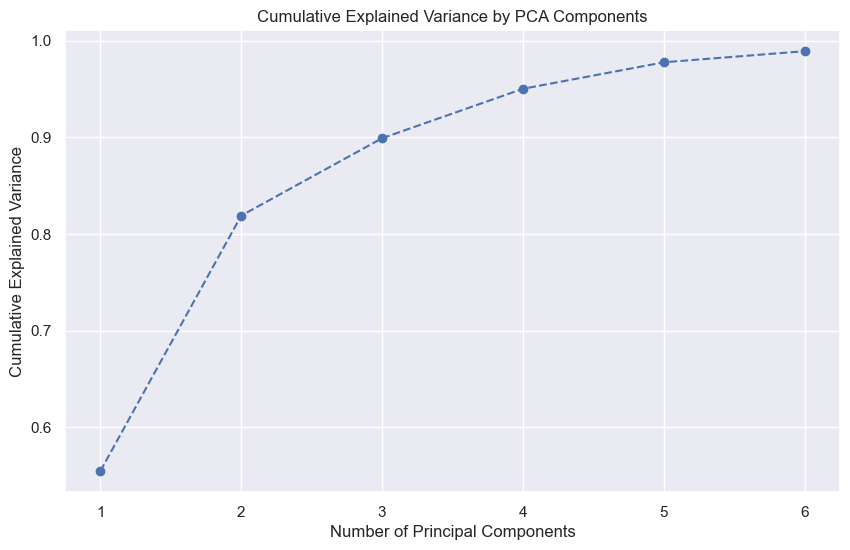

Number of components to retain 95% variance: 4
Original shape: (13611, 16)
Transformed shape: (13611, 6)
Explained Variance Ratio:
          0
0  0.554664
1  0.264310
2  0.080066
3  0.051141
4  0.027393
5  0.011498
              0         1         2         3         4         5
0     -4.981561  1.824697 -0.749021 -0.390812  0.033531  0.301212
1     -5.436792  2.932365 -2.182374 -0.431960 -1.226464  0.045575
2     -4.758088  1.826884 -0.514038 -0.125854 -0.131506  0.208538
3     -4.300541  2.003661 -3.554447  0.082964 -0.800766  0.502323
4     -6.349340  4.088205 -1.179199 -0.830357  0.037073 -0.278306
...         ...       ...       ...       ...       ...       ...
13606 -1.125616 -0.441079  0.875509 -0.719279  0.298148  0.026482
13607 -1.605011  0.495997  0.840558  0.797433 -0.017084 -0.090453
13608 -1.417515  0.141194  0.387206 -0.486439  0.383555 -0.137333
13609 -1.114666 -0.212679 -0.144088 -0.841903  0.486805 -0.097160
13610 -0.766437 -0.646514  0.994122  0.814679 -0.258258  0.

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,27282.321321,594.131894,192.113492,179.255283,1.110722,0.581136,27618.261991,188.606757,0.762459,0.988440,0.965742,0.918854,0.007283,0.002902,0.833773,0.999045
1,22832.912684,622.476637,173.487849,191.560968,0.931357,0.505471,23442.645095,188.898404,0.780104,0.983083,0.921242,0.966247,0.006582,0.003117,0.911030,0.999810
2,27889.681891,610.331359,199.179177,180.704994,1.137217,0.589703,28192.961765,192.356943,0.776745,0.988964,0.958489,0.912682,0.007169,0.002819,0.824020,0.999508
3,28646.601148,645.800721,189.132985,188.984163,1.015052,0.552357,29743.356759,193.074370,0.780796,0.976904,0.902468,0.938701,0.007018,0.002994,0.864709,0.994101
4,25688.388569,590.906817,169.874741,200.317814,0.835762,0.464111,25928.443173,192.799841,0.768707,0.989947,1.003090,0.991685,0.006310,0.003287,0.952752,0.999892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,43870.955377,768.263212,292.842264,185.280739,1.583889,0.747298,44208.122295,231.840005,0.715554,0.991212,0.901675,0.802152,0.007040,0.001859,0.647807,0.997755
13607,43090.216821,763.657010,285.067790,190.285310,1.499179,0.721746,43415.392650,232.100579,0.800618,0.991276,0.913110,0.821618,0.006807,0.001959,0.678174,0.997844
13608,43025.016763,765.240384,286.154697,190.507422,1.506169,0.716784,43419.051909,232.275409,0.730686,0.990314,0.911225,0.821339,0.006790,0.001963,0.678859,0.996464
13609,43061.568747,771.185862,288.348645,189.487959,1.525196,0.723070,43589.764608,232.267717,0.706194,0.988269,0.900037,0.816117,0.006840,0.001935,0.670630,0.994889


In [26]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(beans.drop(columns=target_col))

n_components=beans.drop(columns=target_col).shape[1]
pca = PCA(6)
X_reduced = pca.fit_transform(X_scaled)

explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# Plot explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

#pca_components lists the coefficients/loads/weights used for each column to derive PCx
pca_components = pd.DataFrame(pca.components_, columns=beans.columns.drop(target_col))


# Minimum number of principal components needed to retain at least 95% of the total variance in your PCA analysis.
n_components = next(i for i, total_var in enumerate(cumulative_variance) if total_var >= 0.95) + 1
print(f"Number of components to retain 95% variance: {n_components}")

print("Original shape:", X_scaled.shape)
print("Transformed shape:", X_reduced.shape)

print("Explained Variance Ratio:") 
print(pd.DataFrame(pca.explained_variance_ratio_))
print(pd.DataFrame(X_reduced))

# to inverse PCA and inverse Scaling
X_original_scaled = pca.inverse_transform(X_reduced)
X_reconstructed_raw = scaler.inverse_transform(X_original_scaled)
pd.DataFrame(X_reconstructed_raw,columns=beans1.columns.drop('Class'))


In [27]:
pd.DataFrame(X_reduced)

,0,1,2,3,4,5
0,-4.981561,1.824697,-0.749021,-0.390812,0.033531,0.301212
1,-5.436792,2.932365,-2.182374,-0.431960,-1.226464,0.045575
2,-4.758088,1.826884,-0.514038,-0.125854,-0.131506,0.208538
3,-4.300541,2.003661,-3.554447,0.082964,-0.800766,0.502323
4,-6.349340,4.088205,-1.179199,-0.830357,0.037073,-0.278306
...,...,...,...,...,...,...
13606,-1.125616,-0.441079,0.875509,-0.719279,0.298148,0.026482
13607,-1.605011,0.495997,0.840558,0.797433,-0.017084,-0.090453
13608,-1.417515,0.141194,0.387206,-0.486439,0.383555,-0.137333
13609,-1.114666,-0.212679,-0.144088,-0.841903,0.486805,-0.097160


In [28]:
x_pca = pd.DataFrame(X_reduced)
x_pca[target_col] = beans[target_col]
x_pca

,0,1,2,3,4,5,Class
0,-4.981561,1.824697,-0.749021,-0.390812,0.033531,0.301212,5
1,-5.436792,2.932365,-2.182374,-0.431960,-1.226464,0.045575,5
2,-4.758088,1.826884,-0.514038,-0.125854,-0.131506,0.208538,5
3,-4.300541,2.003661,-3.554447,0.082964,-0.800766,0.502323,5
4,-6.349340,4.088205,-1.179199,-0.830357,0.037073,-0.278306,5
...,...,...,...,...,...,...,...
13606,-1.125616,-0.441079,0.875509,-0.719279,0.298148,0.026482,3
13607,-1.605011,0.495997,0.840558,0.797433,-0.017084,-0.090453,3
13608,-1.417515,0.141194,0.387206,-0.486439,0.383555,-0.137333,3
13609,-1.114666,-0.212679,-0.144088,-0.841903,0.486805,-0.097160,3


# Ddistribution of beans variable

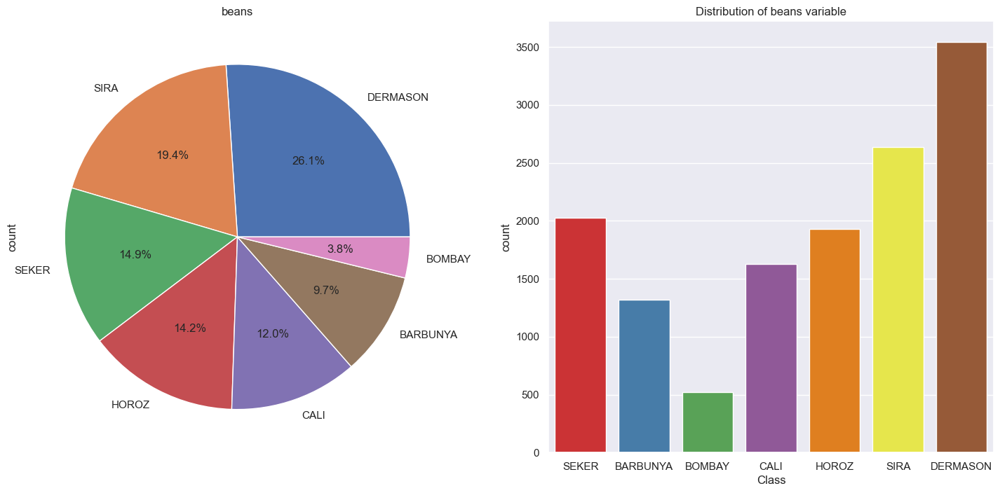

In [29]:
f,ax=plt.subplots(1,2,figsize=(18,8))
ax[0] = beans1['Class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=False)
ax[0].set_title('beans')


#f, ax = plt.subplots(figsize=(6, 8))
ax[1] = sns.countplot(x="Class", data=beans1, palette="Set1")
ax[1].set_title("Distribution of beans variable")

plt.show()

In [30]:
beans1

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


# Correlation

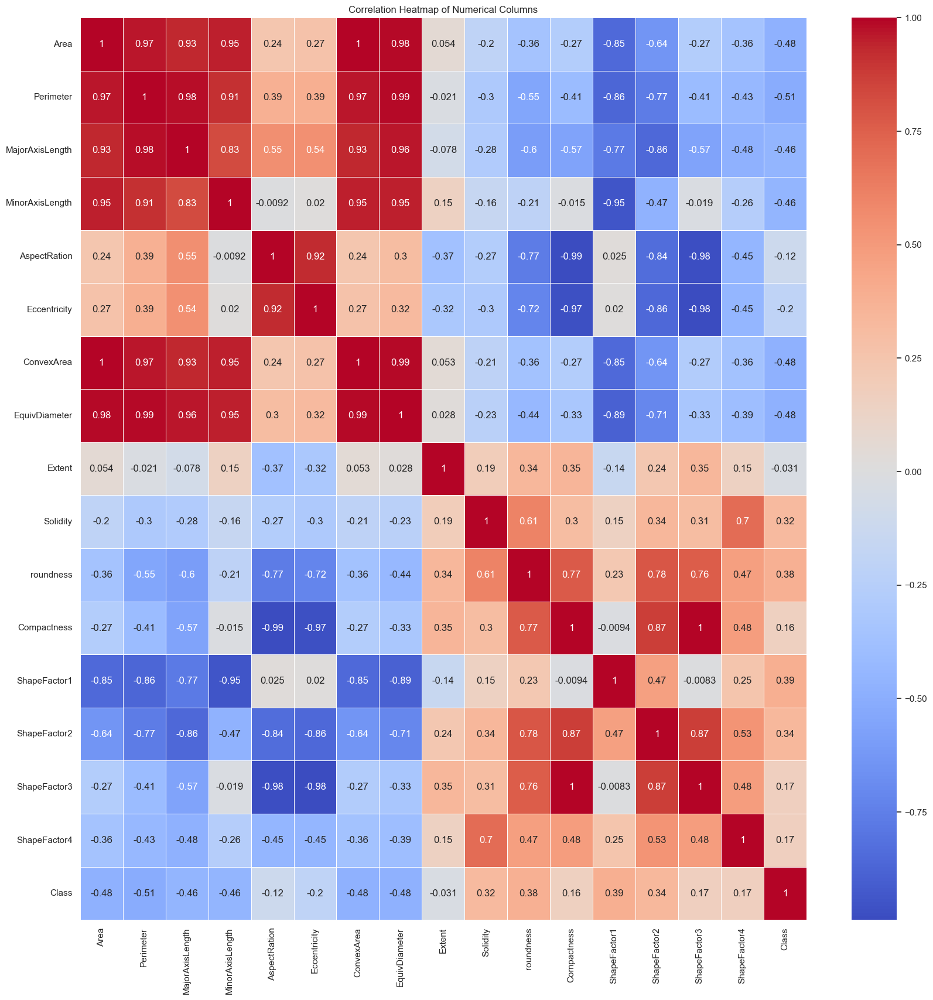

In [31]:
# Create the heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(beans.corr(numeric_only=True), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Columns')
plt.show()

# Distribution of X variables

In [32]:
beans.dtypes

Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class                int32
dtype: object

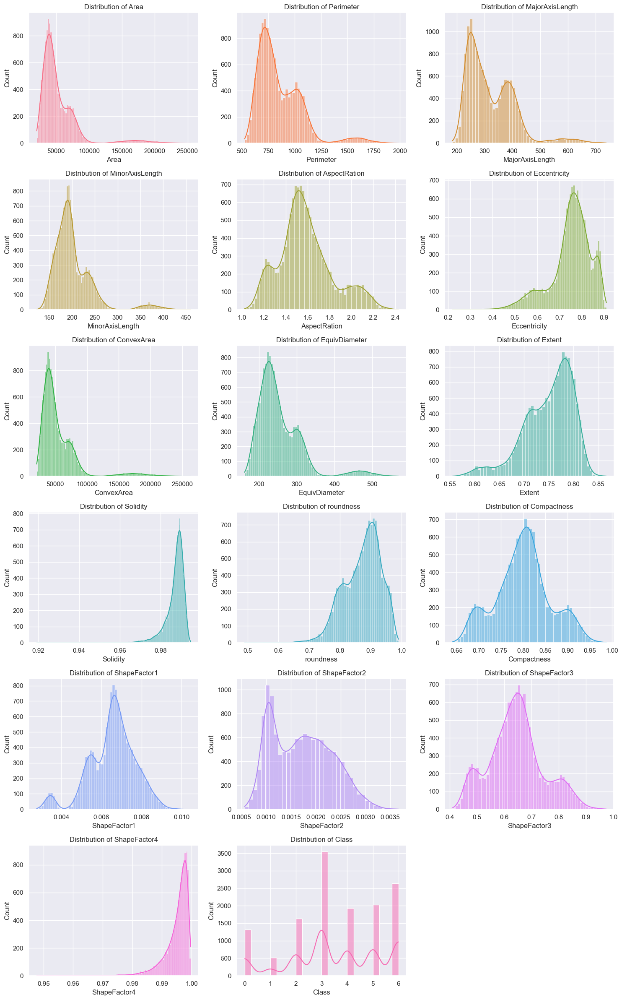

In [33]:
import math

numeric_cols = beans.select_dtypes(include=['int32','int64', 'float64']).columns

n_cols = 3
n_rows = math.ceil(len(numeric_cols) / n_cols)

fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5*n_cols, 4*n_rows))
axs = axs.flatten()

# Define a color palette
colors = sns.color_palette("husl", len(numeric_cols))  # or try "tab10", "Set2", etc.

for i, col in enumerate(numeric_cols):
    sns.histplot(beans[col], kde=True, ax=axs[i], color=colors[i])
    axs[i].set_title(f'Distribution of {col}', fontsize=12)

# Remove unused axes
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


In [34]:
beans.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063,3.532657
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366,1.828709
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687,0.000000
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703,2.000000
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386,3.000000
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883,5.000000
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733,6.000000


In [35]:
beans.dtypes

Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class                int32
dtype: object

# Class Distribution

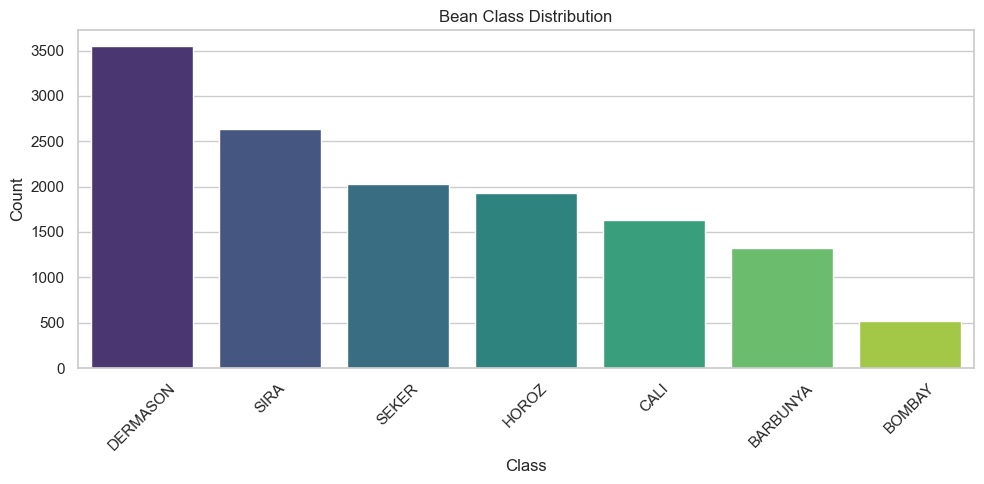

In [36]:
# Set plot style
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (14, 6)

# Class distribution
class_counts = beans1['Class'].value_counts()

# Plot class distribution
plt.figure(figsize=(10, 5))
sns.countplot(x='Class', data=beans1, order=class_counts.index, palette='viridis')
plt.title("Bean Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The bar plot shows that the dataset has 7 classes, but the distribution is not perfectly balanced:

SEKER, HOROZ, and BARBUNYA are the most frequent classes.

BOMBAY and CALI are underrepresented, indicating a potential class imbalance.

## Feature Distribution

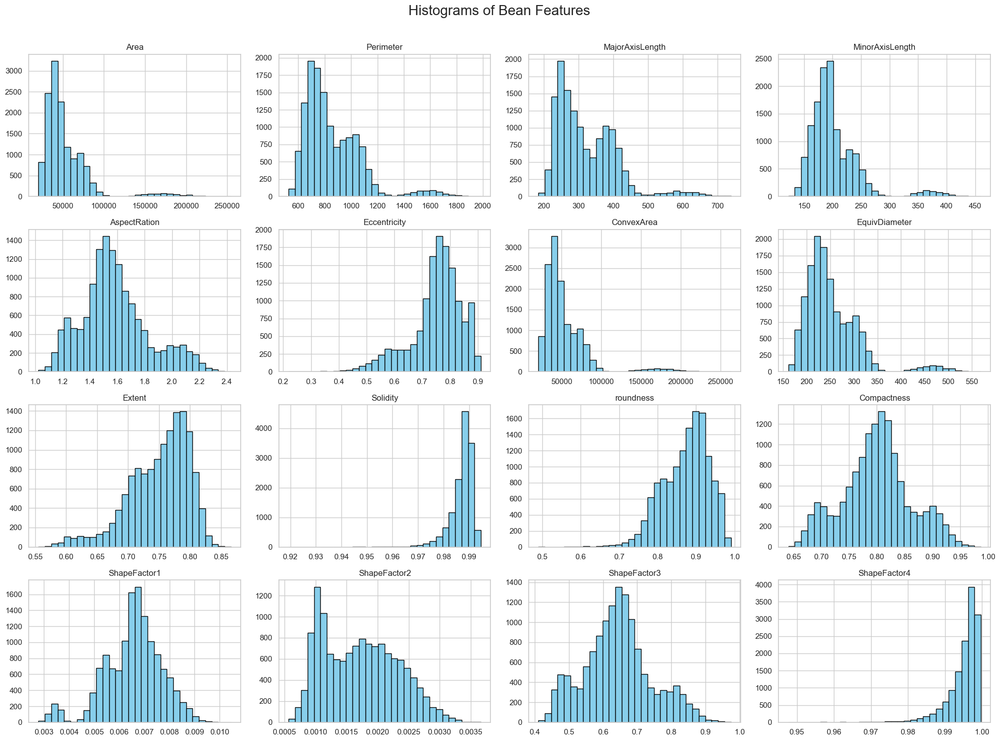

In [37]:
# Drop the target column for plotting
features = beans1.drop(columns=["Class"])

# Plot histograms for all features
features.hist(bins=30, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle("Histograms of Bean Features", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


**From the histograms:**

`Many features (like Area, Perimeter, ConvexArea) are right-skewed, indicating the presence of some larger bean measurements.`

`Some features (Solidity, Extent, Compactness) are tightly clustered near 1, reflecting geometric properties of nearly convex/round objects.`

`Features like ShapeFactor1–4 and Roundness also show compact and specific ranges, suggesting they may be normalized or ratio-based.`

# Outlier

## Boxplots of Bean Features

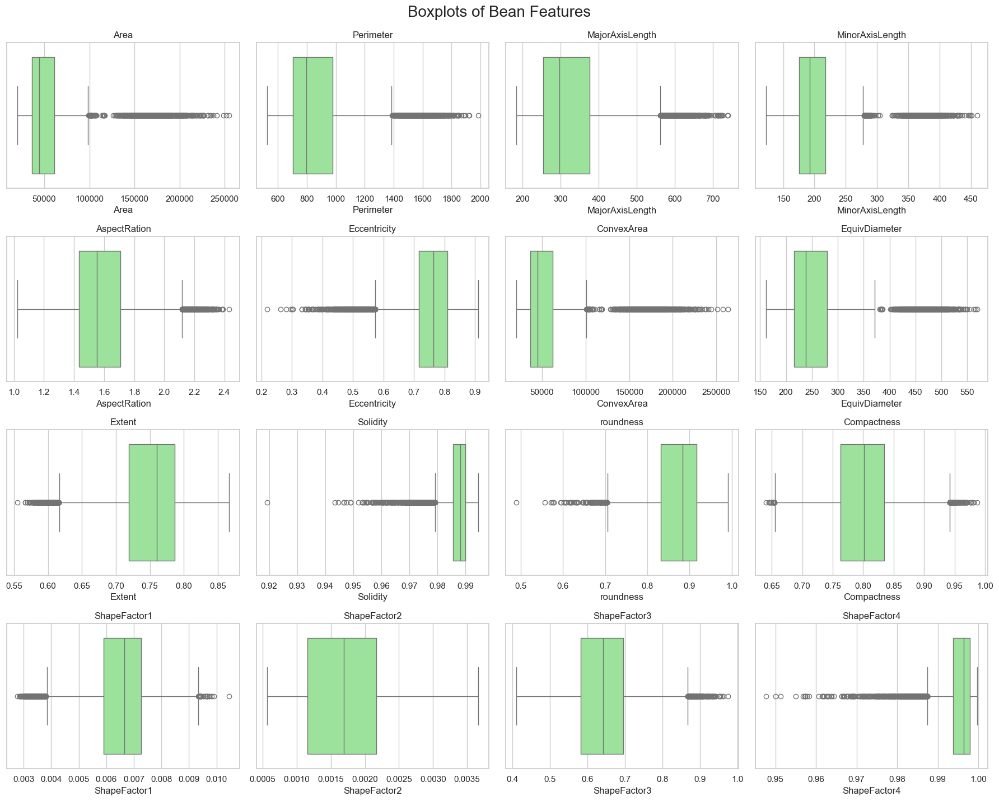

In [38]:
# Adjust subplot grid to accommodate all 16 features
plt.figure(figsize=(18, 14))
for i, col in enumerate(features.columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=features[col], color='lightgreen')
    plt.title(col)
    plt.tight_layout()

plt.suptitle("Boxplots of Bean Features", fontsize=20, y=1.02)
plt.show()

## Classwise mean and Variance

In [39]:
beans1.groupby("Class").mean

<bound method GroupBy.mean of <pandas.core.groupby.generic.DataFrameGroupBy object at 0x0000020B31A09A00>>

## Feature Distributions by Class

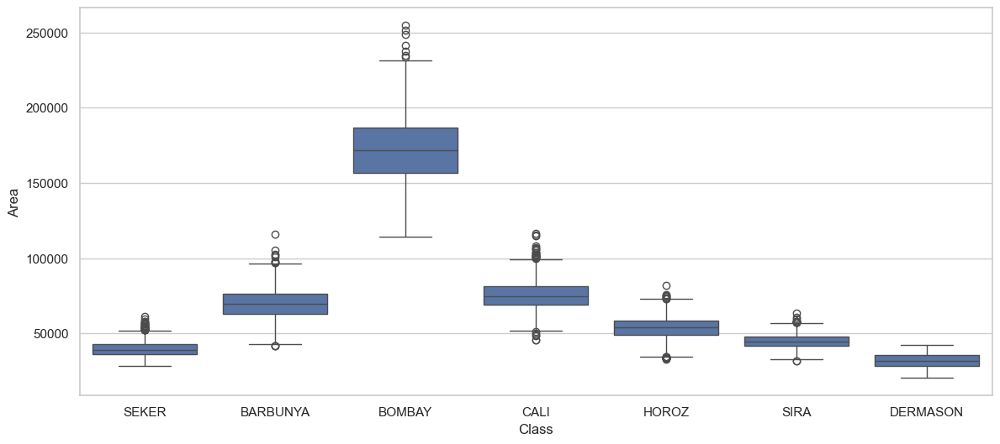

In [40]:
sns.boxplot(x='Class', y='Area', data=beans1)
plt.show()

## Pairplot / Scatterplot Matrix

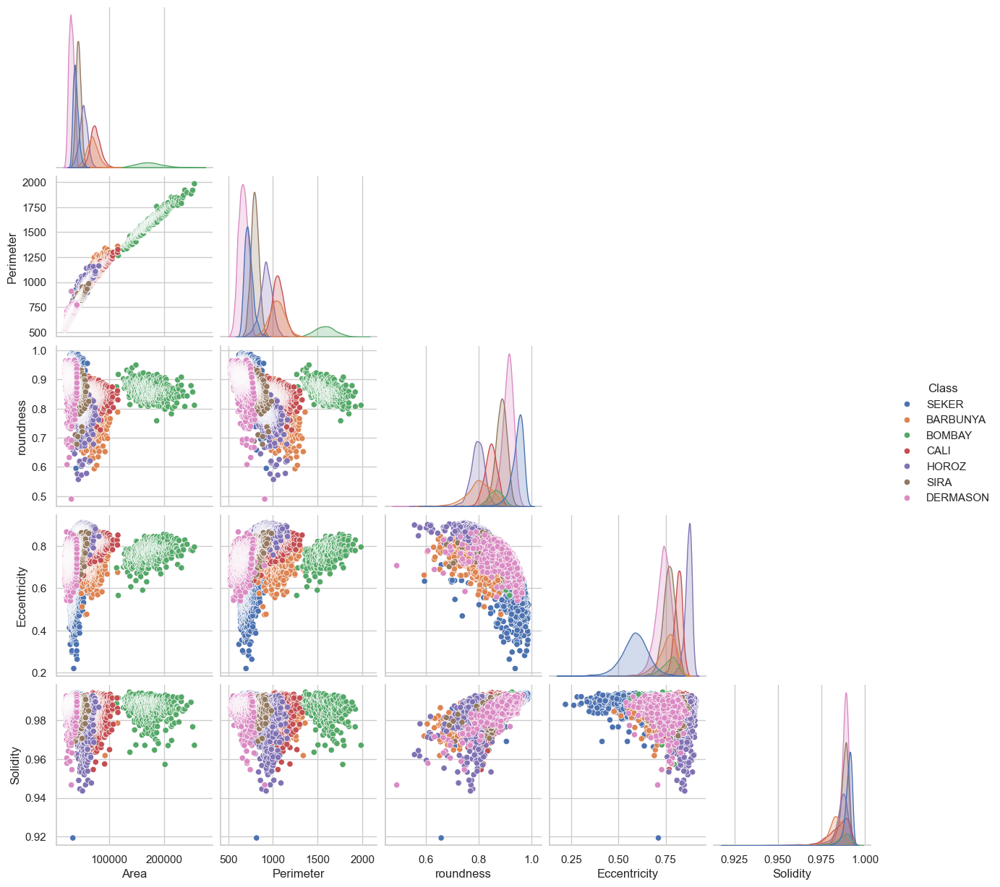

In [41]:
sns.pairplot(beans1[['Area', 'Perimeter', 'roundness', 'Eccentricity', 'Solidity', 'Class']], hue='Class', corner=True)
plt.show()

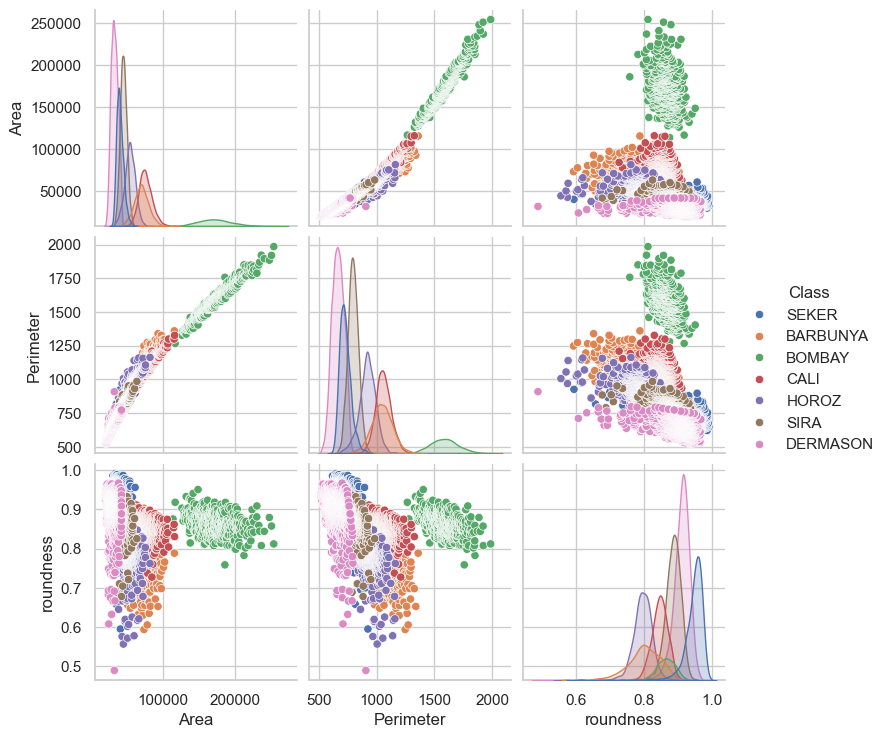

In [42]:
sns.pairplot(beans1[['Area', 'Perimeter', 'roundness', 'Class']], hue='Class')
plt.show()

## Treating Outliers

In [43]:
def iqr(df, col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr_value = q3 - q1
    lower_bound = q1 - (1.5 * iqr_value)
    upper_bound = q3 + (1.5 * iqr_value)

    outliers = (df[col] < lower_bound) | (df[col] > upper_bound)
    num_outliers = outliers.sum()
    total = df.shape[0]
    outlier_percent = (num_outliers / total) * 100

    # Apply treatment based on rules
    if outlier_percent <= 1:
        treatment = "No Treatment"
    elif outlier_percent <= 10:
        treatment = "Mean Imputation"
        mean_val = df.loc[~outliers, col].mean()
        df.loc[outliers, col] = mean_val
    elif outlier_percent <= 20:
        treatment = "Capping"
        df.loc[df[col] < lower_bound, col] = lower_bound
        df.loc[df[col] > upper_bound, col] = upper_bound
    elif outlier_percent >= 20:
        treatment = "Row Removal OR transformation OR binning"
    return num_outliers, outlier_percent, treatment, df

In [44]:
def outlier_iqr(df):
    #data = df.copy()
    cols_to_use = [col for col in df.columns if pd.api.types.is_numeric_dtype(df[col])]
    outlier_summary = []
    
    for col in cols_to_use:
        num_outliers, percent, treatment, df_iqr = iqr(df, col)
        outlier_summary.append({
            "Column": col,
            "Num Outliers": num_outliers,
            "Outlier %": round(percent, 2),
            "Treatment Applied": treatment
        })
    outlier_table = pd.DataFrame(outlier_summary)
    print(outlier_table)
    return df_iqr

In [45]:
beans_iqr = outlier_iqr(beans)
beans_iqr

             Column  Num Outliers  Outlier % Treatment Applied
0              Area           551       4.05   Mean Imputation
1         Perimeter           500       3.67   Mean Imputation
2   MajorAxisLength           379       2.78   Mean Imputation
3   MinorAxisLength           569       4.18   Mean Imputation
4      AspectRation           473       3.48   Mean Imputation
5      Eccentricity           843       6.19   Mean Imputation
6        ConvexArea           550       4.04   Mean Imputation
7     EquivDiameter           526       3.86   Mean Imputation
8            Extent           275       2.02   Mean Imputation
9          Solidity           778       5.72   Mean Imputation
10        roundness            91       0.67      No Treatment
11      Compactness           109       0.80      No Treatment
12     ShapeFactor1           533       3.92   Mean Imputation
13     ShapeFactor2             0       0.00      No Treatment
14     ShapeFactor3           195       1.43   Mean Imp

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,610.291,208.178117,173.888747,1.197191,0.766148,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,5
1,28734.0,638.018,200.524796,182.734419,1.097356,0.766148,29172.0,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.639983,0.998430,5
2,29380.0,624.110,212.826130,175.931143,1.209713,0.766148,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,5
3,30008.0,645.884,210.557999,182.516516,1.153638,0.766148,30724.0,195.467062,0.782681,0.987958,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,5
4,30140.0,620.134,201.847882,190.279279,1.060798,0.766148,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.639983,0.999166,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097.0,759.696,288.721612,185.944705,1.552728,0.765002,42508.0,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,3
13607,42101.0,757.499,281.576392,190.713136,1.476439,0.735702,42494.0,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,3
13608,42139.0,759.321,281.539928,191.187979,1.472582,0.734065,42569.0,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,3
13609,42147.0,763.779,283.382636,190.275731,1.489326,0.741055,42667.0,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,3


In [46]:
def categorize_skew(value):
    """Categorize skewness based on its magnitude."""
    if abs(value) > 1:
        return 'Highly Skewed'
    elif abs(value) > 0.5:
        return 'Moderately Skewed'
    else:
        return 'Approximately Symmetric'

def skew_summary_table(df):
    
    numeric_df = df.select_dtypes(include=['number'])  # Only numeric columns
    skew_values = numeric_df.skew()                    # Compute skewness
    skew_categories = skew_values.apply(categorize_skew)

    summary_df = pd.DataFrame({
        'Skewness': skew_values,
        'Category': skew_categories
    }).sort_values(by='Skewness', ascending=False)

    return summary_df
skew_summary_table(beans_iqr)

,Skewness,Category
ConvexArea,0.814295,Moderately Skewed
Area,0.808970,Moderately Skewed
MajorAxisLength,0.622789,Moderately Skewed
Perimeter,0.578311,Moderately Skewed
MinorAxisLength,0.552470,Moderately Skewed
EquivDiameter,0.543374,Moderately Skewed
AspectRation,0.381072,Approximately Symmetric
ShapeFactor2,0.301226,Approximately Symmetric
ShapeFactor3,0.127627,Approximately Symmetric
ShapeFactor1,0.052848,Approximately Symmetric


# Transformations

In [47]:
encoders

['Class ']

In [48]:
for col in beans.columns:
    if col in encoders:
        continue
    else:
        print(col)

Area
Perimeter
MajorAxisLength
MinorAxisLength
AspectRation
Eccentricity
ConvexArea
EquivDiameter
Extent
Solidity
roundness
Compactness
ShapeFactor1
ShapeFactor2
ShapeFactor3
ShapeFactor4
Class


In [49]:
target_col

'Class'

In [50]:
import pandas as pd
import numpy as np
from scipy.stats import boxcox, yeojohnson, skew

def best_skew_transformation(df):
    df_transformed = df.copy()
    results = []

    # Store transformation metadata per column
    transform_meta = {}  # format: {column: {"method": ..., "lambda": ...}}

    numeric_cols = df.select_dtypes(include=np.number).columns

    for col in numeric_cols:
        #if col in encoders:                                           ## Skipping the tranaformation of target Variable.
        if (col == target_col):    
            continue
        col_data = df[col].dropna()

        if col_data.nunique() <= 1:
            continue

        original_skew = skew(col_data)
        transform_results = {"Column": col, "Original Skew": round(original_skew, 4)}

        best_transform = None
        best_skew = abs(original_skew)
        best_lambda = None  # Store if Box-Cox or Yeo-Johnson is chosen

        # Log
        if (col_data > 0).all():
            log_data = np.log1p(col_data)
            log_skew = abs(skew(log_data))
            transform_results["Log Skew"] = round(log_skew, 4)
            if log_skew < best_skew:
                best_transform = ("log1p", np.log1p)
                best_skew = log_skew
        else:
            transform_results["Log Skew"] = np.nan

        # Sqrt
        if (col_data >= 0).all():
            sqrt_data = np.sqrt(col_data)
            sqrt_skew = abs(skew(sqrt_data))
            transform_results["Sqrt Skew"] = round(sqrt_skew, 4)
            if sqrt_skew < best_skew:
                best_transform = ("sqrt", np.sqrt)
                best_skew = sqrt_skew
        else:
            transform_results["Sqrt Skew"] = np.nan

        # Box-Cox
        if (col_data > 0).all():
            try:
                boxcox_data, lam_boxcox = boxcox(col_data)
                boxcox_skew = abs(skew(boxcox_data))
                transform_results["Box-Cox Skew"] = round(boxcox_skew, 4)
                if boxcox_skew < best_skew:
                    best_transform = ("boxcox", lambda x: boxcox(x)[0])
                    best_skew = boxcox_skew
                    best_lambda = lam_boxcox
            except:
                transform_results["Box-Cox Skew"] = np.nan
        else:
            transform_results["Box-Cox Skew"] = np.nan

        # Yeo-Johnson
        try:
            yeoj_data, lam_yeo = yeojohnson(col_data)
            yeoj_skew = abs(skew(yeoj_data))
            transform_results["Yeo-Johnson Skew"] = round(yeoj_skew, 4)
            if yeoj_skew < best_skew:
                best_transform = ("yeojohnson", lambda x: yeojohnson(x)[0])
                best_skew = yeoj_skew
                best_lambda = lam_yeo
        except:
            transform_results["Yeo-Johnson Skew"] = np.nan

        # Apply and record best transformation
        if best_transform:
            method_name = best_transform[0]
            transform_results["Best Transformation"] = method_name
            print(col)
            df_transformed[col] = best_transform[1](df[col])
            transform_meta[col] = {
                "method": method_name,
                "lambda": best_lambda  # may be None for log/sqrt
            }
        else:
            transform_results["Best Transformation"] = "Original"
            transform_meta[col] = {"method": "original", "lambda": None}

        results.append(transform_results)

    summary_df = pd.DataFrame(results)
    return df_transformed, summary_df, transform_meta

In [51]:
transformed_beans, skew_summary, transform_metadata = best_skew_transformation(beans_iqr)
skew_summary

Area
Perimeter
MajorAxisLength
MinorAxisLength
AspectRation
Eccentricity
ConvexArea
EquivDiameter
Extent
Solidity
roundness
Compactness
ShapeFactor1
ShapeFactor2
ShapeFactor3
ShapeFactor4


,Column,Original Skew,Log Skew,Sqrt Skew,Box-Cox Skew,Yeo-Johnson Skew,Best Transformation
0,Area,0.8089,0.2071,0.5155,0.0201,0.0201,boxcox
1,Perimeter,0.5782,0.2683,0.4228,0.0392,0.0393,boxcox
2,MajorAxisLength,0.6227,0.2683,0.4373,0.0508,0.0510,boxcox
3,MinorAxisLength,0.5524,0.2134,0.3836,0.0092,0.0093,boxcox
4,AspectRation,0.3810,0.1450,0.1873,0.0001,0.0024,boxcox
5,Eccentricity,-0.4890,0.6079,0.6297,0.0186,0.0130,yeojohnson
6,ConvexArea,0.8142,0.2152,0.5221,0.0214,0.0214,boxcox
7,EquivDiameter,0.5433,0.2306,0.3880,0.0217,0.0218,boxcox
8,Extent,-0.6405,0.7003,0.7117,0.0805,0.0707,yeojohnson
9,Solidity,-0.7538,0.7576,0.7576,0.0432,0.3475,boxcox


In [52]:
beans_iqr

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,610.291,208.178117,173.888747,1.197191,0.766148,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,5
1,28734.0,638.018,200.524796,182.734419,1.097356,0.766148,29172.0,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.639983,0.998430,5
2,29380.0,624.110,212.826130,175.931143,1.209713,0.766148,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,5
3,30008.0,645.884,210.557999,182.516516,1.153638,0.766148,30724.0,195.467062,0.782681,0.987958,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,5
4,30140.0,620.134,201.847882,190.279279,1.060798,0.766148,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.639983,0.999166,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097.0,759.696,288.721612,185.944705,1.552728,0.765002,42508.0,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,3
13607,42101.0,757.499,281.576392,190.713136,1.476439,0.735702,42494.0,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,3
13608,42139.0,759.321,281.539928,191.187979,1.472582,0.734065,42569.0,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,3
13609,42147.0,763.779,283.382636,190.275731,1.489326,0.741055,42667.0,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,3


In [53]:
transformed_beans

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,3.256115,1.354121,1.432305,1.643926,0.180303,3.542573,3.148670,1.512205,64.361784,-0.006793,35.451563,0.786718,0.006786,0.056101,0.633060,-0.001143,5
1,3.256711,1.354521,1.431297,1.646415,0.092991,3.542573,3.149369,1.512413,73.445940,-0.007875,25.868382,0.817341,0.006483,0.059696,0.512176,-0.001372,5
2,3.257820,1.354324,1.432887,1.644519,0.190746,3.542573,3.150143,1.512801,70.678604,-0.006548,33.910300,0.783235,0.006711,0.055206,0.628095,-0.000861,5
3,3.258869,1.354629,1.432606,1.646356,0.143125,3.542573,3.151639,1.513168,72.829354,-0.007082,27.914682,0.798069,0.006516,0.056697,0.649317,-0.003635,5
4,3.259086,1.354267,1.431476,1.648393,0.059056,3.542573,3.151202,1.513243,68.384221,-0.006034,39.817179,0.829854,0.006240,0.060539,0.512176,-0.000776,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,3.274805,1.355974,1.440096,1.647272,0.441959,3.529942,3.165073,1.518707,46.195268,-0.006259,29.540058,0.700970,0.006380,0.041822,0.514137,-0.001406,3
13607,3.274809,1.355951,1.439559,1.648503,0.391158,3.218429,3.165060,1.518709,81.507496,-0.006092,30.259524,0.716814,0.006232,0.043426,0.535553,-0.001529,3
13608,3.274849,1.355970,1.439556,1.648623,0.388522,3.201663,3.165129,1.518723,51.270855,-0.006424,29.780429,0.717184,0.006226,0.043454,0.536056,-0.002466,3
13609,3.274858,1.356015,1.439697,1.648392,0.399918,3.273702,3.165220,1.518726,43.383337,-0.007126,28.415443,0.713094,0.006263,0.043035,0.530501,-0.003231,3


In [54]:
transformed_beans.skew()

Area               0.020125
Perimeter          0.039238
MajorAxisLength    0.050763
MinorAxisLength    0.009244
AspectRation      -0.000117
Eccentricity      -0.012988
ConvexArea         0.021435
EquivDiameter      0.021700
Extent            -0.070743
Solidity          -0.043224
roundness         -0.057986
Compactness       -0.001527
ShapeFactor1       0.001859
ShapeFactor2       0.041153
ShapeFactor3      -0.000733
ShapeFactor4      -0.154766
Class             -0.324098
dtype: float64

In [55]:
def scale_descale(scale,df,param=None):
    if scale is None:
        raise ValueError("The 'handle' parameter is mandatory.This should be the same instace of scaling method)")
    if param is None:
        raise ValueError("The 'param' parameter is mandatory.This should be the scaled data)")  
    df_scaled = df.copy()    
    if (param == "scale"):  
        #df_scaled = pd.DataFrame(scale.fit_transform(df_scaled))
        df_scaled = pd.DataFrame(scale.fit_transform(df_scaled), columns=df_scaled.columns, index=df_scaled.index)
        return df_scaled, scale
    elif(param == "descale"):
        scaled_df, scale = descale(scale,df)

In [56]:
def descale(scale, scaled_data):
    if scale is None:
        raise ValueError("The 'handle' parameter is mandatory.This should be the same instace of scaling method)")
    if scaled_data is None:
        raise ValueError("The 'scaled_data' parameter is mandatory. This should be the scaled data.")
    
    if isinstance(scaled_data, pd.Series):
        scaled_data = scaled_data.to_frame()
    elif isinstance(scaled_data, np.ndarray) and scaled_data.ndim == 1:
        scaled_data = pd.DataFrame(scaled_data, columns=[target_col])

    print("scaled_data", scaled_data.shape)
    original = scale.inverse_transform(scaled_data)
    original_df = pd.DataFrame(original, columns=scaled_data.columns, index=scaled_data.index)
    return original_df

In [57]:
def get_transform_info(col):
    try:
        best_transform = skew_summary.loc[skew_summary['Column'] == col, 'Best Transformation'].values[0]
        lambda_val = transform_metadata[col]['lambda']
        return best_transform, lambda_val
    except Exception as e:
        raise KeyError(f"Column '{col}' not found in skew_summary or metadata: {e}")

In [58]:
def detransform(y_transformed, method,param=None):
       
    y_transformed = np.array(y_transformed)

    if method == 'log1p':
        return np.expm1(y_transformed)

    elif method == 'Original':
        return y_transformed

    elif method == 'sqrt':
        return np.square(y_transformed)

    elif method == 'boxcox':
        if param is None:
            raise ValueError("Box-Cox detransformation requires lambda parameter.")
        return inv_boxcox(y_transformed, param)

    elif method == 'yeojohnson':
        if param is None:
            raise ValueError("Yeo-Johnson detransformation requires lambda parameter.")
        #return inv_yeojohnson(y_transformed, param)
        return ((y_transformed * param) + 1) ** (1 / param) - 1

    else:
        raise ValueError(f"Unsupported transformation method: {method}")

In [59]:
def reversetransformation(df):    
    #print("here")
    df_transformed = df.copy()
    #display(df)
    method, lmbda = get_transform_info(target_col)
    #print(target_col,"::",method,":",lmbda)
    detransform(df, method, param=lmbda)
    return df_transformed

In [60]:
def mape(y_true,y_pred):
    mask = y_true != 0
    mape = np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
    return mape

In [61]:
 def smape(y_true,y_pred):
      y_true, y_pred = np.array(y_true), np.array(y_pred)
      denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
      diff = np.abs(y_true - y_pred)    
      # Avoid division by zero
      nonzero_mask = denominator != 0
      smape_value = np.mean(diff[nonzero_mask] / denominator[nonzero_mask]) * 100    
      return smape_value

In [62]:
#scale = RobustScaler()
#scale = MinMaxScaler()
scale = StandardScaler()
#scale = PowerTransformer()

In [63]:
def split_scale(scale_handle,df,target_col,flag=None,scale=False):
    if scale == True:
        if scale_handle is None:
            raise ValueError("The 'scale handle' parameter is mandatory as scaling is True)")            
    if df is None:
        raise ValueError("The 'df' parameter is mandatory.This should be the dataFrame)")
    if target_col is None:
        raise ValueError("The 'target_col' parameter is mandatory.This should be the target Variable)")  
    
    train, validation = train_test_split(df,train_size=0.75,shuffle=flag, random_state=1)    
    x_train = train.drop([target_col],axis=1)
    y_train =pd.DataFrame(train[target_col])
    
    x_validation = validation.drop([target_col],axis=1)
    y_validation = pd.DataFrame(validation[target_col])
    
    if (scale == True):
        x_train = pd.DataFrame(scale_handle.fit_transform(x_train), columns=x_train.columns, index=x_train.index)
        #y_train = pd.DataFrame(scale_handle.fit_transform(y_train), columns=y_train.columns, index=y_train.index)
        x_validation = pd.DataFrame(scale_handle.transform(x_validation), columns=x_validation.columns, index=x_validation.index)
        #y_validation = pd.DataFrame(scale_handle.fit_transform(y_validation), columns=y_validation.columns, index=y_validation.index)
    return x_train,y_train,x_validation,y_validation

In [64]:
#x_train.shape

In [65]:
#y_train.shape

In [66]:
#scaled_beans = scale_descale(scale,transformed_beans,"scale")

In [67]:
def actual_vs_predicted(model,y_validation,y_validation_pred):
    jitter=True
    print(y_validation.shape,":",y_validation_pred.shape)
    y_true = np.array(y_validation)
    y_pred = np.array(y_validation_pred)

    # Add jitter to prevent overlap
    if jitter:
        jitter_strength = 0.2
        y_true_j = y_true + np.random.uniform(-jitter_strength, jitter_strength, size=len(y_true))
        y_pred_j = y_pred + np.random.uniform(-jitter_strength, jitter_strength, size=len(y_pred))
    else:
        y_true_j = y_true
        y_pred_j = y_pred
    

    plt.figure(figsize=(8, 6))
    plt.scatter(y_true_j, y_pred_j, alpha=0.6, color='blue')
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'r--')  # Ideal diagonal
    plt.xlabel('Actual Class')
    plt.ylabel('Predicted Class')
    model_name = model.__class__.__name__
    plt.title(f'Actual vs Predicted ({model_name})')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [68]:
def predict_comparison(model):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_validation)
    
    plt.figure(figsize=(6, 6))
    plt.scatter(y_validation, y_pred, alpha=0.6, color='blue')
    plt.plot([y_validation.min(), y_validation.max()], [y_validation.min(), y_validation.max()], '--r')
    plt.xlabel("Actual Price")
    plt.ylabel("Predicted Price")
    model_name = model.__class__.__name__
    plt.title(f"Actual vs Predicted ({model_name})")    
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [69]:
def feature_importance(model):
    importances = model.feature_importances_
    feature_importance_df = pd.DataFrame({
        'Feature': beans.columns,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)
    
    # Plot feature importances
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='crest')
    plt.title("Feature Importances from Random Forest")
    plt.xlabel("Importance Score")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

In [70]:
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

def auc_roc(model,x_validation,y_validation):
    # Get prediction probabilities
    y_proba = model.predict_proba(x_validation)
    
    # Binarize true labels
    class_labels = model.classes_
    y_validation_bin = label_binarize(y_validation, classes=class_labels)
    n_classes = y_validation_bin.shape[1]

    plt.figure(figsize=(10, 6))

    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_validation_bin[:, i], y_proba[:, i])
        auc = roc_auc_score(y_validation_bin[:, i], y_proba[:, i])
        plt.plot(fpr, tpr, label=f'{class_labels[i]} (AUC = {auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    model_name = model.__class__.__name__
    plt.title(f'Multiclass ROC Curve: {model_name}')
    plt.legend()
    plt.grid(True)
    plt.show()


In [71]:
def auc_roc_binary(model):
    from sklearn.metrics import roc_auc_score, roc_curve
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(10, 6))
    #for name, model in models.items():
    y_proba = model.predict_proba(x_validation)[:, 1]
    fpr, tpr, _ = roc_curve(y_validation, y_proba)
    auc = roc_auc_score(y_validation, y_proba)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc:.2f})')
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    model_name = model.__class__.__name__
    plt.title(f'ROC Curve Comparison:({model_name})')
    plt.legend()
    plt.grid(True)
    plt.show()

In [72]:
def confusion_metrics(model,y_validation,y_pred):
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
    
    #y_pred = best_cat_model.predict(x_validation)
    cm = confusion_matrix(y_validation, y_pred)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues')
    model_name = model.__class__.__name__
    plt.title(f"Confusion Matrix: ({model_name})")
    plt.show()

In [85]:
def metrics_bar(results_df):

    metrics = ['Train_Accuracy', 'Test_Accuracy', 'Test_F1 Score']
    models = results_df['Model']
    x = np.arange(len(models))  # Label locations
    width = 0.25  # Width of the bars
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for i, metric in enumerate(metrics):
        ax.bar(x + i * width, results_df[metric], width=width, label=metric)
    
    ax.set_xticks(x + width)
    ax.set_xticklabels(models, rotation=45, ha='right')
    ax.set_ylabel('Score')
    ax.set_title('Model Performance Comparison')
    ax.legend()
    
    plt.tight_layout()
    plt.show()

## Common Model Function

In [86]:
def model_evaluation(x_train_resampled,y_train_resampled,x_validation,y_validation):
    
    models = {
    
        "Logistic regression": LogisticRegression(
                                            multi_class='multinomial',  # for true multiclass softmax
                                            solver='lbfgs',              # good for multiclass + L2 regularization
                                            max_iter=1000,
                                            random_state=42
                                            ),
        "KNN": KNeighborsClassifier(metric='minkowski', n_neighbors=11, p=1, weights='uniform'),
        "Naive Bayes": GaussianNB(var_smoothing=1e-12),
        "Decision Tree": DecisionTreeClassifier(random_state=42, criterion="entropy", max_depth=10, max_features="sqrt",
                                                min_samples_leaf=2, 
                                                min_samples_split=10,class_weight='balanced'),
        "SVC": SVC(kernel='rbf', C=1.0, decision_function_shape='ovr', probability=True, random_state=42),
        "Random Forest": RandomForestClassifier(bootstrap=False, class_weight=None, max_depth=None, max_features='sqrt', 
                                                min_samples_leaf=1, min_samples_split=5, n_estimators=286),
        "Gradient Boosting": GradientBoostingClassifier(learning_rate=0.1372820822527561, max_depth=6, max_features='sqrt', min_samples_leaf=4, 
                                                        min_samples_split=5, n_estimators=250, subsample=0.8813252137833452),
        "XGBoost": XGBClassifier(random_state=42, verbosity=0,colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, 
                                 n_estimators=200, subsample=0.8),
        "LightGBM": LGBMClassifier(verbose=-1,objective='multiclass', num_class=7, random_state=42),
        "CatBoost": CatBoostClassifier(verbose=False, random_state=42,early_stopping_rounds=20),
        "AdaBoost": AdaBoostClassifier(algorithm='SAMME', estimator=DecisionTreeClassifier(max_depth=5), learning_rate=0.4371077886262563,
                                       n_estimators=165),
        "VotingClassifier": VotingClassifier(estimators=[('lr', LogisticRegression(max_iter=1000, random_state=42)),
                                                         ('nb', GaussianNB()),
                                                        ('svm', SVC(probability=True, random_state=42))], voting='soft'),
    }
    
    results = []
    OVERFITTING_THRESHOLD = 0.05  
    UNDERFITTING_THRESHOLD = 0.85  
    
    for name, model in models.items():
        model.fit(x_train_resampled, y_train_resampled)
        y_train_pred = model.predict(x_train_resampled)
        y_validation_pred = model.predict(x_validation)
        
        #y_train_pred  = reversetransformation(scale_descale(scale,y_train_pred,param="descale")) 
        #y_validation_pred  = reversetransformation(scale_descale(scale,y_validation_pred,param="descale")) 
        
        #y_train  = reversetransformation(scale_descale(scale,y_train,param="descale"))
        #y_validation  = reversetransformation(scale_descale(scale,y_validation,param="descale"))
    
        #Dataset was split into 5 folds.The model was trained on 4 folds and tested on the remaining fold, repeated 5 times.
        #scores.mean() is the mean accuracy across those 5 tests
        
        model_name = model.__class__.__name__
        scores = cross_val_score(model, x_train_resampled, y_train_resampled, cv=5, scoring='accuracy')
        print("CV Accuracy:",model_name,":", scores.mean())
        
        
        actual_vs_predicted(model,y_validation,pd.DataFrame(y_validation_pred))
        
        print("Classification Report:", model.__class__.__name__)
        print(classification_report(y_validation, y_validation_pred))
        
        precision = precision_score(y_validation, y_validation_pred, average="weighted", pos_label=1)
        recall = recall_score(y_validation, y_validation_pred, average="weighted", pos_label=1)
        f1 = f1_score(y_validation, y_validation_pred, average="weighted", pos_label=1)
        acc = accuracy_score(y_validation, y_validation_pred)
    
        train_acc = accuracy_score(y_train_resampled, y_train_pred)
    
        # Compute overfitting as the difference
        overfit_score = train_acc - acc  # Positive value indicates potential overfitting
        overfit_flag = 'Y' if overfit_score > OVERFITTING_THRESHOLD else 'N'
    
        underfit_flag = 'Y' if train_acc < UNDERFITTING_THRESHOLD and acc < UNDERFITTING_THRESHOLD else 'N'
        
        results.append({
            "Model": name,
            "Train_Accuracy":train_acc,
            "Test_Accuracy": acc,
            "Precision": precision,
            "Test_Recall": recall,
            "Test_F1 Score": f1,        
            "Overfitting": round(overfit_score, 4),
            "Overfitting Flag": overfit_flag,
            "Underfitting Flag": underfit_flag
        })
        confusion_metrics(model,y_validation,y_validation_pred)
        auc_roc(model,x_validation,y_validation)
    
    results_df = pd.DataFrame(results).sort_values(by="Test_F1 Score", ascending=False)
    best_model = results_df.loc[results_df['Test_F1 Score'].idxmax()]
    
    print("\nModel Comparison:\n")
    #print(results_df.to_string(index=True))
    display(results_df)
    metrics_bar(results_df)
    display(pd.DataFrame(best_model))

# Class Imbalance

Sometimes best results come from combining undersampling + oversampling, or using SMOTE + TomekLinks for better boundary quality.

## Random Over sampling Sampling

In [74]:
def random_over_sampling(transformed_beans):
    from imblearn.over_sampling import RandomOverSampler
    from collections import Counter
    from sklearn.model_selection import train_test_split
    
    x = transformed_beans.drop(columns=target_col)
    y = transformed_beans[target_col]
    x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, random_state=42)
    print(x_train.shape,":",y_train.shape,":",x_test.shape,":",y_test.shape)
    
    #x_train, y_train,x_validation, y_validation = split_scale(scale_handle=scale,df=transformed_beans,target_col=target_col,flag=True,scale=False)
    
    print("Before oversampling:", Counter(y_train))
    
    ros = RandomOverSampler(random_state=42)
    x_train_resampled, y_train_resampled = ros.fit_resample(x_train, y_train)
    
    print("After oversampling:", Counter(y_train_resampled))
    return x_train_resampled,y_train_resampled,x_test,pd.DataFrame(y_test)


## Random Under sampling Sampling

In [81]:
def random_under_sampling(transformed_beans):
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from collections import Counter
    from sklearn.model_selection import train_test_split
    
    x = transformed_beans.drop(columns=target_col)
    y = transformed_beans[target_col]
    x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, random_state=42)
    print(x_train.shape,":",y_train.shape,":",x_test.shape,":",y_test.shape)
    
    #x_train, y_train,x_validation, y_validation = split_scale(scale_handle=scale,df=transformed_beans,target_col=target_col,scale=False)
    
    print("Before undersampling:", Counter(y_train))
    
    rus = RandomUnderSampler(random_state=42)
    x_train_resampled, y_train_resampled = rus.fit_resample(x_train, y_train)
    
    print("After undersampling:", Counter(y_train_resampled))
    return x_train_resampled,y_train_resampled,x_test,pd.DataFrame(y_test)
    

## SMOTE

In [76]:
def smote(transformed_beans):
    from imblearn.over_sampling import SMOTE
    from collections import Counter
    
    x = transformed_beans.drop(columns=target_col)
    y = transformed_beans[target_col]
    x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, random_state=42)
    print(x_train.shape,":",y_train.shape,":",x_test.shape,":",y_test.shape)
    
    #x_train, y_train,x_validation, y_validation = split_scale(scale_handle=scale,df=transformed_beans,target_col=target_col,scale=False)
    
    # Before applying SMOTE
    print("Original class distribution:", Counter(y_train))
    
    # Apply SMOTE
    smote = SMOTE(random_state=42)
    x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)
    
    # After applying SMOTE
    print("Resampled class distribution:", Counter(y_train_resampled))
    return x_train_resampled,y_train_resampled,x_test,pd.DataFrame(y_test)

# Model Building

## Random Over Sampling Approach - Model

(10208, 16) : (10208,) : (3403, 16) : (3403,)
Before oversampling: Counter({3: 2659, 6: 1977, 5: 1520, 4: 1446, 2: 1222, 0: 992, 1: 392})
After oversampling: Counter({5: 2659, 3: 2659, 4: 2659, 6: 2659, 2: 2659, 0: 2659, 1: 2659})
CV Accuracy: LogisticRegression : 0.6947829134230006
(3403, 1) : (3403, 1)


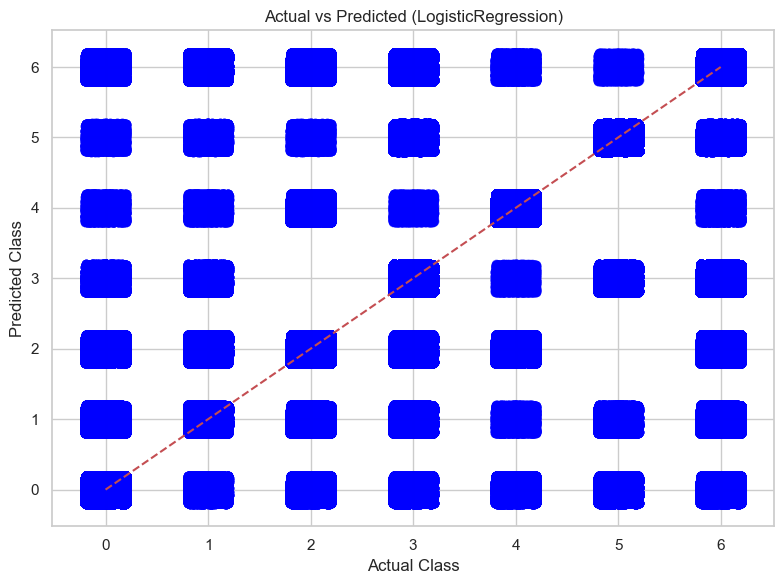

Classification Report: LogisticRegression
              precision    recall  f1-score   support

           0       0.81      0.82      0.81       330
           1       0.23      0.53      0.32       130
           2       0.58      0.70      0.64       408
           3       0.72      0.65      0.68       887
           4       0.91      0.89      0.90       482
           5       0.83      0.91      0.87       507
           6       0.52      0.36      0.43       659

    accuracy                           0.68      3403
   macro avg       0.66      0.69      0.66      3403
weighted avg       0.70      0.68      0.69      3403



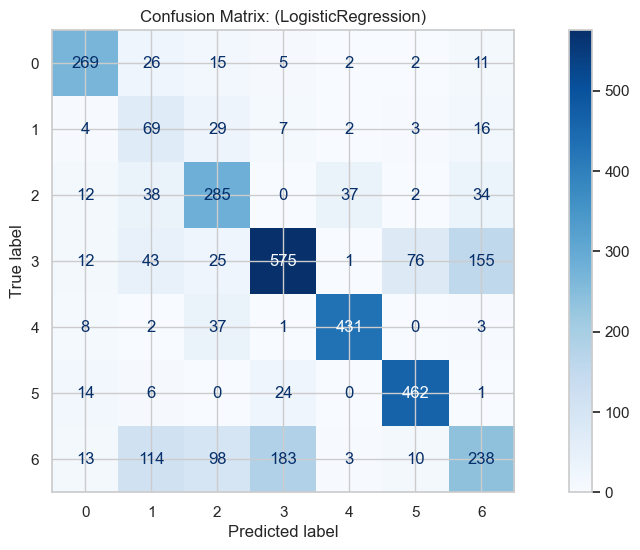

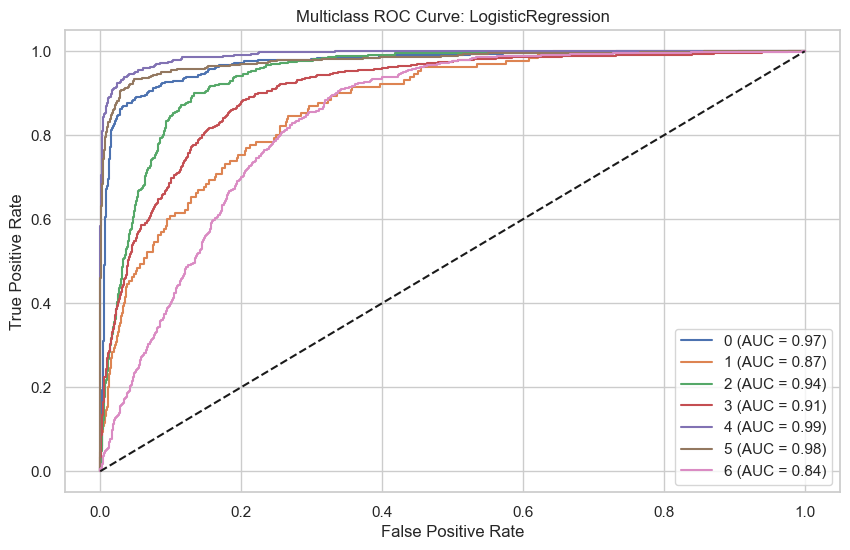

CV Accuracy: KNeighborsClassifier : 0.7178325823052973
(3403, 1) : (3403, 1)


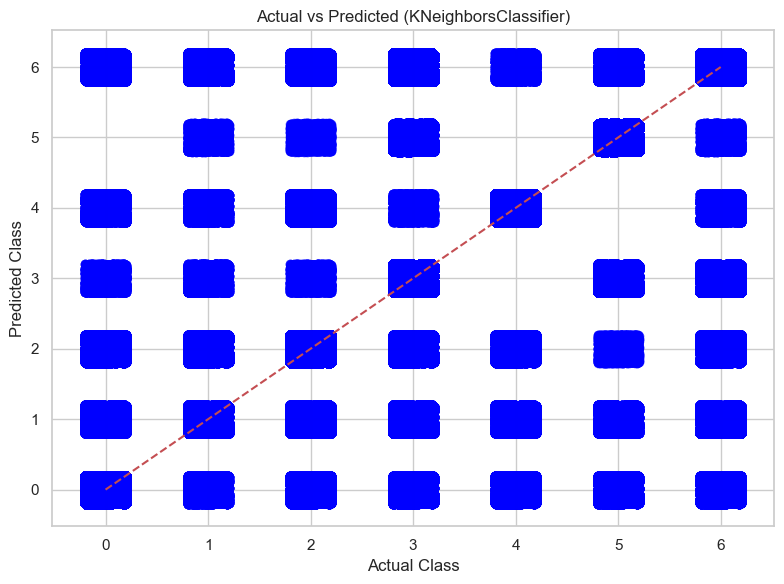

Classification Report: KNeighborsClassifier
              precision    recall  f1-score   support

           0       0.72      0.72      0.72       330
           1       0.15      0.48      0.23       130
           2       0.57      0.57      0.57       408
           3       0.73      0.60      0.66       887
           4       0.86      0.85      0.85       482
           5       0.88      0.79      0.83       507
           6       0.52      0.46      0.49       659

    accuracy                           0.64      3403
   macro avg       0.63      0.64      0.62      3403
weighted avg       0.69      0.64      0.66      3403



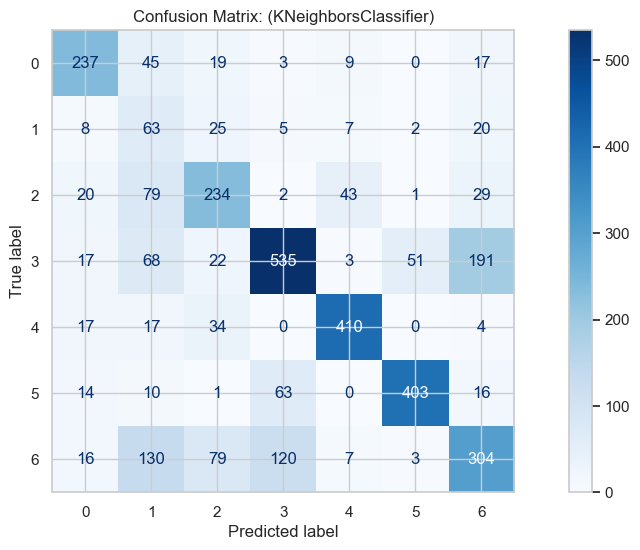

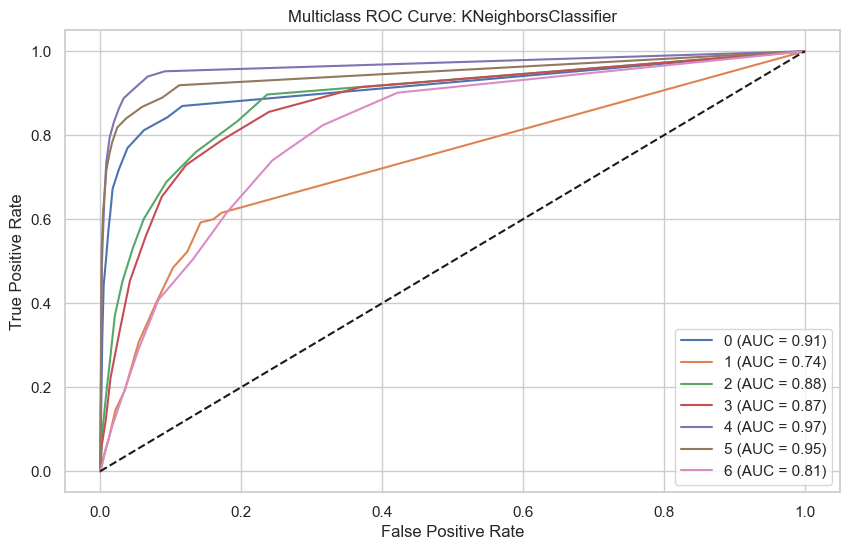

CV Accuracy: GaussianNB : 0.902165013134872
(3403, 1) : (3403, 1)


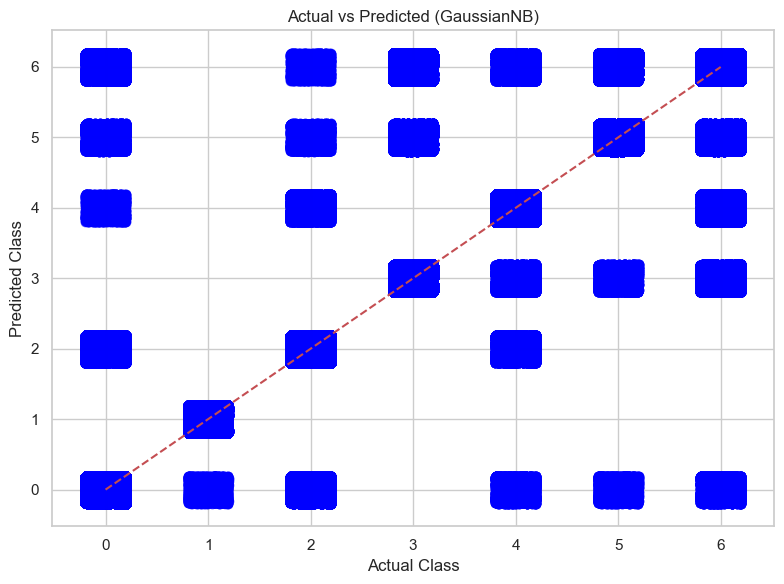

Classification Report: GaussianNB
              precision    recall  f1-score   support

           0       0.89      0.78      0.84       330
           1       1.00      0.99      1.00       130
           2       0.86      0.93      0.89       408
           3       0.94      0.84      0.89       887
           4       0.96      0.95      0.95       482
           5       0.89      0.95      0.92       507
           6       0.81      0.89      0.85       659

    accuracy                           0.89      3403
   macro avg       0.91      0.91      0.90      3403
weighted avg       0.90      0.89      0.89      3403



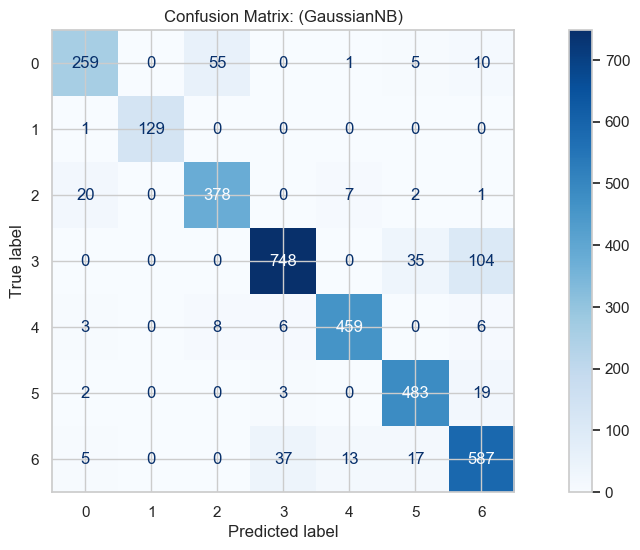

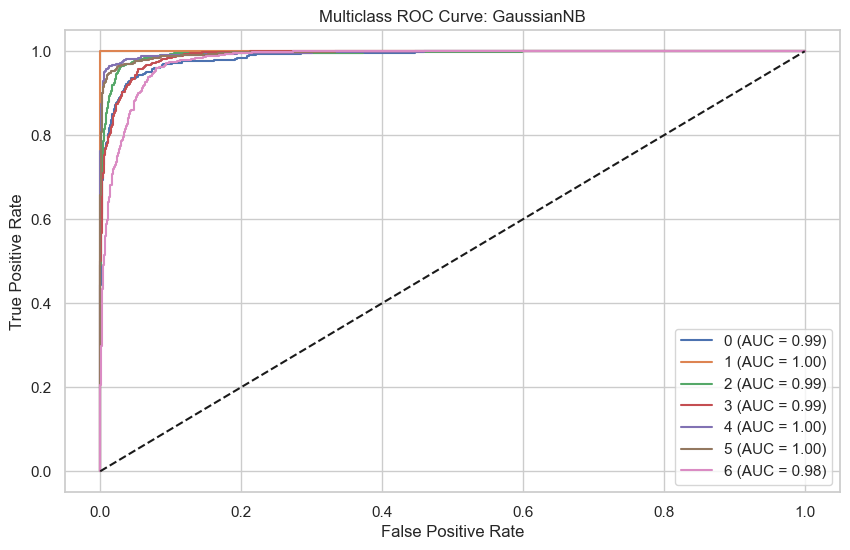

CV Accuracy: DecisionTreeClassifier : 0.9345090707184509
(3403, 1) : (3403, 1)


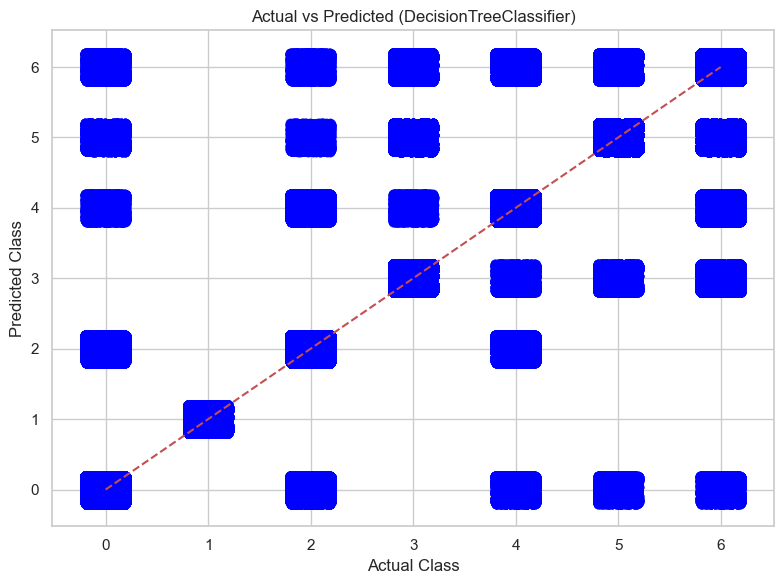

Classification Report: DecisionTreeClassifier
              precision    recall  f1-score   support

           0       0.86      0.89      0.88       330
           1       1.00      1.00      1.00       130
           2       0.92      0.89      0.90       408
           3       0.92      0.88      0.90       887
           4       0.95      0.92      0.93       482
           5       0.90      0.95      0.93       507
           6       0.82      0.86      0.84       659

    accuracy                           0.90      3403
   macro avg       0.91      0.91      0.91      3403
weighted avg       0.90      0.90      0.90      3403



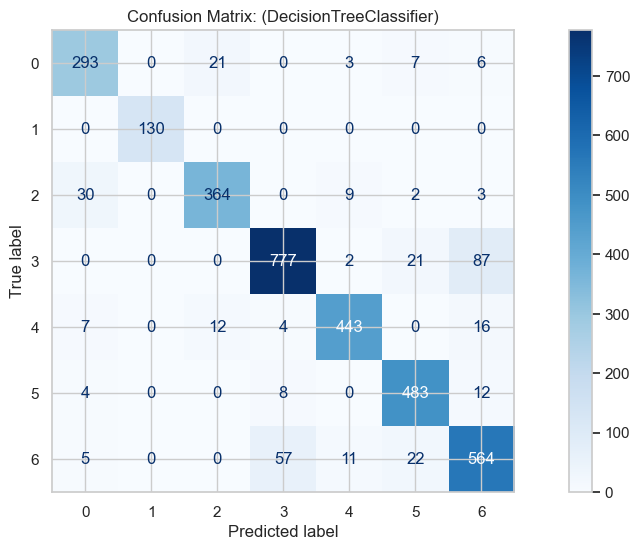

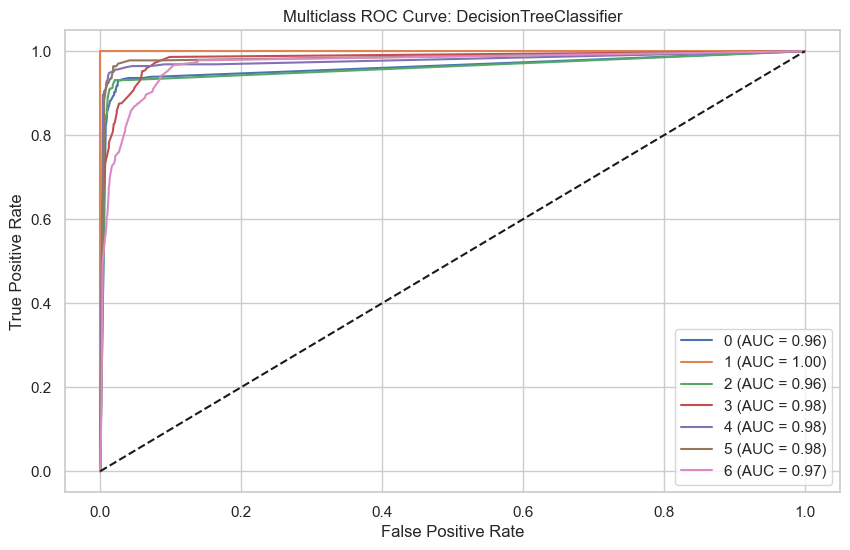

CV Accuracy: SVC : 0.6170947461522353
(3403, 1) : (3403, 1)


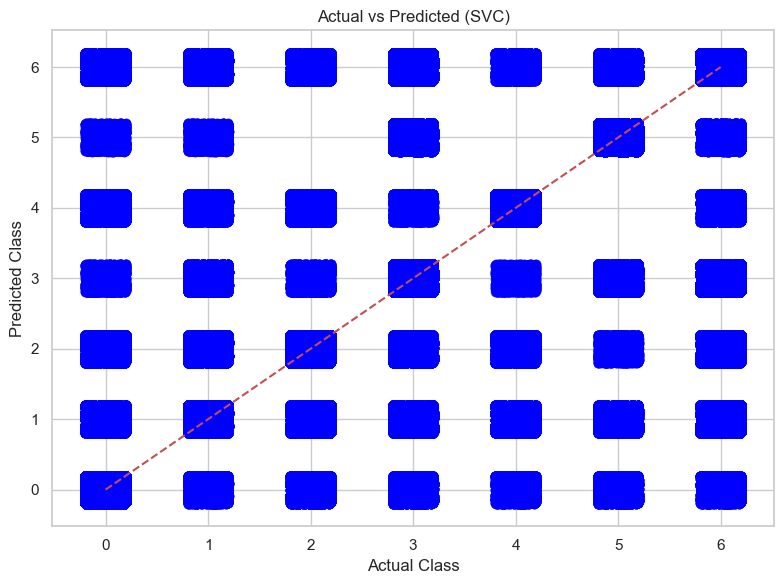

Classification Report: SVC
              precision    recall  f1-score   support

           0       0.83      0.61      0.70       330
           1       0.16      0.47      0.24       130
           2       0.52      0.51      0.51       408
           3       0.68      0.57      0.62       887
           4       0.79      0.85      0.82       482
           5       0.75      0.80      0.78       507
           6       0.51      0.46      0.48       659

    accuracy                           0.61      3403
   macro avg       0.61      0.61      0.59      3403
weighted avg       0.65      0.61      0.62      3403



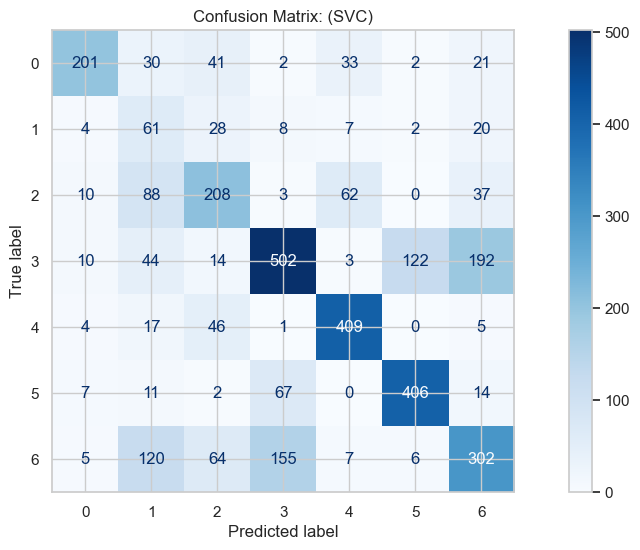

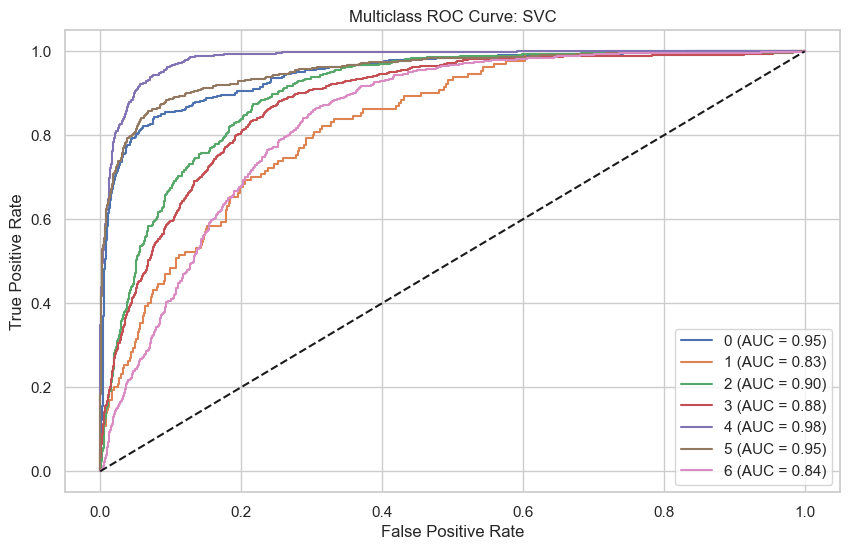

CV Accuracy: RandomForestClassifier : 0.9716338724252556
(3403, 1) : (3403, 1)


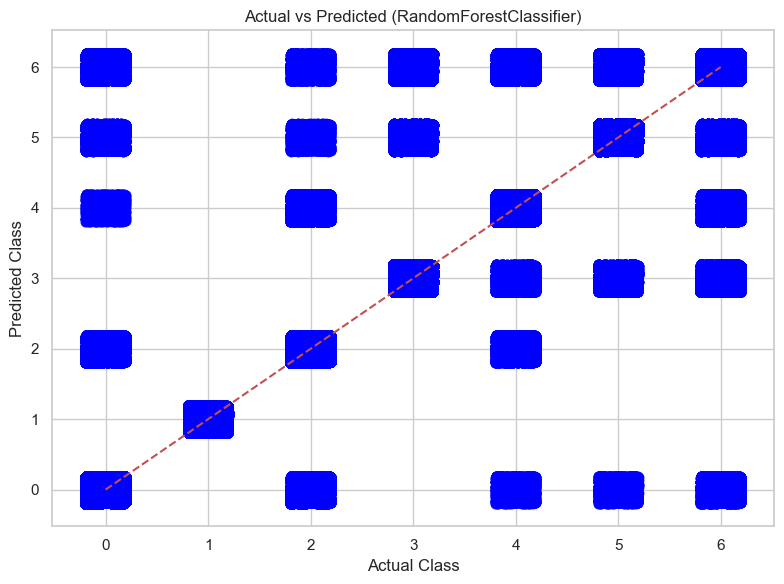

Classification Report: RandomForestClassifier
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       330
           1       1.00      1.00      1.00       130
           2       0.94      0.93      0.93       408
           3       0.91      0.92      0.91       887
           4       0.97      0.95      0.96       482
           5       0.93      0.96      0.94       507
           6       0.86      0.86      0.86       659

    accuracy                           0.92      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



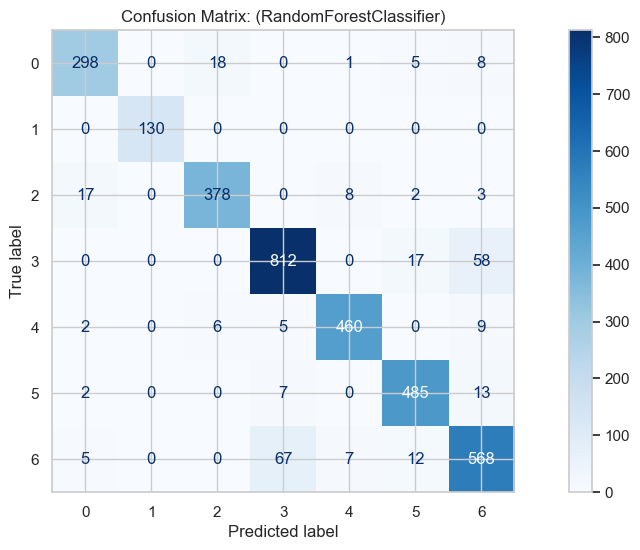

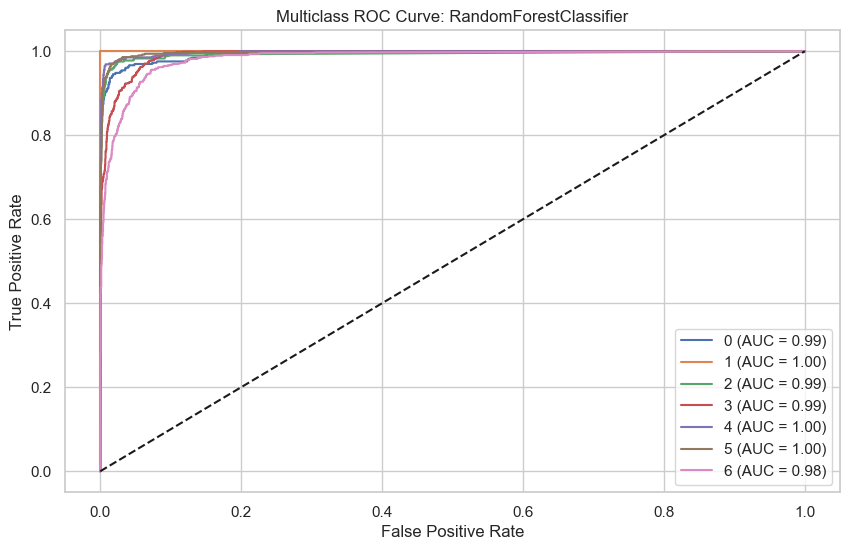

CV Accuracy: GradientBoostingClassifier : 0.9726545258044921
(3403, 1) : (3403, 1)


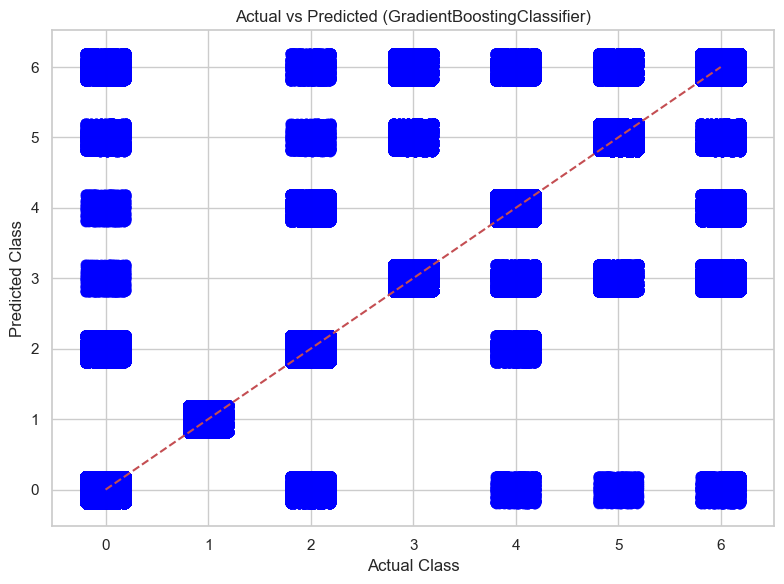

Classification Report: GradientBoostingClassifier
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.94      0.94       408
           3       0.91      0.92      0.91       887
           4       0.96      0.95      0.96       482
           5       0.94      0.95      0.95       507
           6       0.86      0.86      0.86       659

    accuracy                           0.92      3403
   macro avg       0.94      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



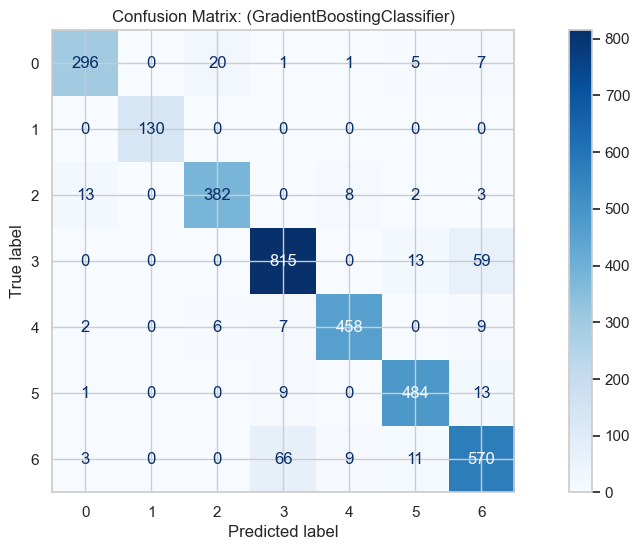

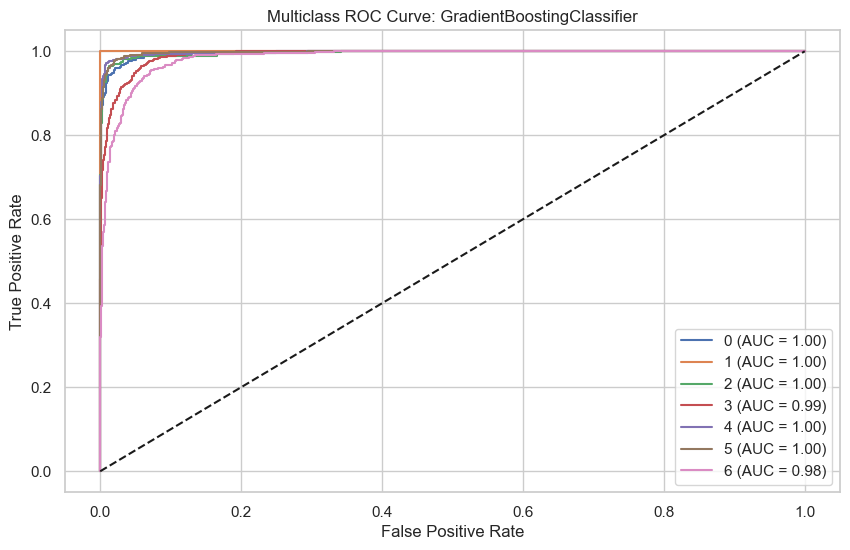

CV Accuracy: XGBClassifier : 0.9729231408285454
(3403, 1) : (3403, 1)


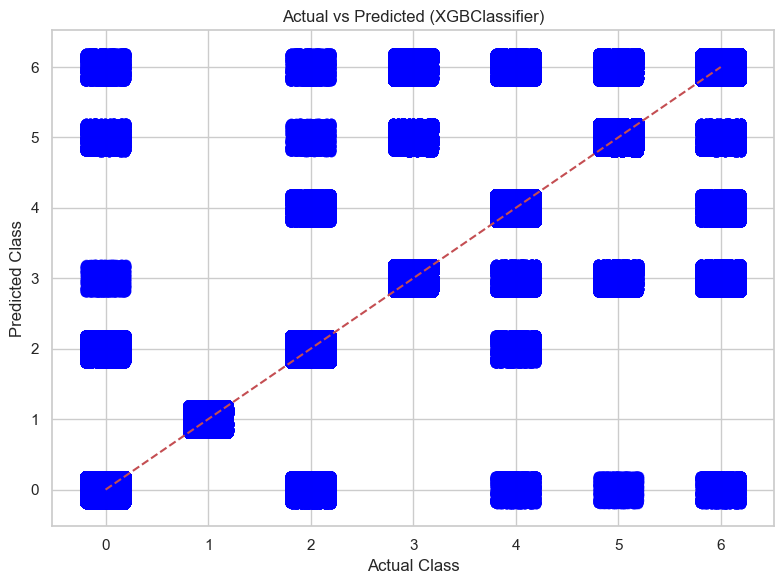

Classification Report: XGBClassifier
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.93      0.94       408
           3       0.92      0.91      0.91       887
           4       0.96      0.95      0.96       482
           5       0.94      0.95      0.94       507
           6       0.86      0.88      0.87       659

    accuracy                           0.92      3403
   macro avg       0.94      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



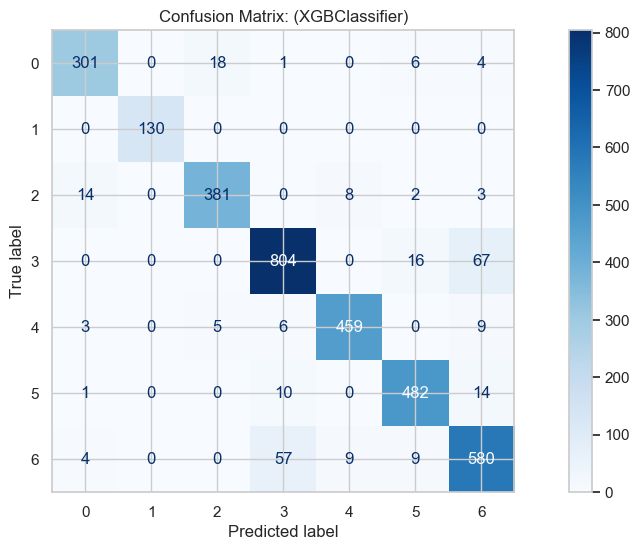

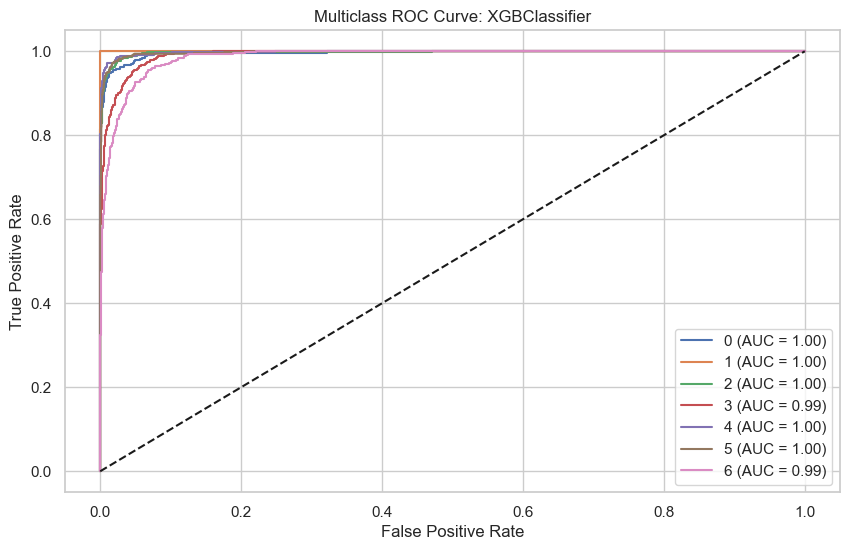

CV Accuracy: LGBMClassifier : 0.9729231841279422
(3403, 1) : (3403, 1)


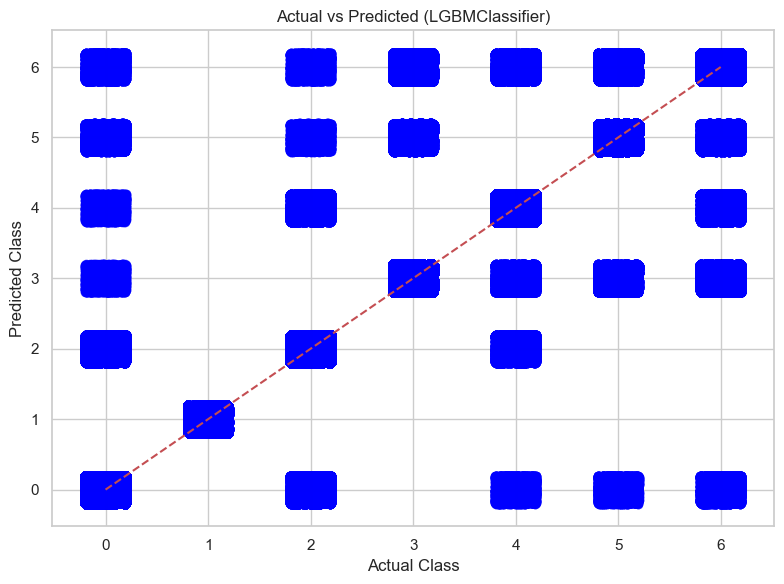

Classification Report: LGBMClassifier
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.94      0.94       408
           3       0.91      0.91      0.91       887
           4       0.96      0.95      0.96       482
           5       0.94      0.95      0.95       507
           6       0.87      0.87      0.87       659

    accuracy                           0.92      3403
   macro avg       0.94      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



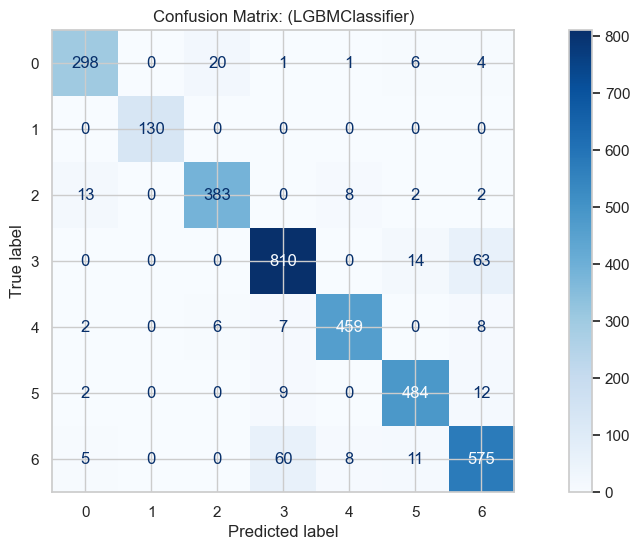

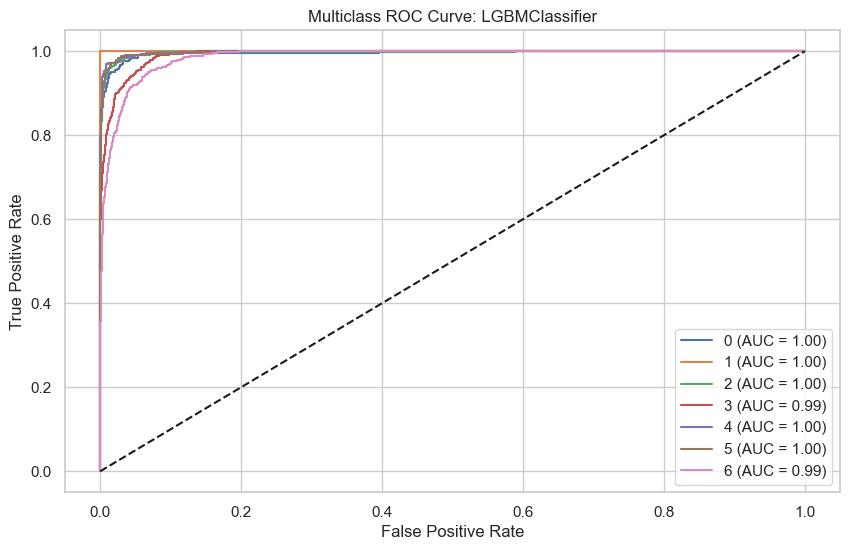

CV Accuracy: CatBoostClassifier : 0.9651325401749844
(3403, 1) : (3403, 1)


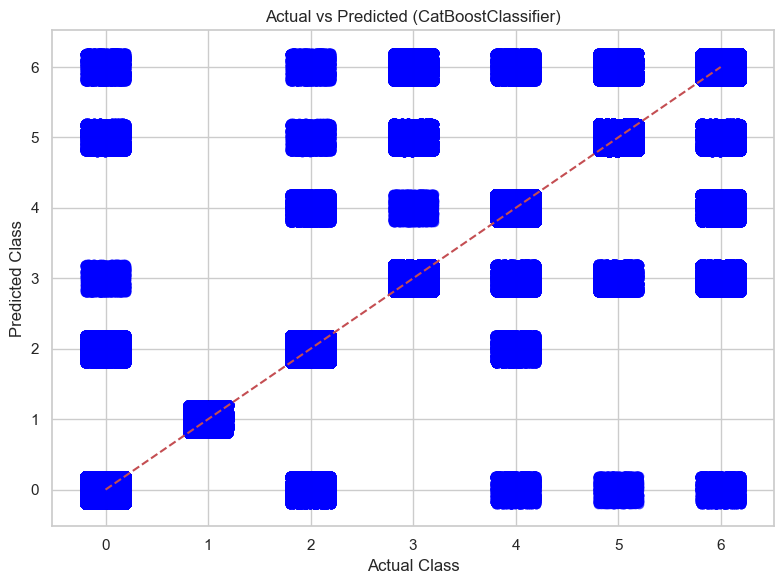

Classification Report: CatBoostClassifier
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       330
           1       1.00      1.00      1.00       130
           2       0.95      0.94      0.95       408
           3       0.92      0.90      0.91       887
           4       0.96      0.95      0.96       482
           5       0.93      0.96      0.95       507
           6       0.86      0.87      0.86       659

    accuracy                           0.92      3403
   macro avg       0.94      0.94      0.94      3403
weighted avg       0.92      0.92      0.92      3403



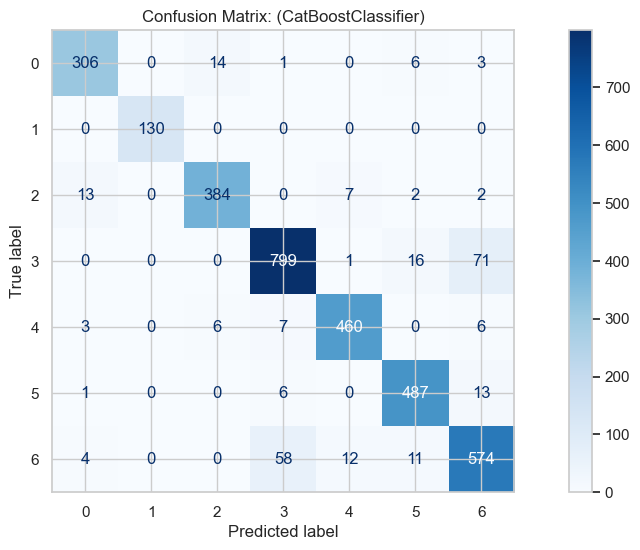

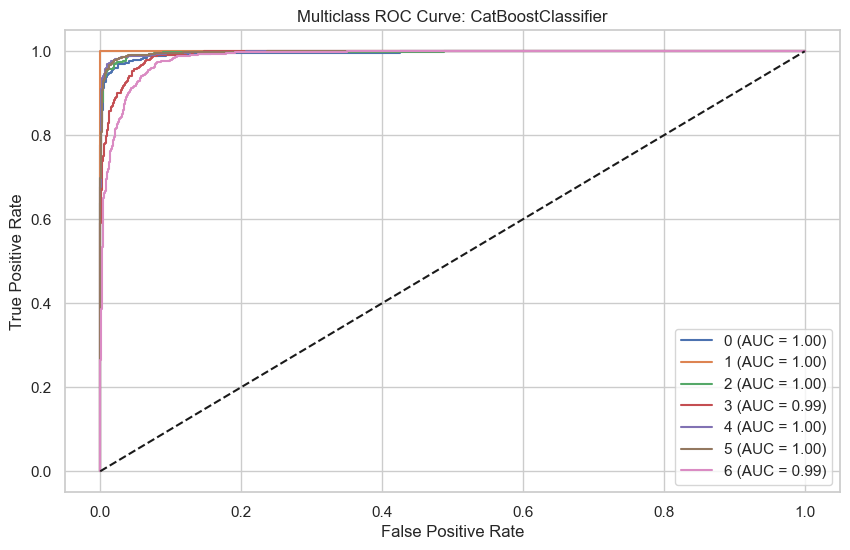

CV Accuracy: AdaBoostClassifier : 0.9548712470789145
(3403, 1) : (3403, 1)


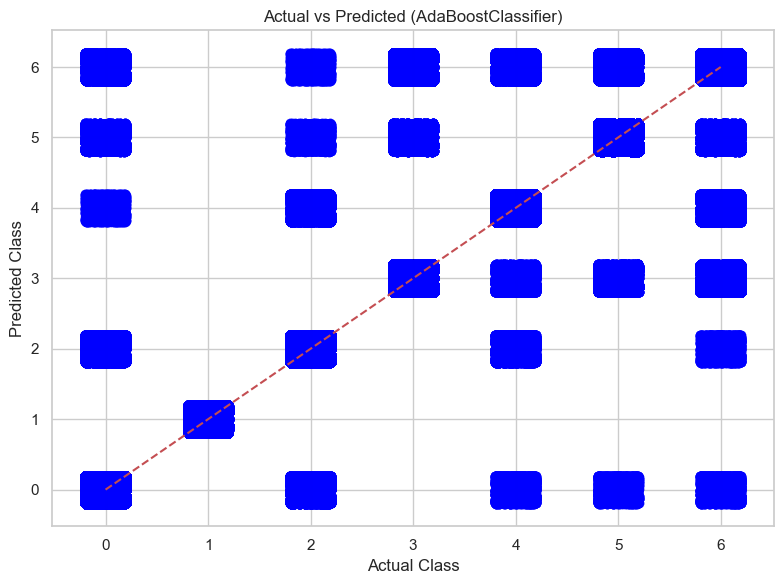

Classification Report: AdaBoostClassifier
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.94      0.94       408
           3       0.90      0.87      0.89       887
           4       0.96      0.95      0.96       482
           5       0.94      0.95      0.95       507
           6       0.81      0.85      0.83       659

    accuracy                           0.91      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.91      0.91      0.91      3403



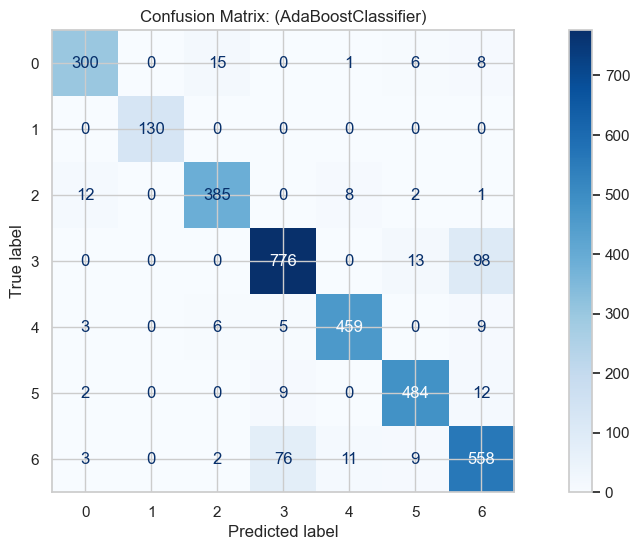

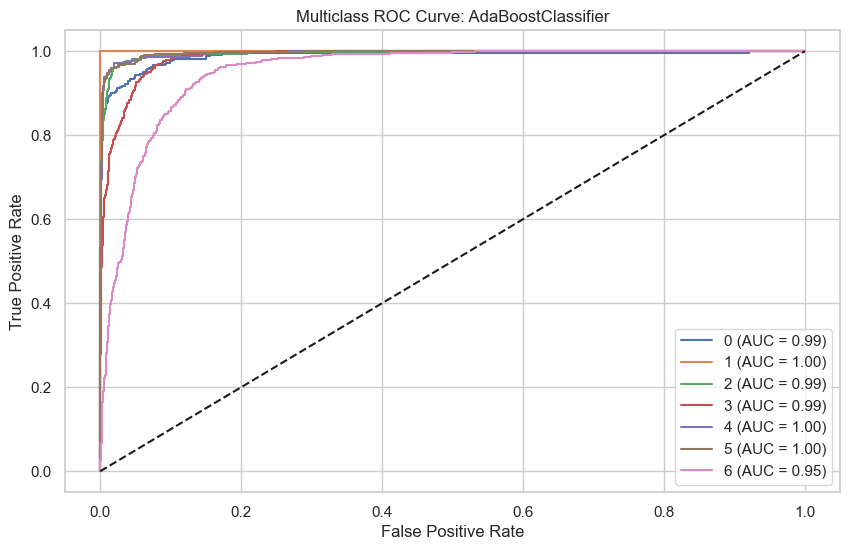

CV Accuracy: VotingClassifier : 0.898511482206185
(3403, 1) : (3403, 1)


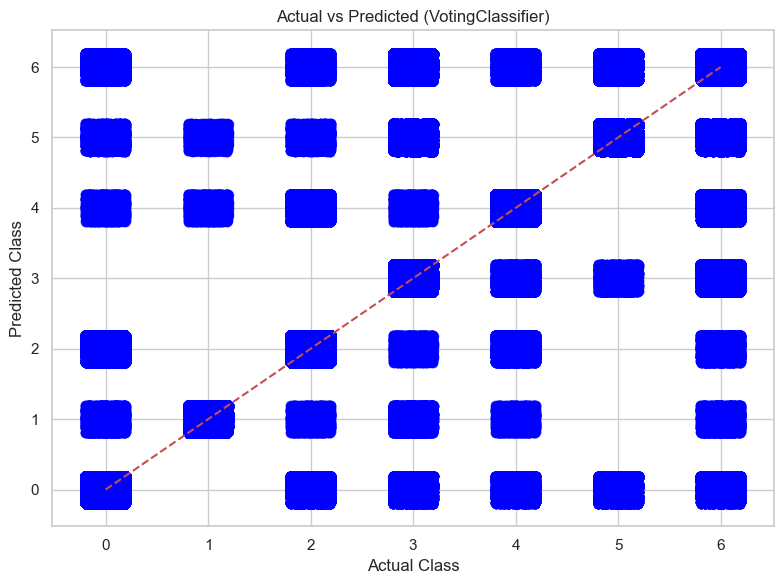

Classification Report: VotingClassifier
              precision    recall  f1-score   support

           0       0.86      0.86      0.86       330
           1       0.93      0.98      0.96       130
           2       0.90      0.90      0.90       408
           3       0.94      0.82      0.88       887
           4       0.94      0.95      0.94       482
           5       0.88      0.94      0.91       507
           6       0.80      0.88      0.84       659

    accuracy                           0.89      3403
   macro avg       0.89      0.91      0.90      3403
weighted avg       0.89      0.89      0.89      3403



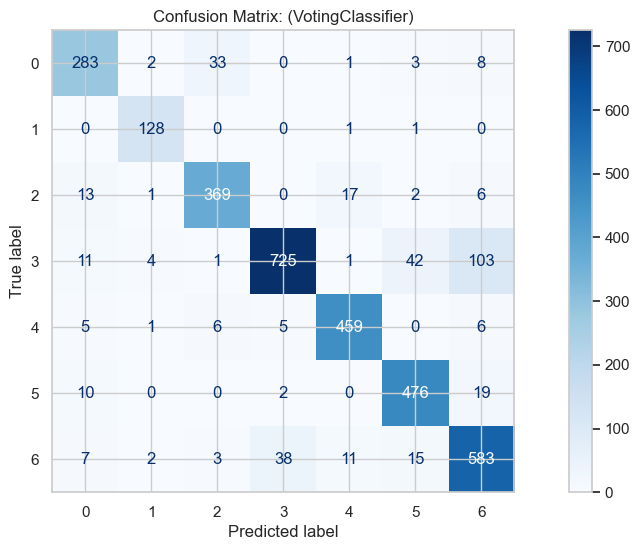

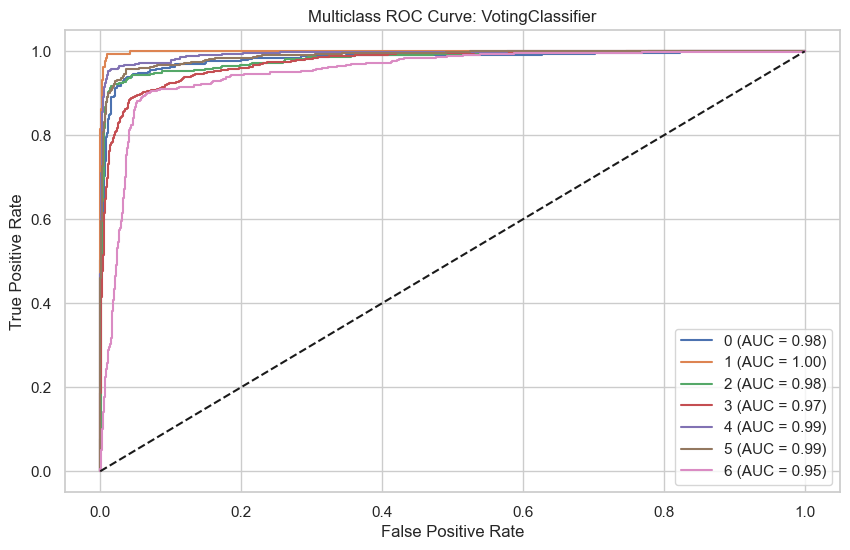


Model Comparison:



,Model,Train_Accuracy,Test_Accuracy,Precision,Test_Recall,Test_F1 Score,Overfitting,Overfitting Flag,Underfitting Flag
9,CatBoost,0.991887,0.922715,0.922900,0.922715,0.922743,0.0692,Y,N
8,LightGBM,0.999893,0.922421,0.922560,0.922421,0.922448,0.0775,Y,N
7,XGBoost,1.000000,0.921834,0.922249,0.921834,0.921978,0.0782,Y,N
6,Gradient Boosting,1.000000,0.921246,0.921435,0.921246,0.921269,0.0788,Y,N
5,Random Forest,1.000000,0.920071,0.920153,0.920071,0.920066,0.0799,Y,N
10,AdaBoost,0.972654,0.908610,0.909349,0.908610,0.908852,0.0640,Y,N
3,Decision Tree,0.959813,0.897443,0.898667,0.897443,0.897685,0.0624,Y,N
2,Naive Bayes,0.902165,0.894211,0.897698,0.894211,0.894193,0.0080,N,N
11,VotingClassifier,0.898351,0.888334,0.891623,0.888334,0.888292,0.0100,N,N
0,Logistic regression,0.698007,0.684396,0.698718,0.684396,0.685120,0.0136,N,Y


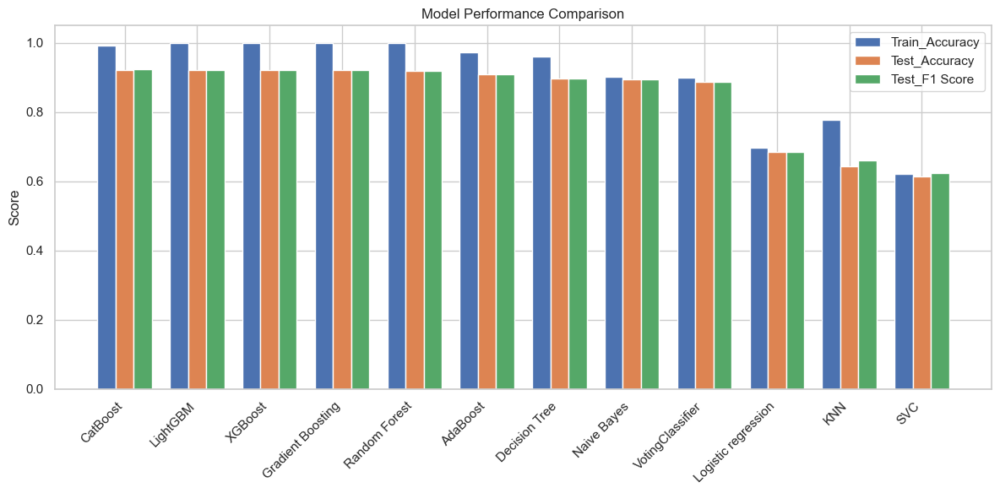

,9
Model,CatBoost
Train_Accuracy,0.991887
Test_Accuracy,0.922715
Precision,0.9229
Test_Recall,0.922715
Test_F1 Score,0.922743
Overfitting,0.0692
Overfitting Flag,Y
Underfitting Flag,N


In [87]:
x_train_resampled,y_train_resampled,x_test,y_test = random_over_sampling(transformed_beans)
model_evaluation(x_train_resampled,y_train_resampled,x_test,y_test)

## Random Under Sampling Approach - Model

(10208, 16) : (10208,) : (3403, 16) : (3403,)
Before undersampling: Counter({3: 2659, 6: 1977, 5: 1520, 4: 1446, 2: 1222, 0: 992, 1: 392})
After undersampling: Counter({0: 392, 1: 392, 2: 392, 3: 392, 4: 392, 5: 392, 6: 392})
CV Accuracy: LogisticRegression : 0.6836770239187375
(3403, 1) : (3403, 1)


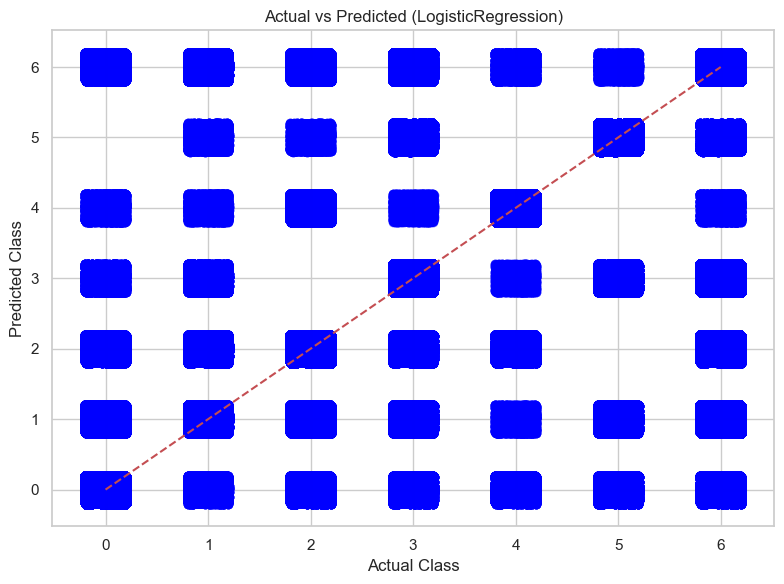

Classification Report: LogisticRegression
              precision    recall  f1-score   support

           0       0.80      0.82      0.81       330
           1       0.21      0.51      0.30       130
           2       0.60      0.67      0.63       408
           3       0.73      0.65      0.68       887
           4       0.90      0.90      0.90       482
           5       0.83      0.90      0.86       507
           6       0.53      0.38      0.44       659

    accuracy                           0.68      3403
   macro avg       0.66      0.69      0.66      3403
weighted avg       0.70      0.68      0.69      3403



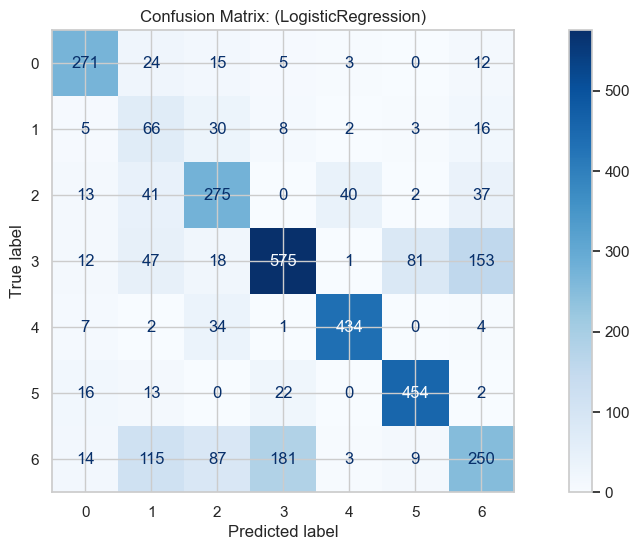

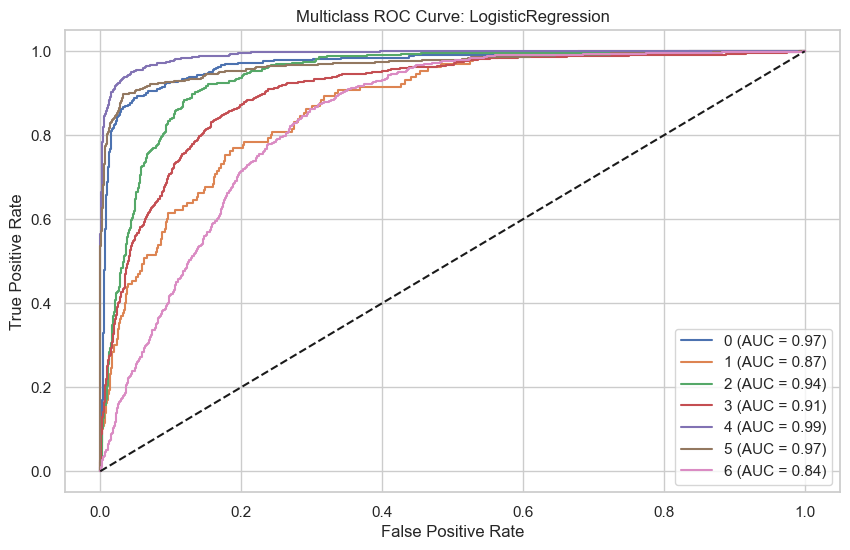

CV Accuracy: KNeighborsClassifier : 0.5998517543509766
(3403, 1) : (3403, 1)


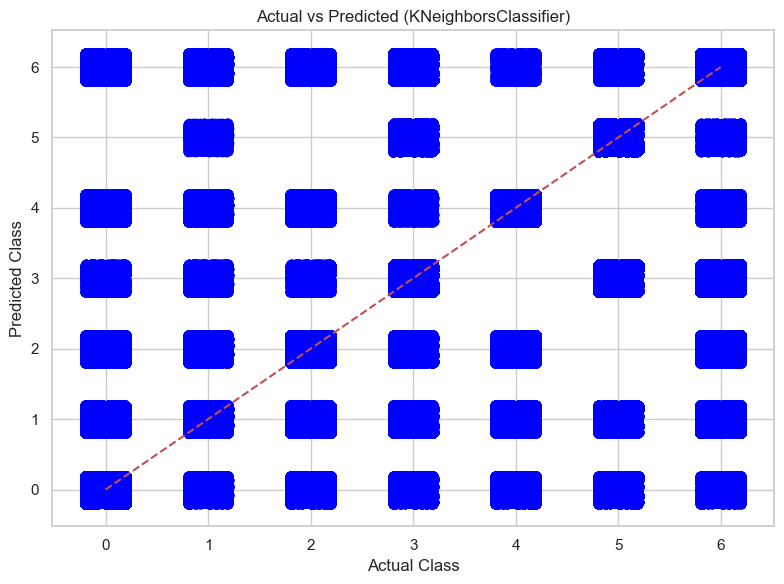

Classification Report: KNeighborsClassifier
              precision    recall  f1-score   support

           0       0.75      0.71      0.73       330
           1       0.15      0.48      0.23       130
           2       0.54      0.59      0.56       408
           3       0.66      0.59      0.63       887
           4       0.84      0.76      0.80       482
           5       0.82      0.77      0.79       507
           6       0.49      0.39      0.44       659

    accuracy                           0.61      3403
   macro avg       0.61      0.61      0.60      3403
weighted avg       0.65      0.61      0.63      3403



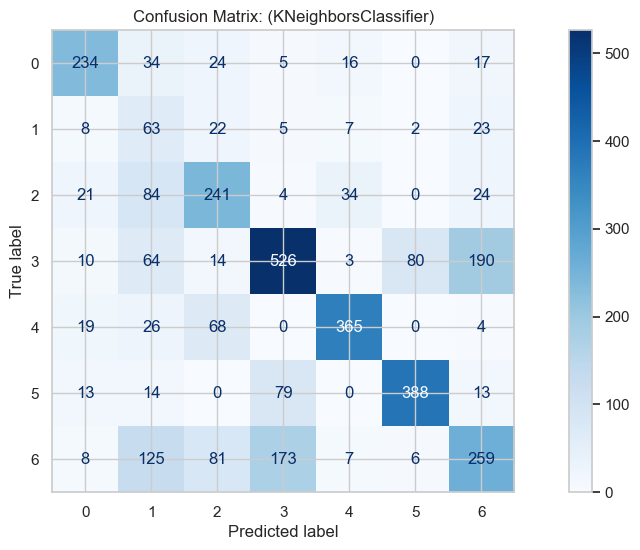

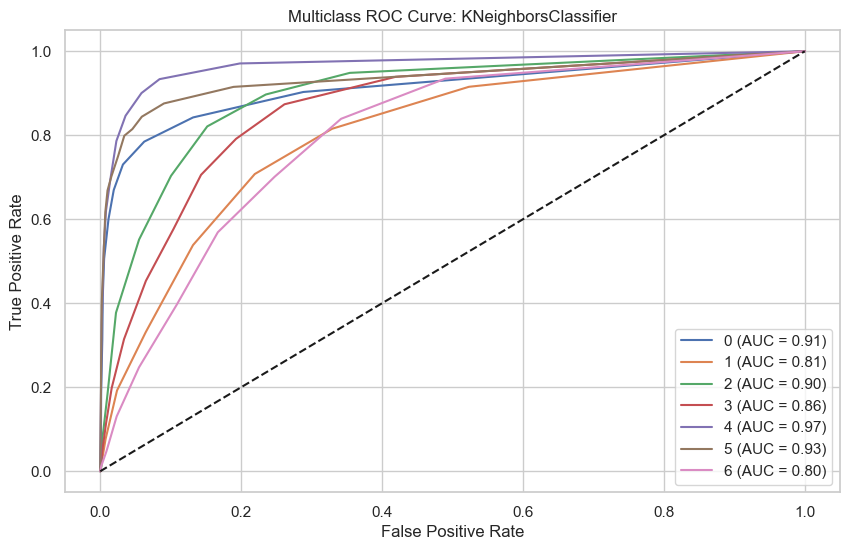

CV Accuracy: GaussianNB : 0.8939584912182734
(3403, 1) : (3403, 1)


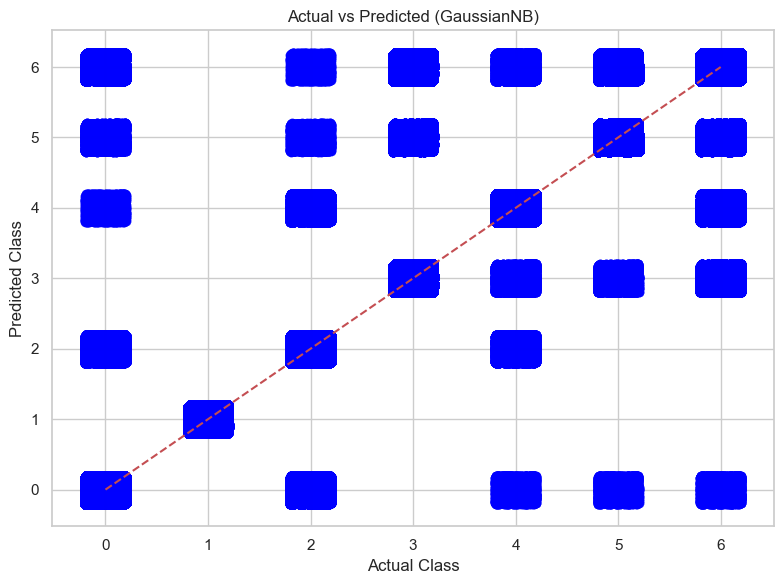

Classification Report: GaussianNB
              precision    recall  f1-score   support

           0       0.90      0.78      0.83       330
           1       1.00      1.00      1.00       130
           2       0.86      0.92      0.89       408
           3       0.94      0.84      0.89       887
           4       0.94      0.96      0.95       482
           5       0.90      0.95      0.92       507
           6       0.80      0.88      0.84       659

    accuracy                           0.89      3403
   macro avg       0.90      0.90      0.90      3403
weighted avg       0.89      0.89      0.89      3403



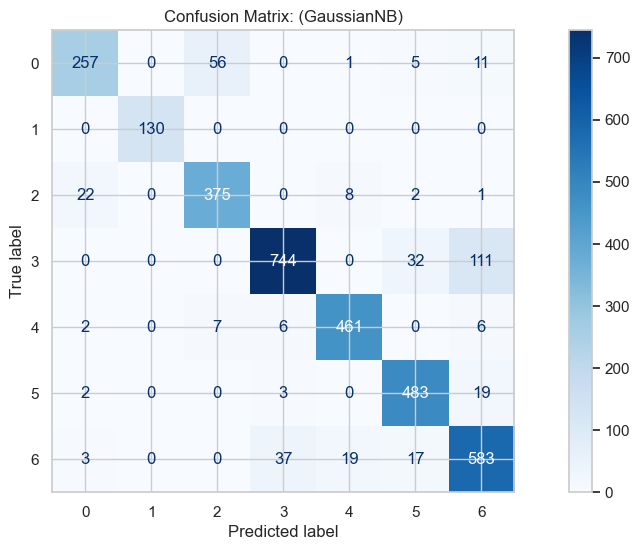

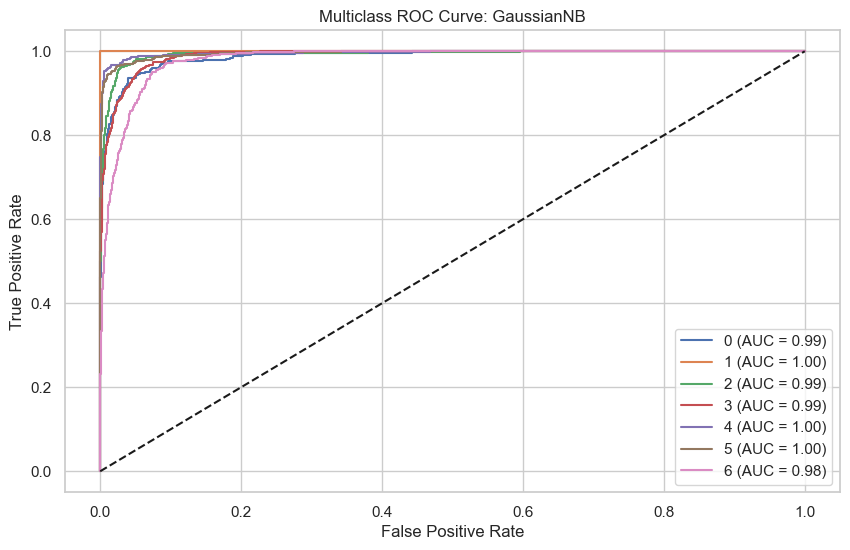

CV Accuracy: DecisionTreeClassifier : 0.8804727906080065
(3403, 1) : (3403, 1)


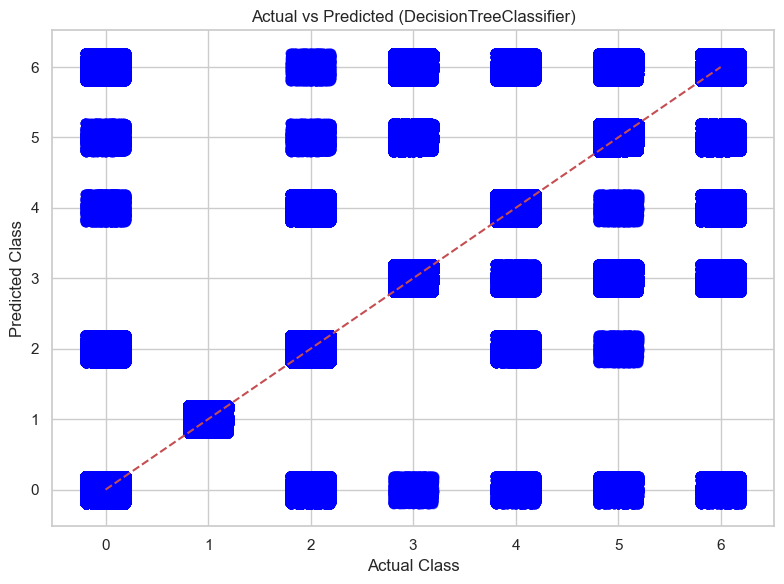

Classification Report: DecisionTreeClassifier
              precision    recall  f1-score   support

           0       0.83      0.85      0.84       330
           1       1.00      1.00      1.00       130
           2       0.90      0.87      0.88       408
           3       0.89      0.83      0.86       887
           4       0.93      0.93      0.93       482
           5       0.91      0.92      0.91       507
           6       0.77      0.84      0.81       659

    accuracy                           0.87      3403
   macro avg       0.89      0.89      0.89      3403
weighted avg       0.88      0.87      0.87      3403



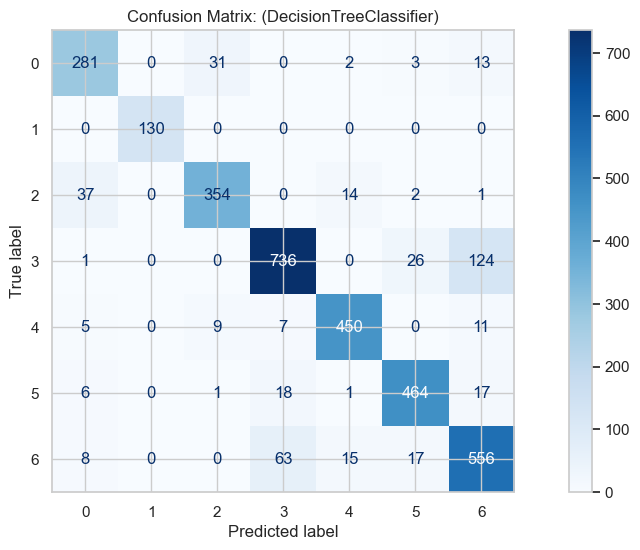

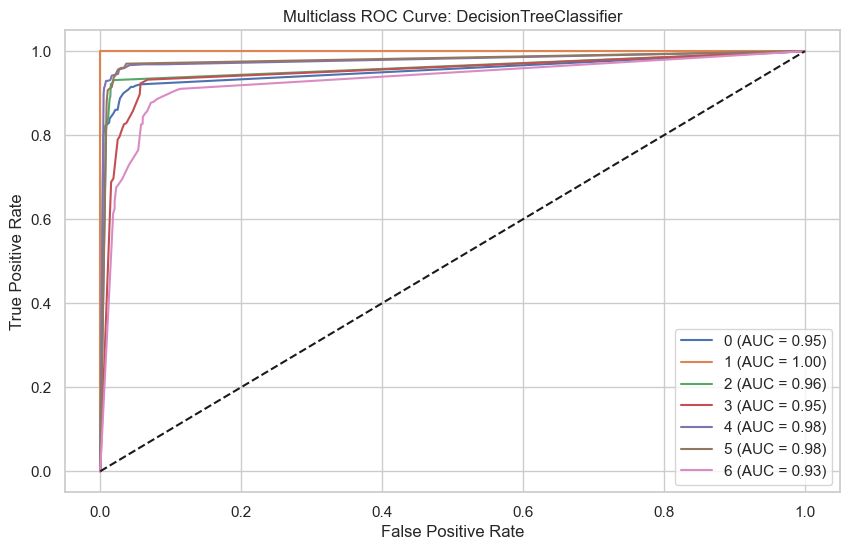

CV Accuracy: SVC : 0.5112992434818449
(3403, 1) : (3403, 1)


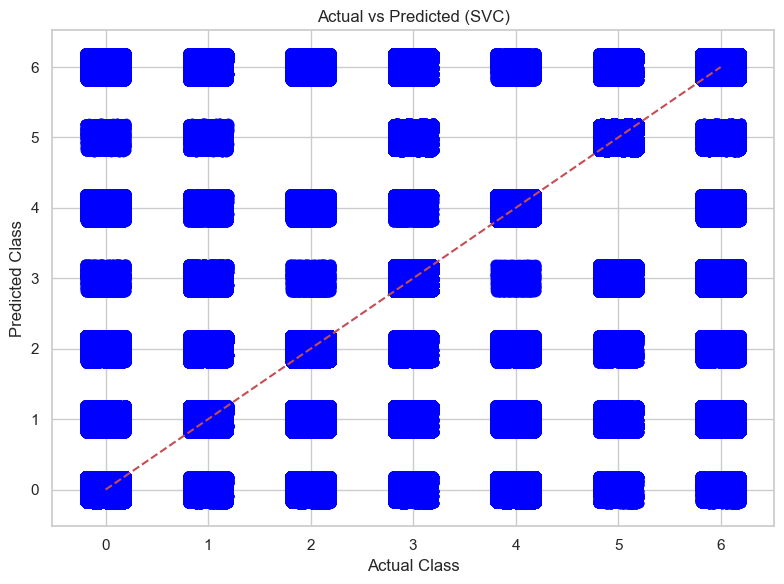

Classification Report: SVC
              precision    recall  f1-score   support

           0       0.37      0.57      0.45       330
           1       0.12      0.52      0.20       130
           2       0.48      0.38      0.43       408
           3       0.68      0.55      0.61       887
           4       0.67      0.38      0.49       482
           5       0.74      0.81      0.77       507
           6       0.51      0.38      0.43       659

    accuracy                           0.51      3403
   macro avg       0.51      0.51      0.48      3403
weighted avg       0.58      0.51      0.53      3403



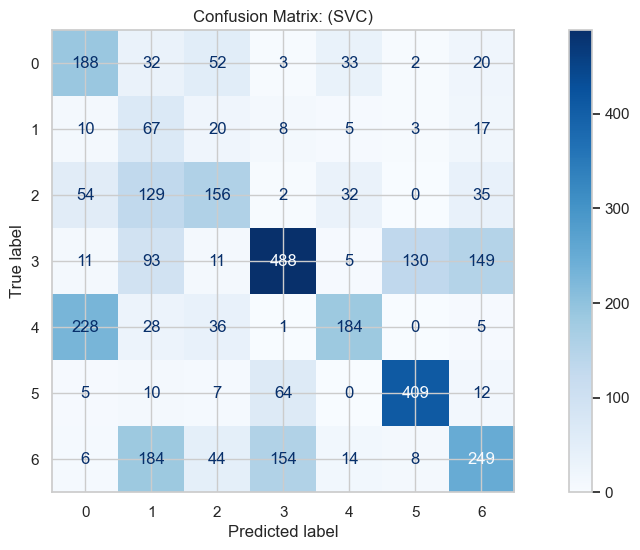

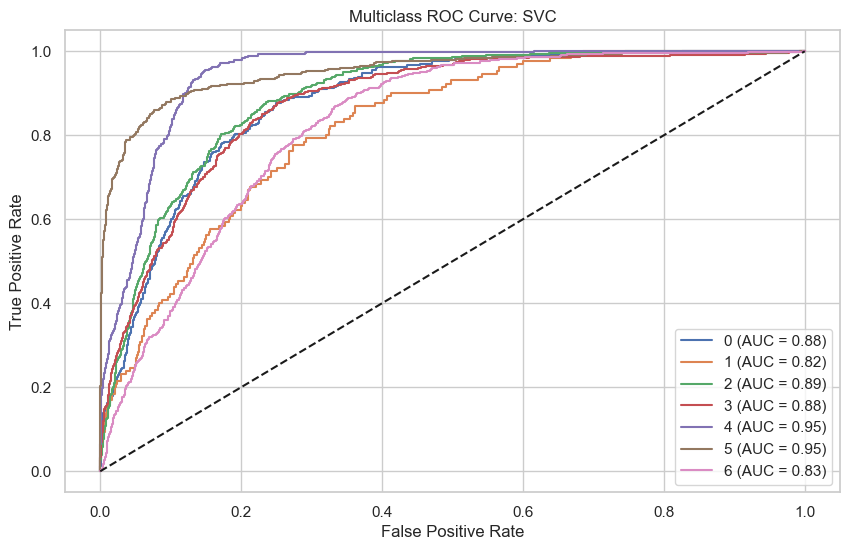

CV Accuracy: RandomForestClassifier : 0.9147281719915441
(3403, 1) : (3403, 1)


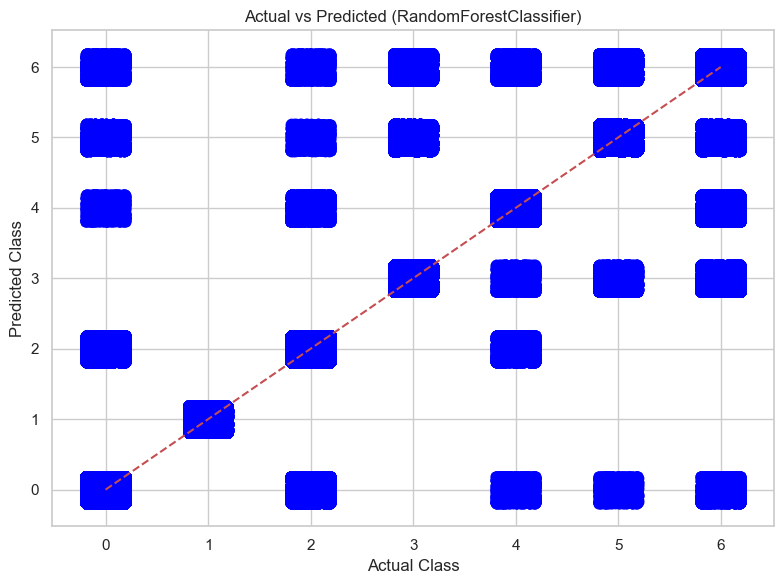

Classification Report: RandomForestClassifier
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       330
           1       1.00      1.00      1.00       130
           2       0.93      0.93      0.93       408
           3       0.91      0.87      0.89       887
           4       0.95      0.96      0.96       482
           5       0.91      0.96      0.93       507
           6       0.82      0.85      0.83       659

    accuracy                           0.91      3403
   macro avg       0.92      0.92      0.92      3403
weighted avg       0.91      0.91      0.91      3403



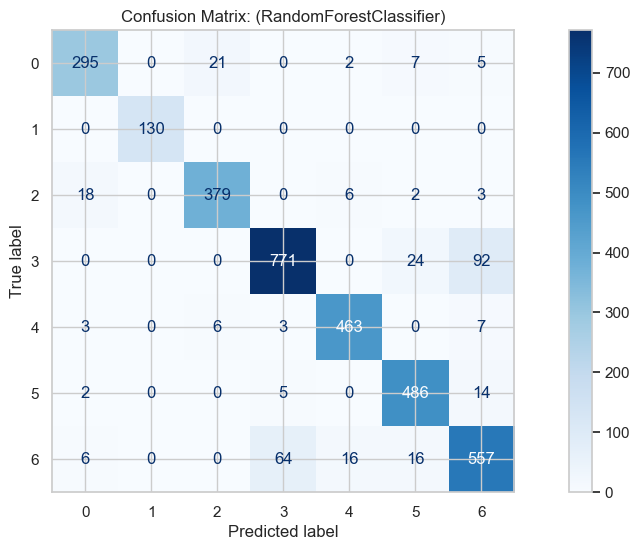

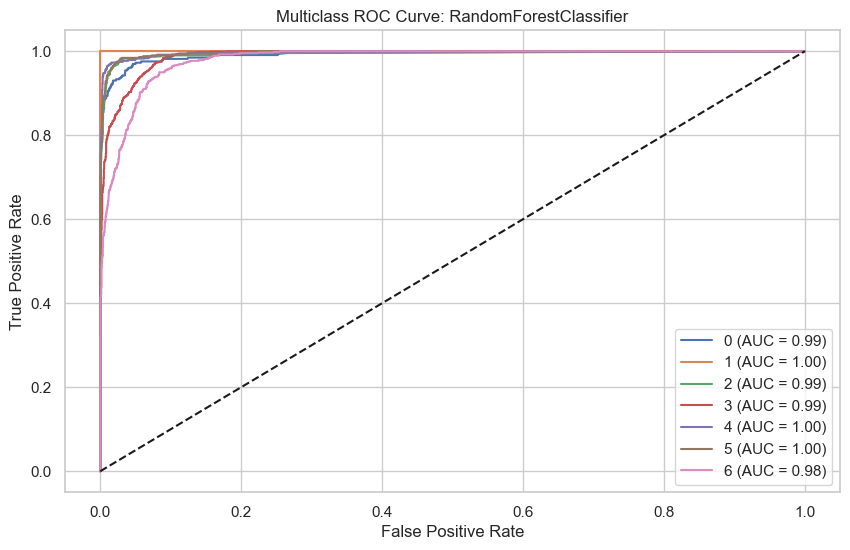

CV Accuracy: GradientBoostingClassifier : 0.9223797747729782
(3403, 1) : (3403, 1)


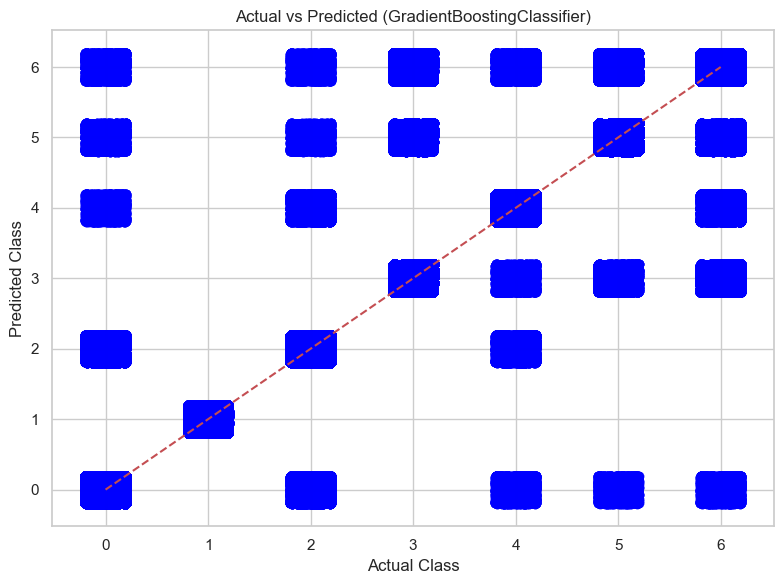

Classification Report: GradientBoostingClassifier
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.94      0.94       408
           3       0.92      0.87      0.90       887
           4       0.96      0.96      0.96       482
           5       0.92      0.95      0.94       507
           6       0.82      0.88      0.85       659

    accuracy                           0.91      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.91      0.91      3403



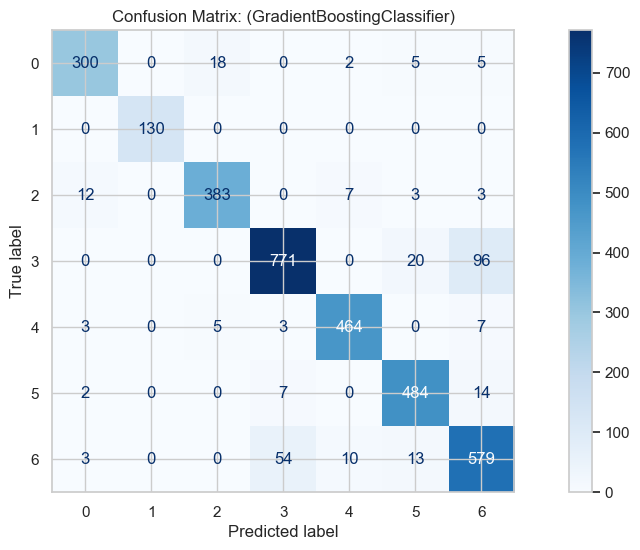

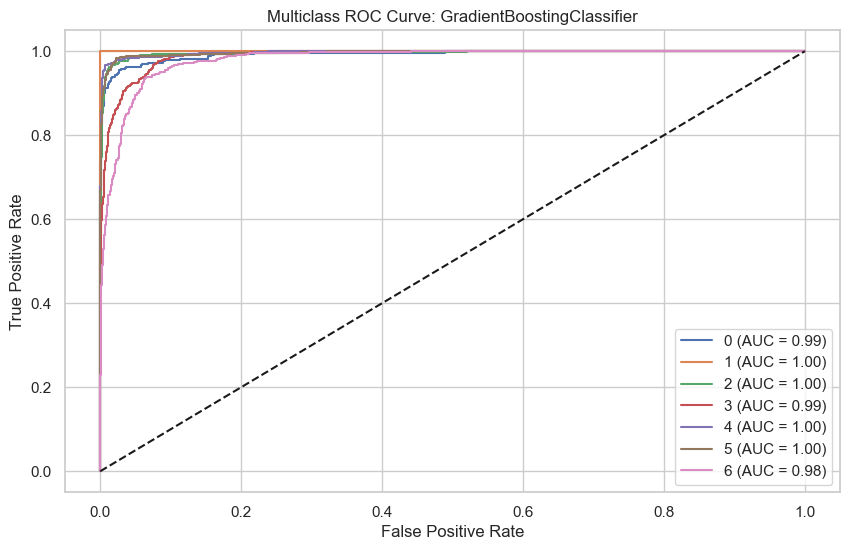

CV Accuracy: XGBClassifier : 0.9263937085344288
(3403, 1) : (3403, 1)


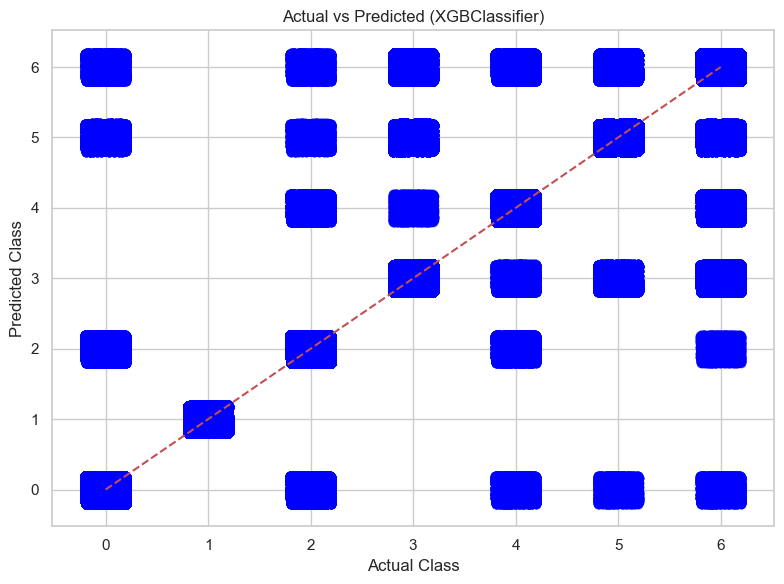

Classification Report: XGBClassifier
              precision    recall  f1-score   support

           0       0.93      0.92      0.92       330
           1       1.00      1.00      1.00       130
           2       0.95      0.93      0.94       408
           3       0.92      0.87      0.90       887
           4       0.96      0.96      0.96       482
           5       0.91      0.96      0.94       507
           6       0.84      0.87      0.85       659

    accuracy                           0.91      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.91      0.91      3403



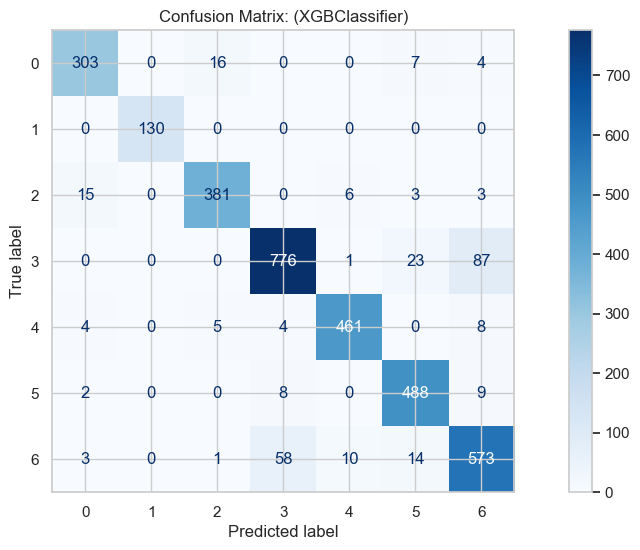

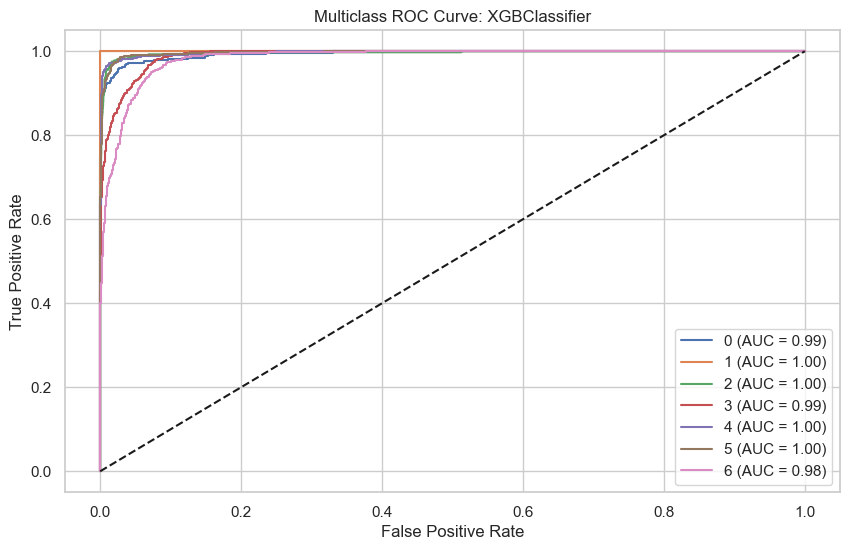

CV Accuracy: LGBMClassifier : 0.9216578251100209
(3403, 1) : (3403, 1)


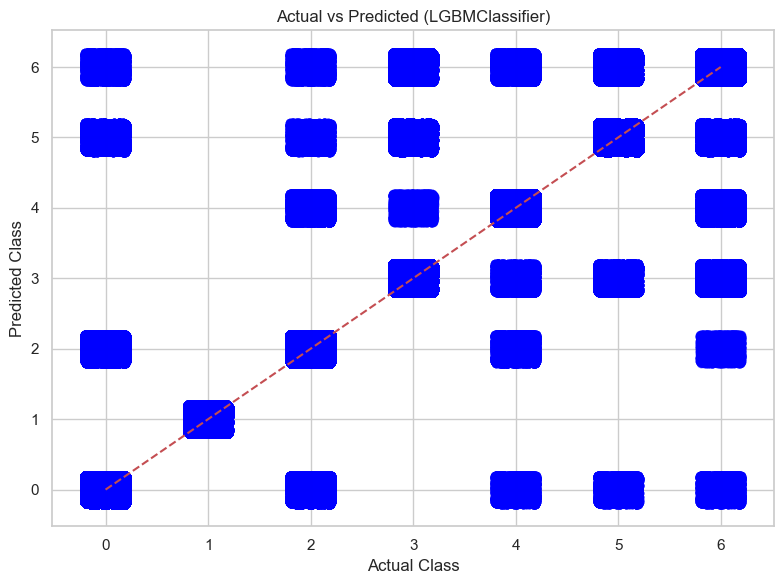

Classification Report: LGBMClassifier
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       330
           1       1.00      1.00      1.00       130
           2       0.95      0.94      0.94       408
           3       0.91      0.88      0.90       887
           4       0.96      0.96      0.96       482
           5       0.92      0.95      0.93       507
           6       0.83      0.87      0.85       659

    accuracy                           0.91      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.91      0.91      0.91      3403



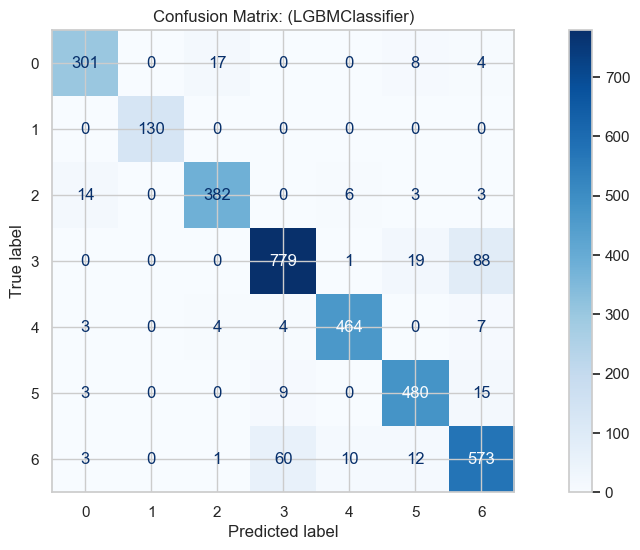

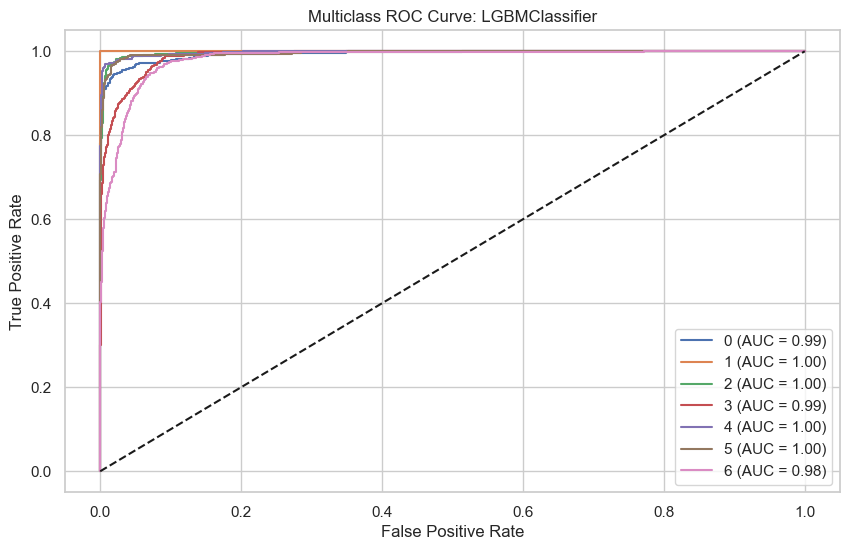

CV Accuracy: CatBoostClassifier : 0.9274866047092922
(3403, 1) : (3403, 1)


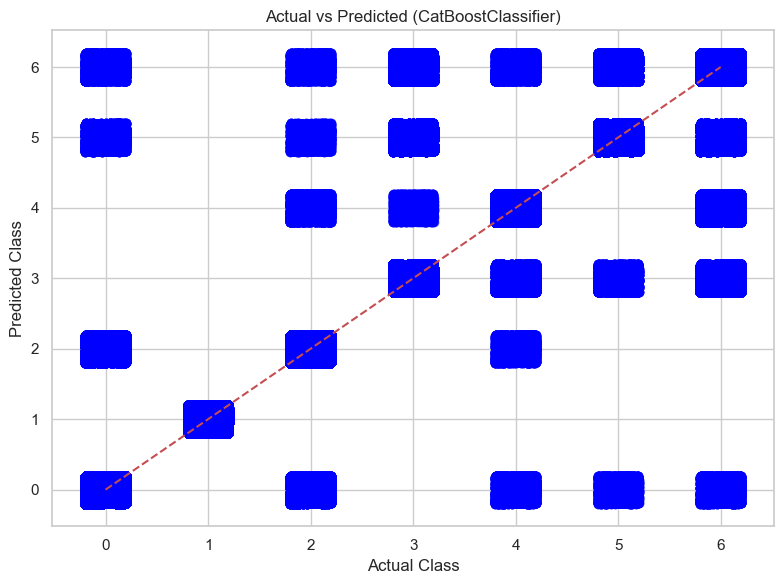

Classification Report: CatBoostClassifier
              precision    recall  f1-score   support

           0       0.93      0.92      0.92       330
           1       1.00      1.00      1.00       130
           2       0.95      0.95      0.95       408
           3       0.93      0.89      0.91       887
           4       0.96      0.96      0.96       482
           5       0.92      0.97      0.94       507
           6       0.84      0.87      0.86       659

    accuracy                           0.92      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



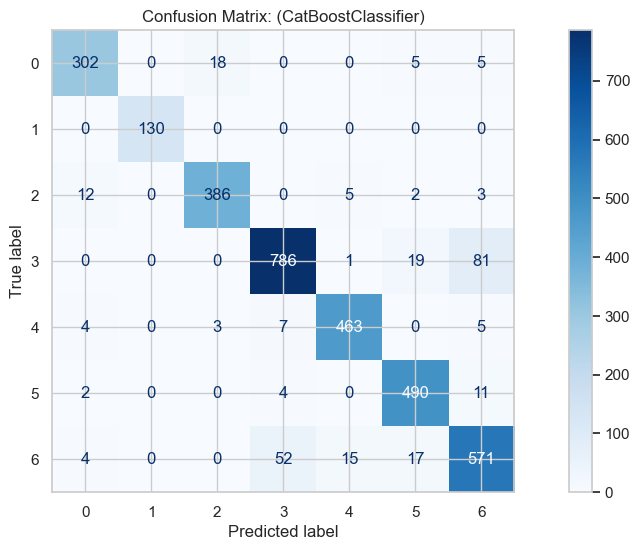

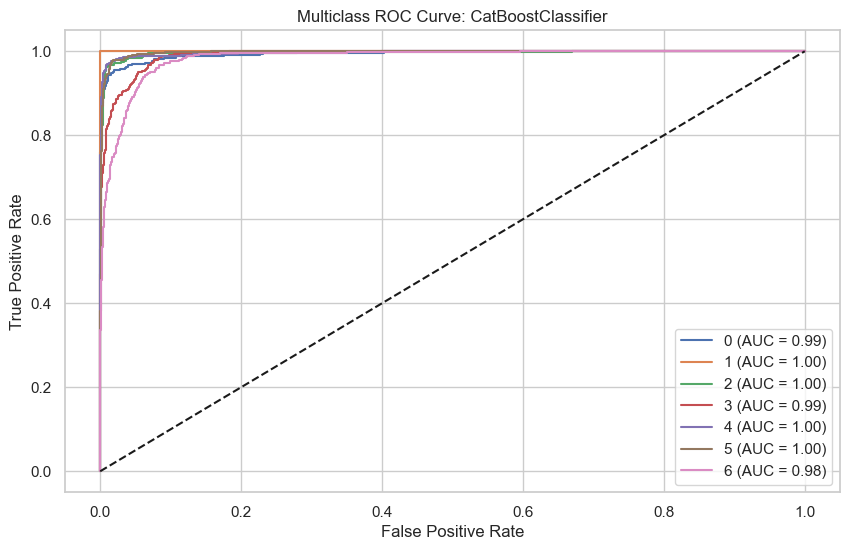

CV Accuracy: AdaBoostClassifier : 0.9209298924388071
(3403, 1) : (3403, 1)


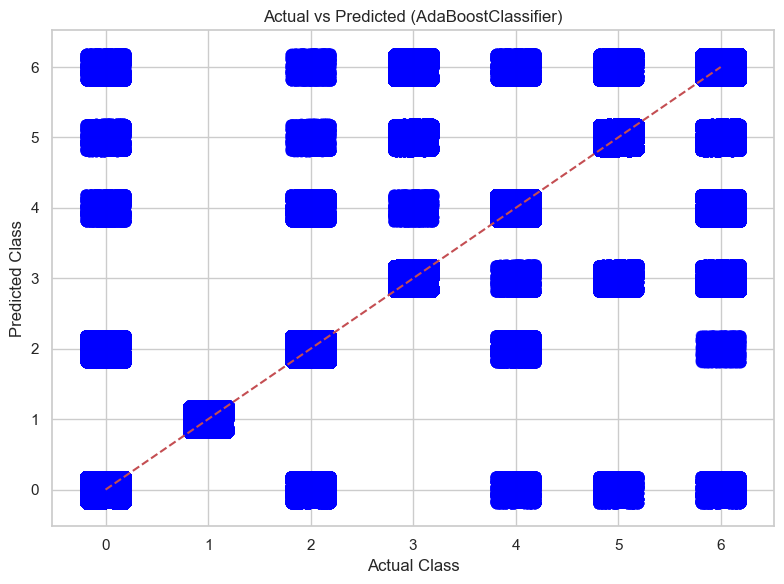

Classification Report: AdaBoostClassifier
              precision    recall  f1-score   support

           0       0.91      0.90      0.90       330
           1       1.00      1.00      1.00       130
           2       0.93      0.94      0.94       408
           3       0.90      0.87      0.89       887
           4       0.94      0.96      0.95       482
           5       0.92      0.95      0.94       507
           6       0.83      0.83      0.83       659

    accuracy                           0.90      3403
   macro avg       0.92      0.92      0.92      3403
weighted avg       0.90      0.90      0.90      3403



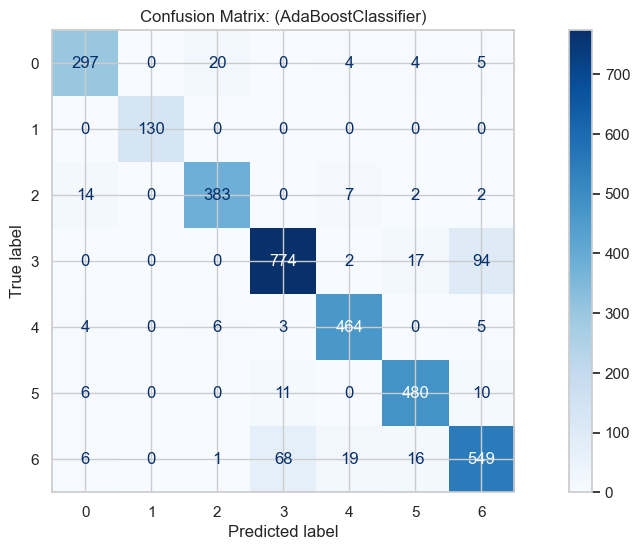

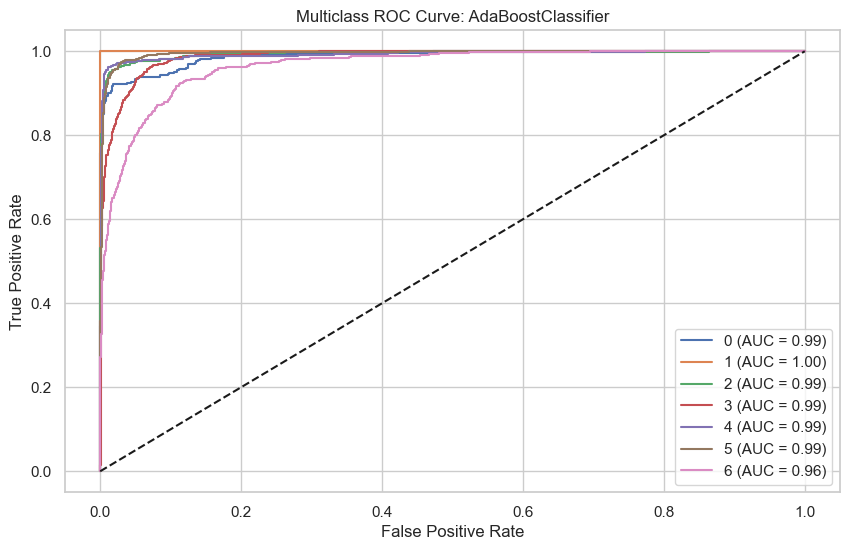

CV Accuracy: VotingClassifier : 0.8946864238894872
(3403, 1) : (3403, 1)


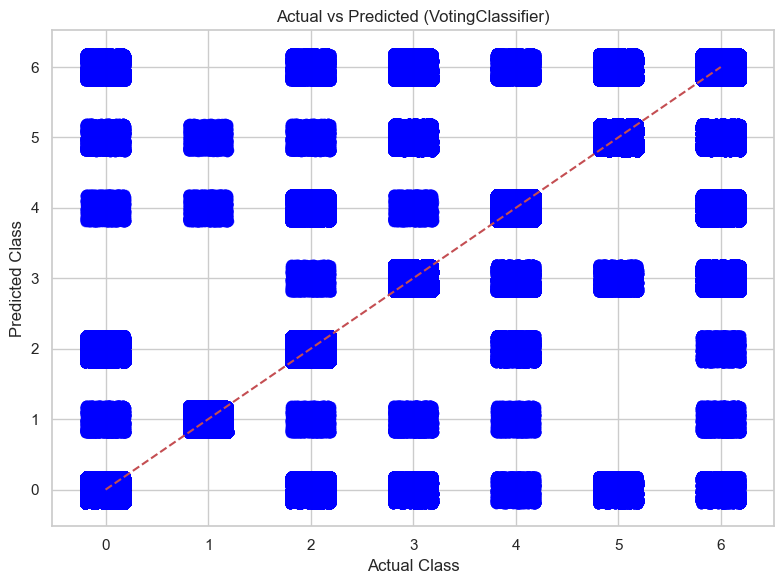

Classification Report: VotingClassifier
              precision    recall  f1-score   support

           0       0.87      0.86      0.86       330
           1       0.94      0.98      0.96       130
           2       0.90      0.91      0.90       408
           3       0.94      0.82      0.88       887
           4       0.94      0.96      0.95       482
           5       0.88      0.94      0.91       507
           6       0.80      0.88      0.84       659

    accuracy                           0.89      3403
   macro avg       0.90      0.91      0.90      3403
weighted avg       0.89      0.89      0.89      3403



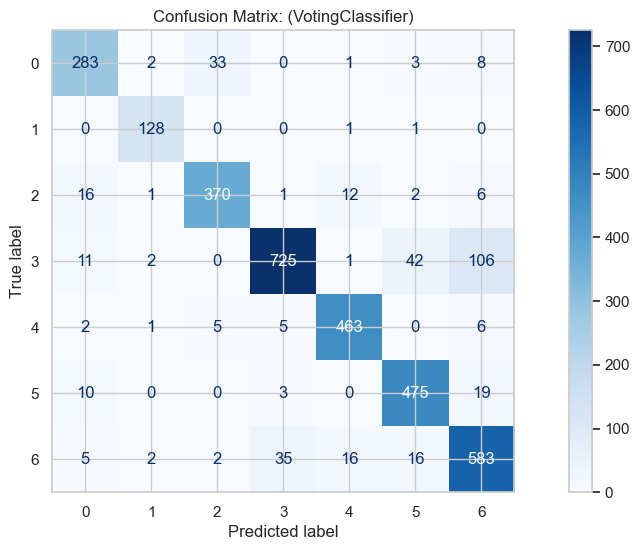

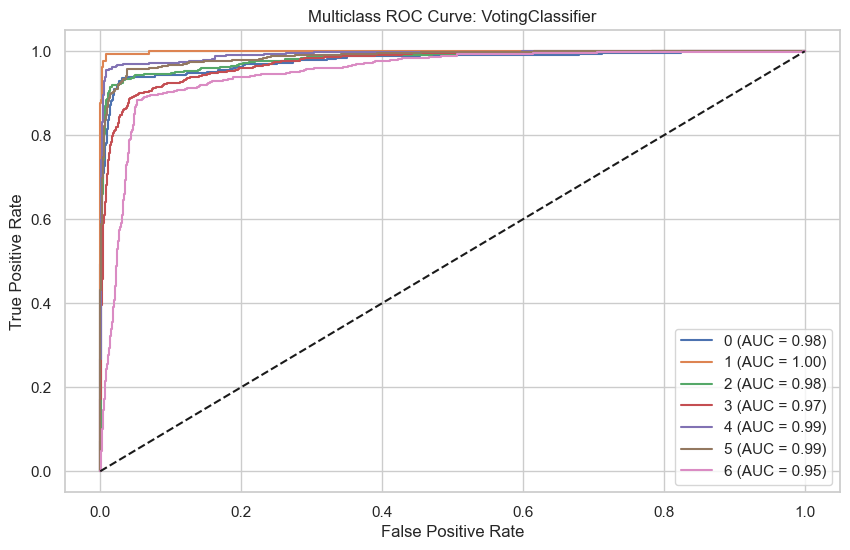


Model Comparison:



,Model,Train_Accuracy,Test_Accuracy,Precision,Test_Recall,Test_F1 Score,Overfitting,Overfitting Flag,Underfitting Flag
9,CatBoost,0.999636,0.919189,0.919643,0.919189,0.919180,0.0804,Y,N
7,XGBoost,1.000000,0.914487,0.915219,0.914487,0.914556,0.0855,Y,N
6,Gradient Boosting,1.000000,0.914193,0.915578,0.914193,0.914428,0.0858,Y,N
8,LightGBM,1.000000,0.913606,0.914424,0.913606,0.913793,0.0864,Y,N
5,Random Forest,1.000000,0.905378,0.905899,0.905378,0.905343,0.0946,Y,N
10,AdaBoost,1.000000,0.904202,0.904125,0.904202,0.904038,0.0958,Y,N
2,Naive Bayes,0.895773,0.891272,0.894948,0.891272,0.891212,0.0045,N,N
11,VotingClassifier,0.894679,0.889509,0.892944,0.889509,0.889490,0.0052,N,N
3,Decision Tree,0.951531,0.873053,0.875470,0.873053,0.873589,0.0785,Y,N
0,Logistic regression,0.688776,0.683221,0.699618,0.683221,0.685749,0.0056,N,Y


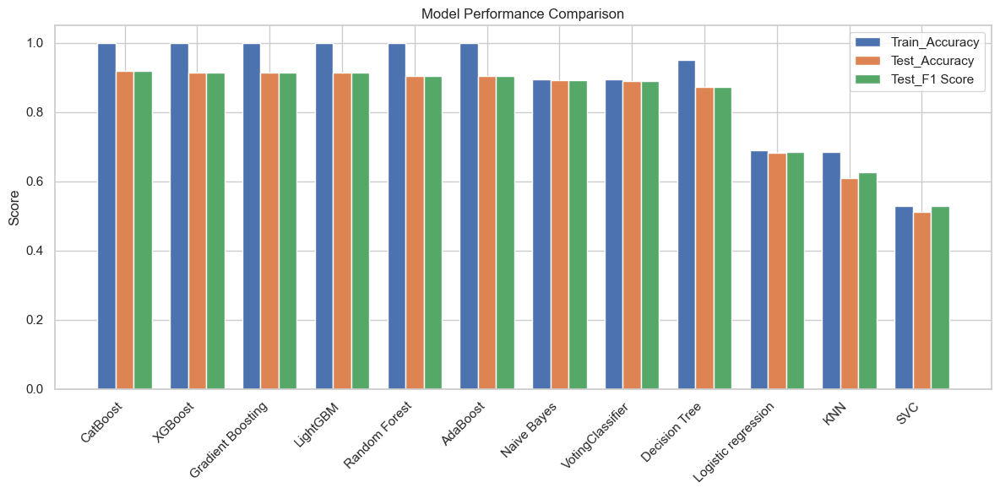

,9
Model,CatBoost
Train_Accuracy,0.999636
Test_Accuracy,0.919189
Precision,0.919643
Test_Recall,0.919189
Test_F1 Score,0.91918
Overfitting,0.0804
Overfitting Flag,Y
Underfitting Flag,N


In [88]:
x_train_resampled,y_train_resampled,x_test,y_test = random_under_sampling(transformed_beans)
model_evaluation(x_train_resampled,y_train_resampled,x_test,y_test)

## SMOTE - Model

(10208, 16) : (10208,) : (3403, 16) : (3403,)
Original class distribution: Counter({3: 2659, 6: 1977, 5: 1520, 4: 1446, 2: 1222, 0: 992, 1: 392})
Resampled class distribution: Counter({5: 2659, 3: 2659, 4: 2659, 6: 2659, 2: 2659, 0: 2659, 1: 2659})
CV Accuracy: LogisticRegression : 0.7137492759980042
(3403, 1) : (3403, 1)


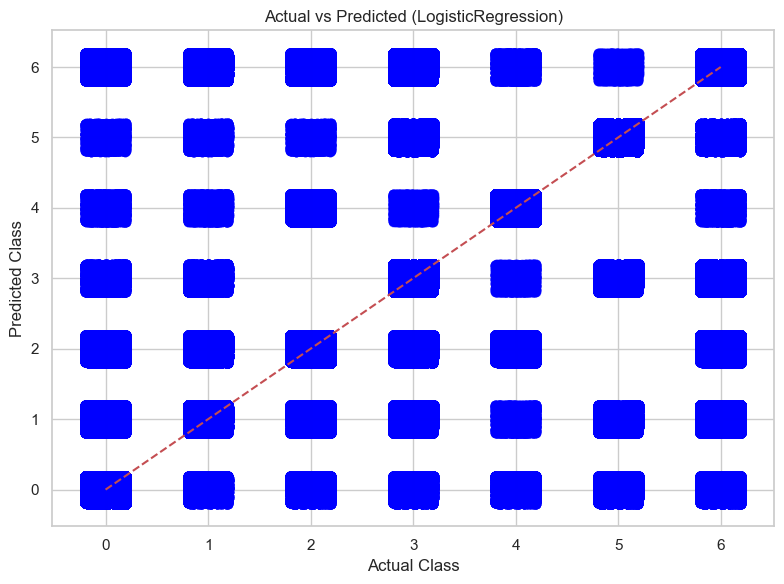

Classification Report: LogisticRegression
              precision    recall  f1-score   support

           0       0.82      0.82      0.82       330
           1       0.22      0.51      0.30       130
           2       0.59      0.69      0.63       408
           3       0.73      0.64      0.68       887
           4       0.91      0.90      0.90       482
           5       0.83      0.90      0.86       507
           6       0.53      0.38      0.44       659

    accuracy                           0.68      3403
   macro avg       0.66      0.69      0.66      3403
weighted avg       0.70      0.68      0.69      3403



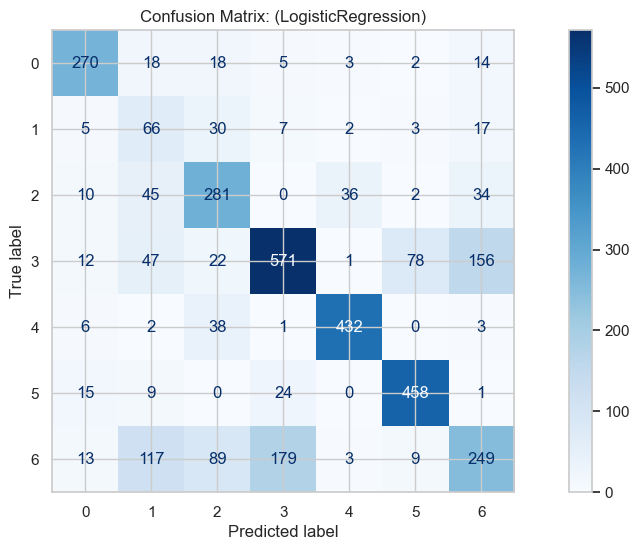

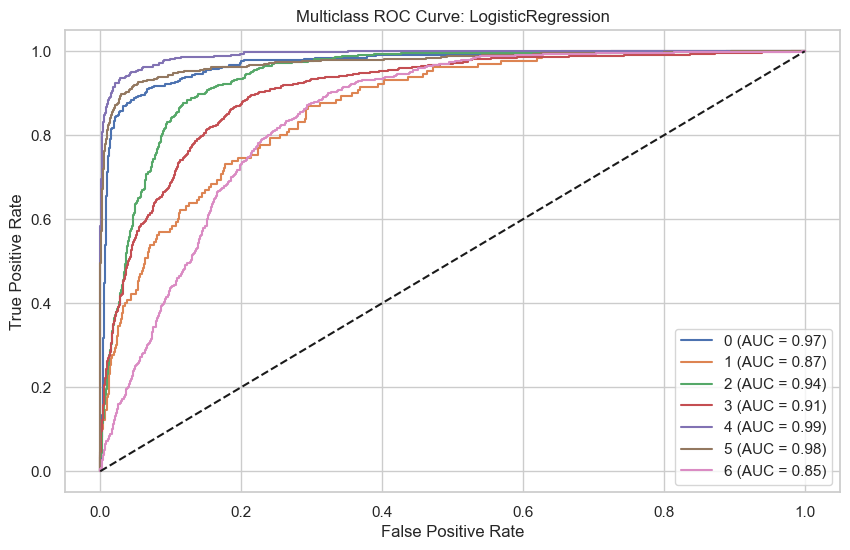

CV Accuracy: KNeighborsClassifier : 0.7503380600398094
(3403, 1) : (3403, 1)


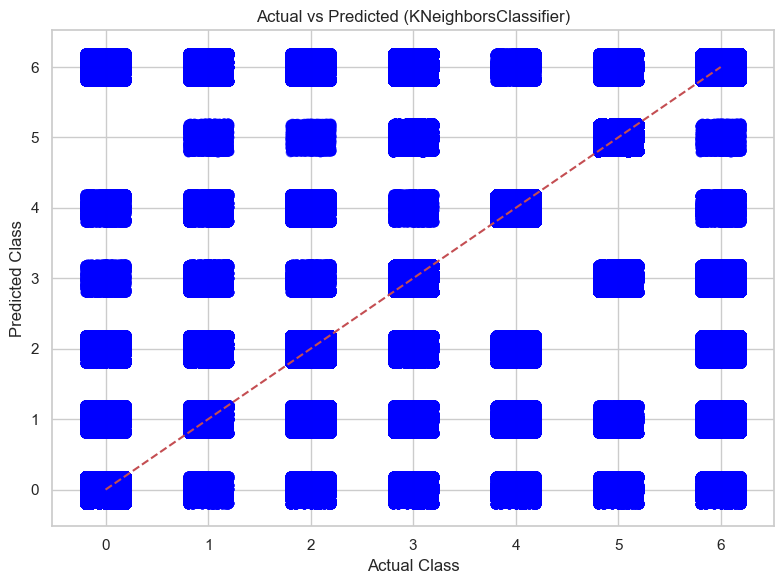

Classification Report: KNeighborsClassifier
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       330
           1       0.17      0.48      0.25       130
           2       0.59      0.62      0.61       408
           3       0.72      0.63      0.67       887
           4       0.87      0.86      0.86       482
           5       0.89      0.80      0.85       507
           6       0.52      0.46      0.49       659

    accuracy                           0.66      3403
   macro avg       0.65      0.66      0.64      3403
weighted avg       0.70      0.66      0.67      3403



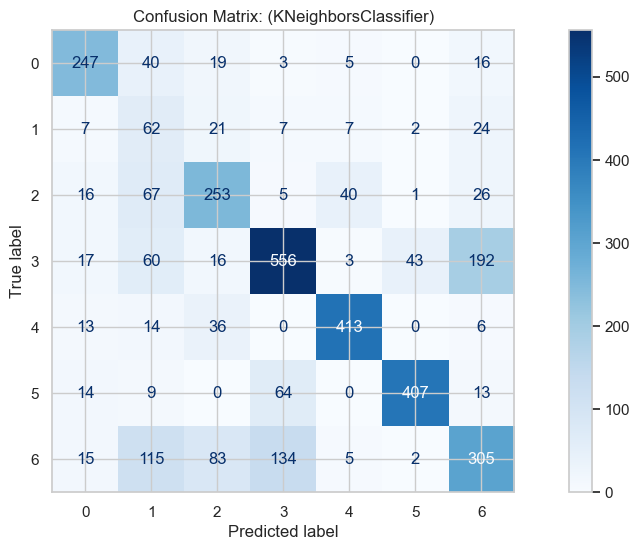

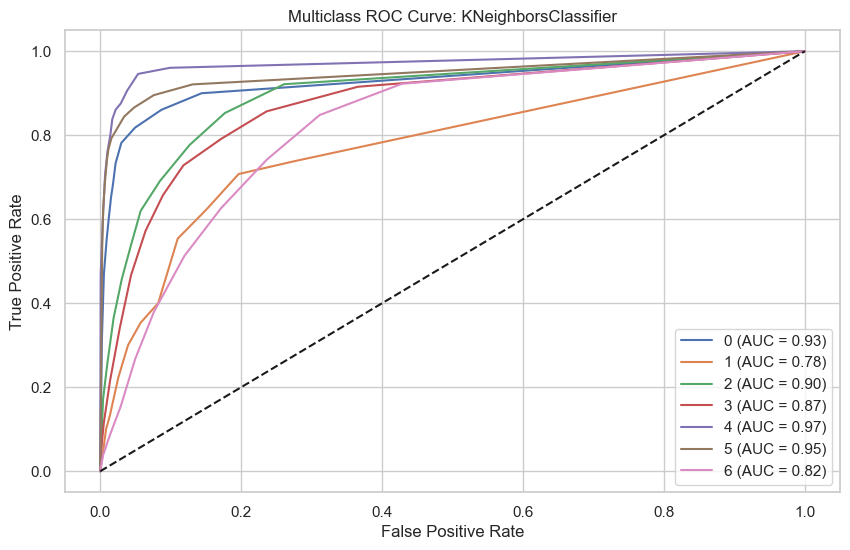

CV Accuracy: GaussianNB : 0.9155443246542581
(3403, 1) : (3403, 1)


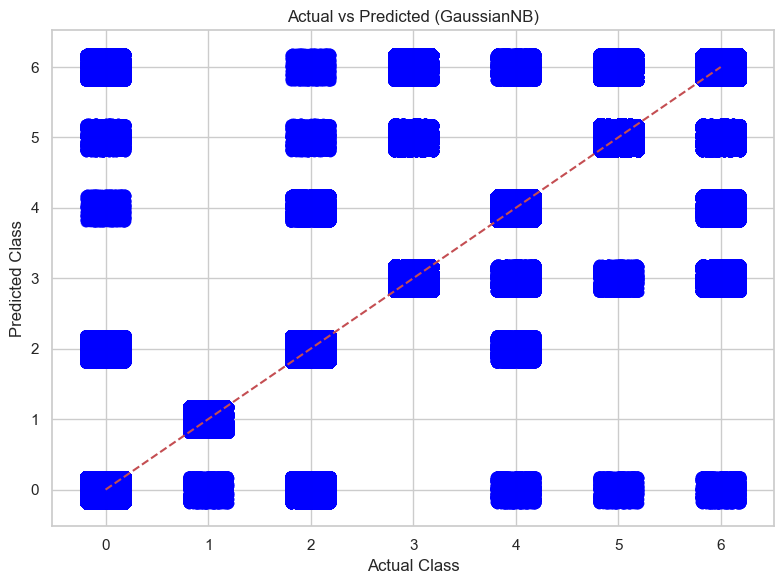

Classification Report: GaussianNB
              precision    recall  f1-score   support

           0       0.89      0.80      0.84       330
           1       1.00      0.98      0.99       130
           2       0.87      0.92      0.89       408
           3       0.94      0.85      0.89       887
           4       0.96      0.95      0.96       482
           5       0.90      0.95      0.93       507
           6       0.81      0.89      0.85       659

    accuracy                           0.90      3403
   macro avg       0.91      0.91      0.91      3403
weighted avg       0.90      0.90      0.90      3403



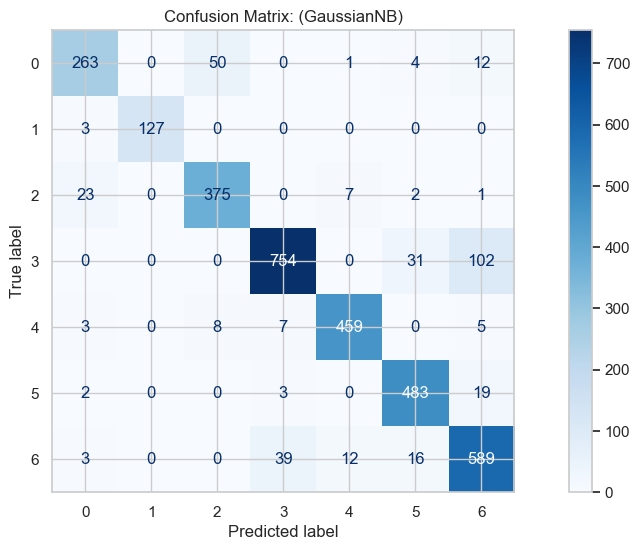

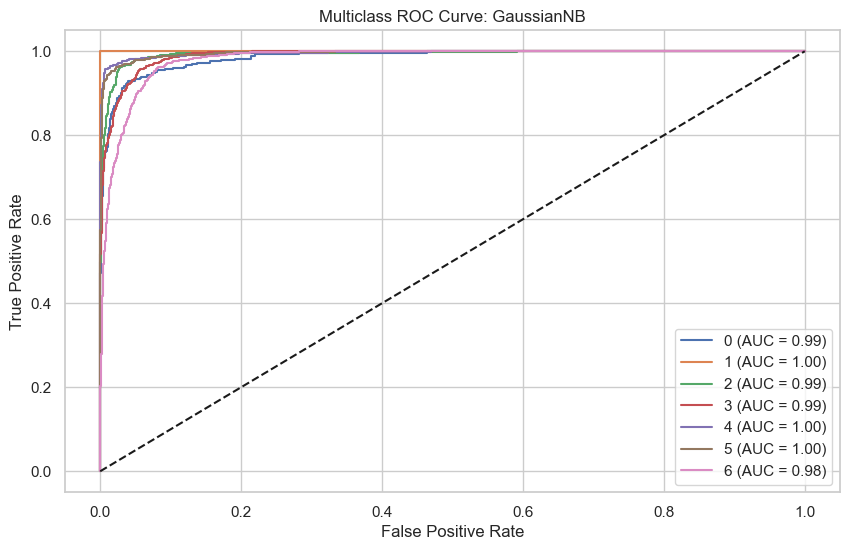

CV Accuracy: DecisionTreeClassifier : 0.9272032501104496
(3403, 1) : (3403, 1)


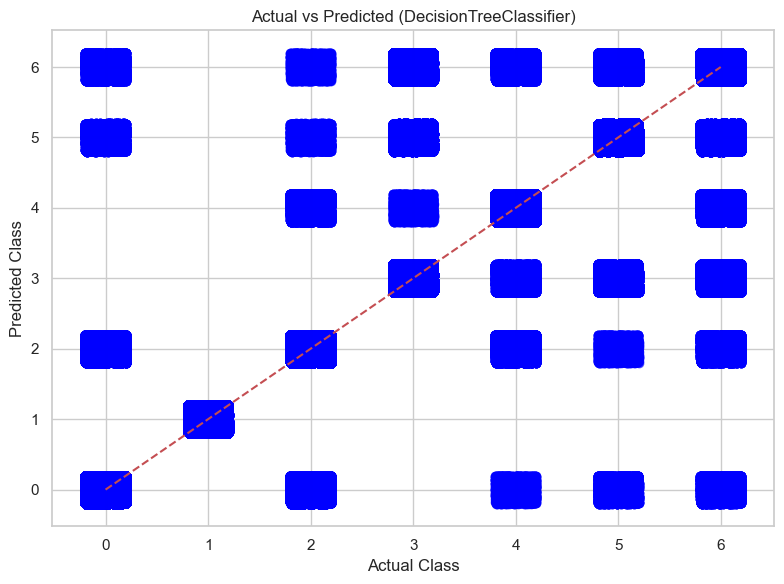

Classification Report: DecisionTreeClassifier
              precision    recall  f1-score   support

           0       0.89      0.87      0.88       330
           1       1.00      1.00      1.00       130
           2       0.88      0.91      0.89       408
           3       0.91      0.87      0.89       887
           4       0.96      0.95      0.95       482
           5       0.91      0.93      0.92       507
           6       0.82      0.86      0.84       659

    accuracy                           0.90      3403
   macro avg       0.91      0.91      0.91      3403
weighted avg       0.90      0.90      0.90      3403



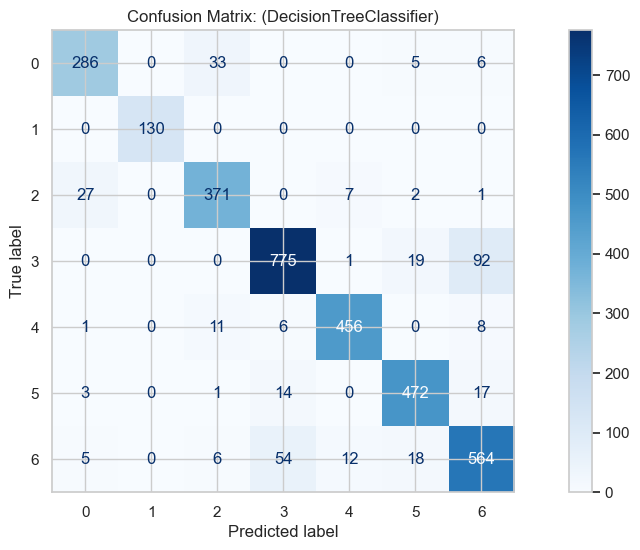

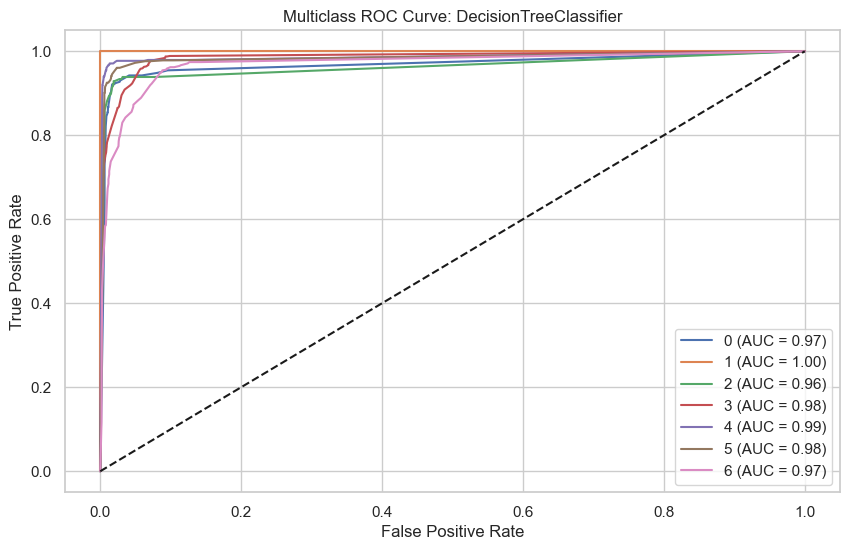

CV Accuracy: SVC : 0.6260146239382447
(3403, 1) : (3403, 1)


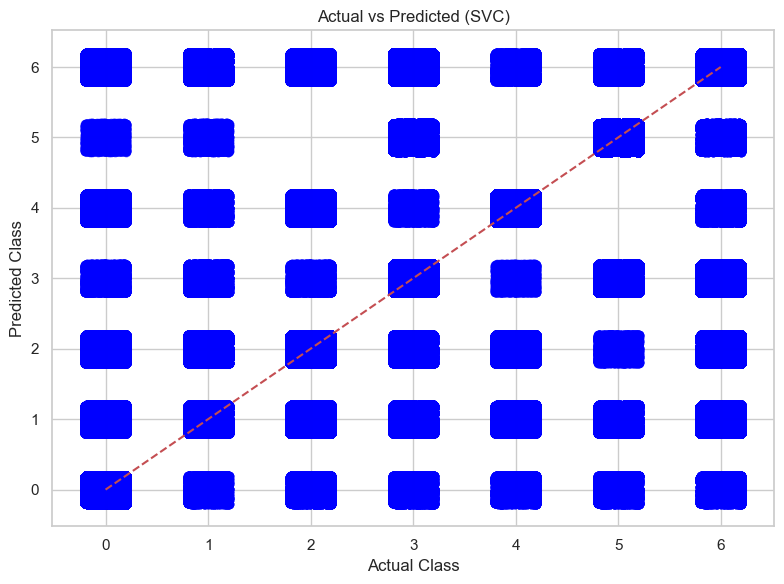

Classification Report: SVC
              precision    recall  f1-score   support

           0       0.84      0.62      0.72       330
           1       0.16      0.47      0.24       130
           2       0.52      0.52      0.52       408
           3       0.68      0.57      0.62       887
           4       0.80      0.84      0.82       482
           5       0.77      0.80      0.78       507
           6       0.51      0.46      0.48       659

    accuracy                           0.62      3403
   macro avg       0.61      0.61      0.60      3403
weighted avg       0.65      0.62      0.63      3403



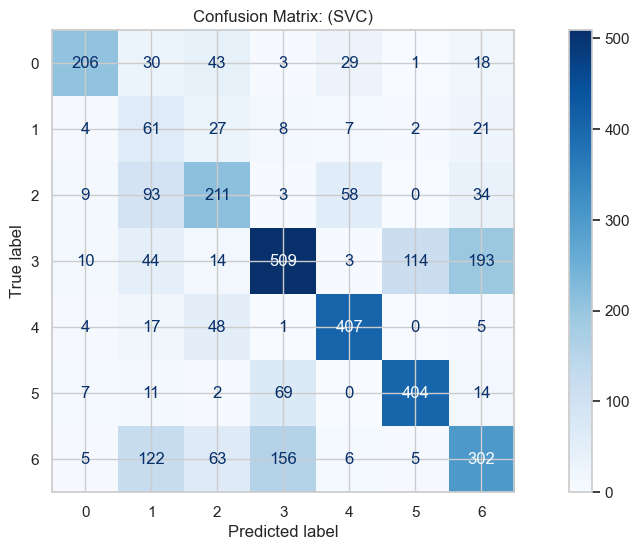

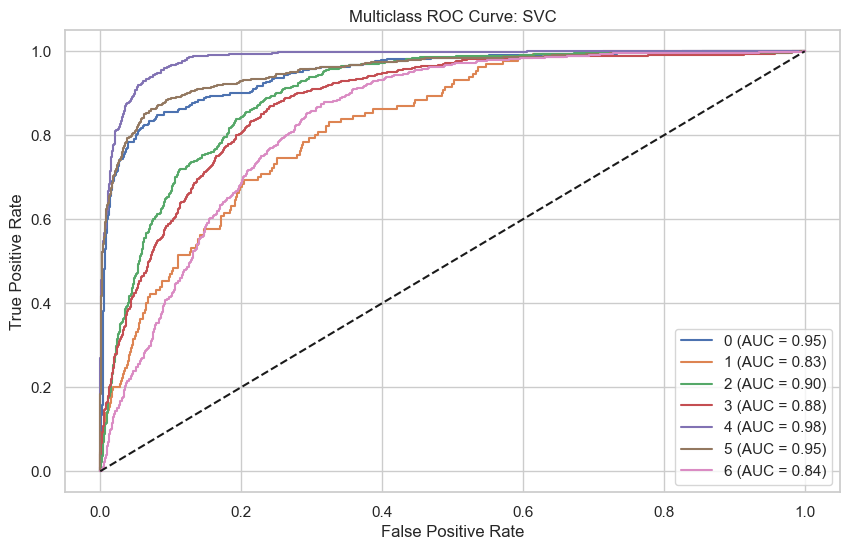

CV Accuracy: RandomForestClassifier : 0.9509496062858023
(3403, 1) : (3403, 1)


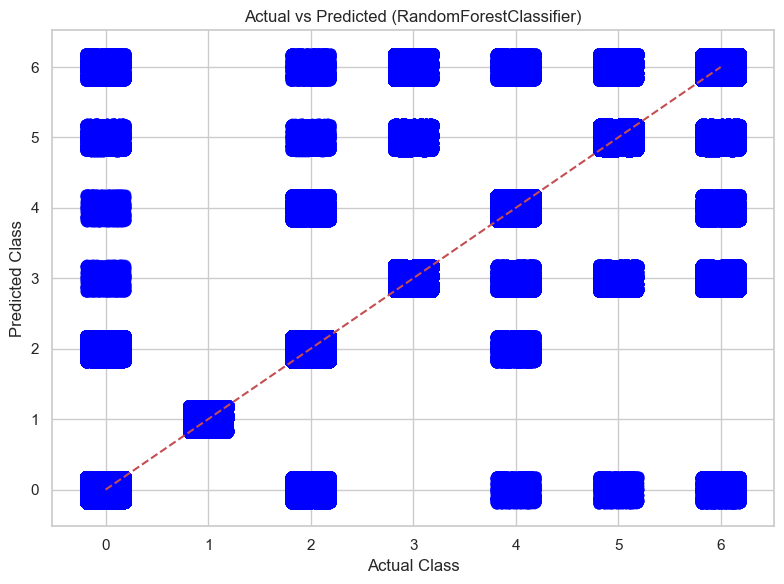

Classification Report: RandomForestClassifier
              precision    recall  f1-score   support

           0       0.92      0.91      0.91       330
           1       1.00      1.00      1.00       130
           2       0.94      0.93      0.94       408
           3       0.91      0.91      0.91       887
           4       0.97      0.96      0.96       482
           5       0.93      0.96      0.94       507
           6       0.86      0.87      0.86       659

    accuracy                           0.92      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



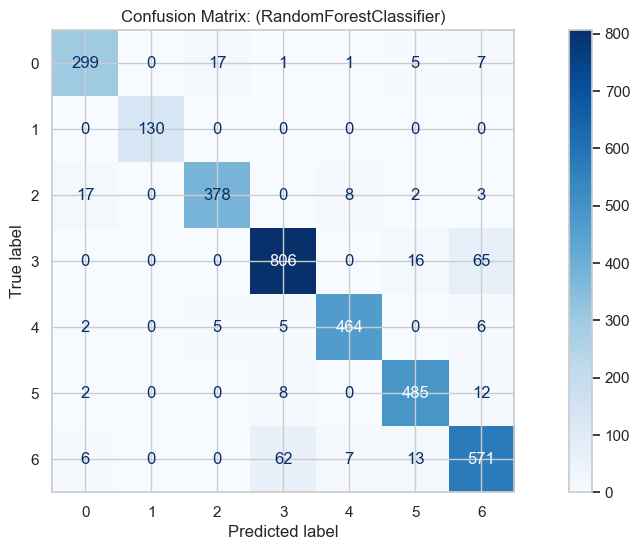

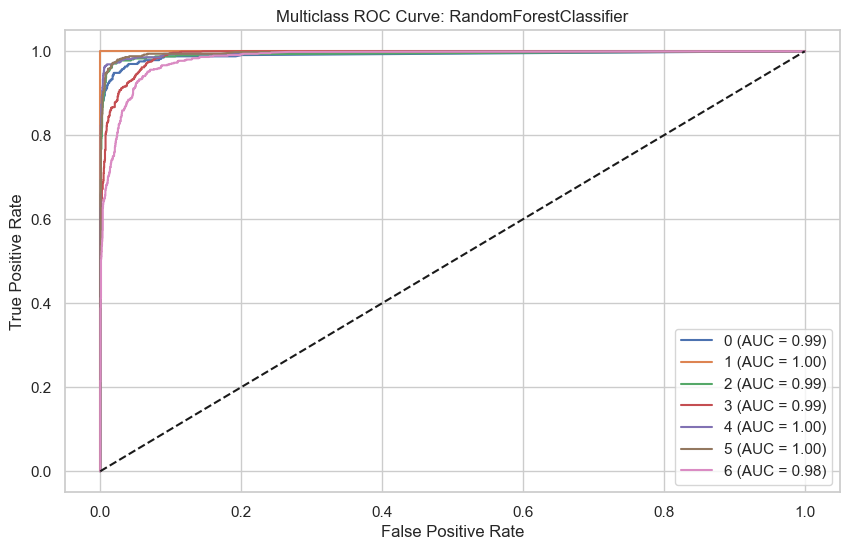

CV Accuracy: GradientBoostingClassifier : 0.954817700158317
(3403, 1) : (3403, 1)


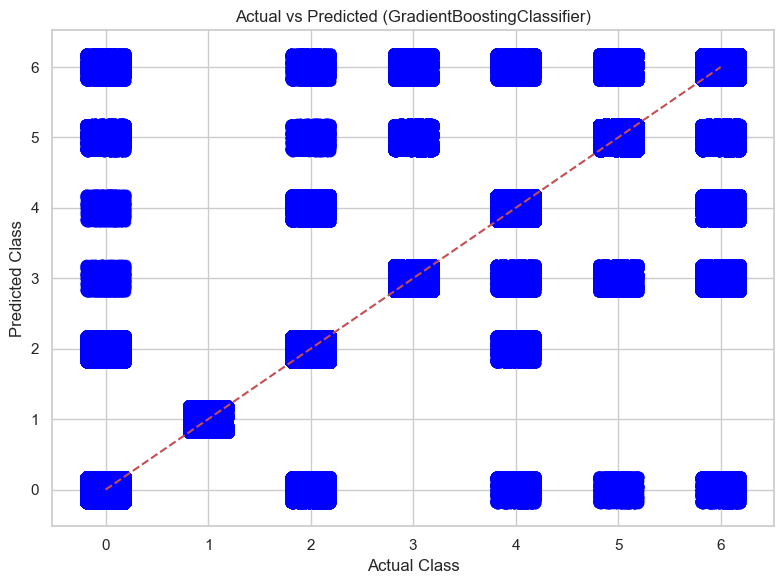

Classification Report: GradientBoostingClassifier
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.94      0.94       408
           3       0.91      0.91      0.91       887
           4       0.96      0.95      0.96       482
           5       0.94      0.96      0.95       507
           6       0.86      0.87      0.86       659

    accuracy                           0.92      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



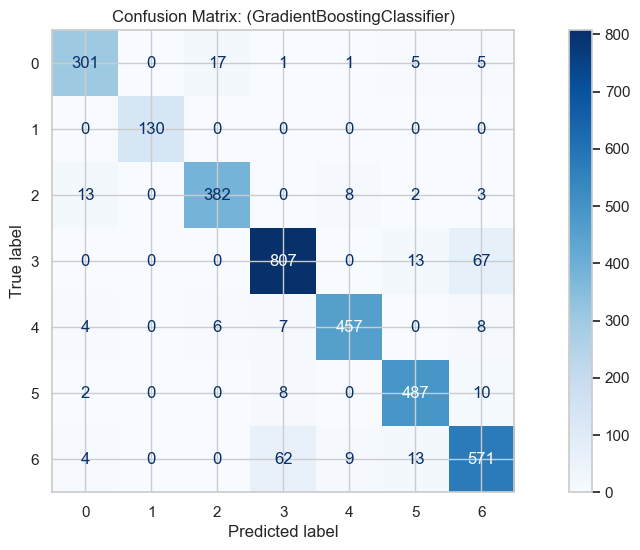

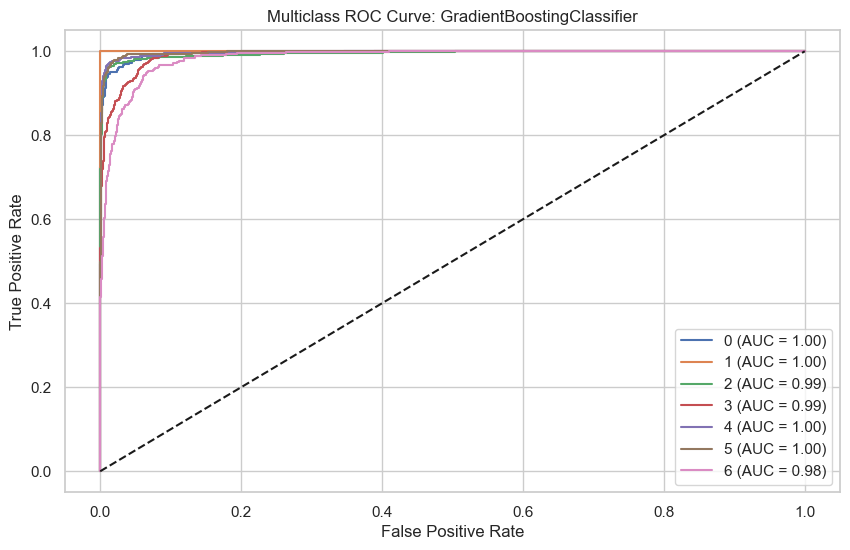

CV Accuracy: XGBClassifier : 0.9564295635002251
(3403, 1) : (3403, 1)


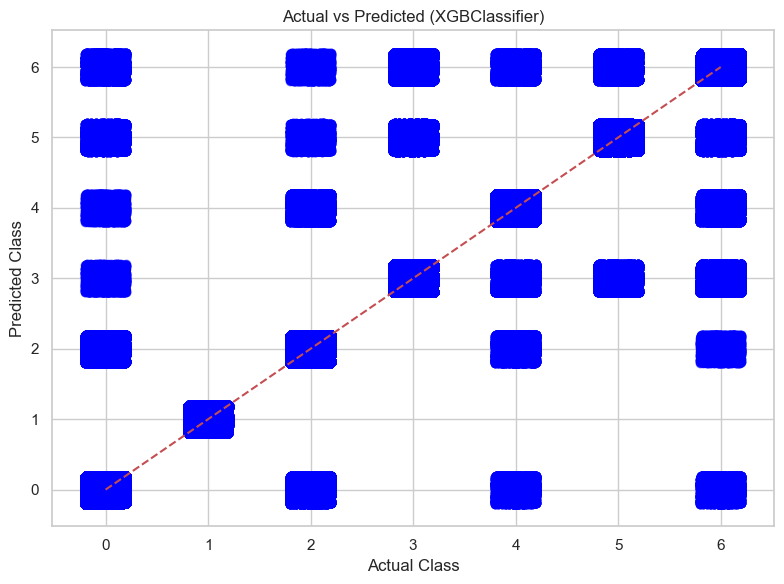

Classification Report: XGBClassifier
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       330
           1       1.00      1.00      1.00       130
           2       0.94      0.94      0.94       408
           3       0.91      0.90      0.91       887
           4       0.96      0.95      0.96       482
           5       0.94      0.96      0.95       507
           6       0.86      0.88      0.87       659

    accuracy                           0.92      3403
   macro avg       0.94      0.94      0.94      3403
weighted avg       0.92      0.92      0.92      3403



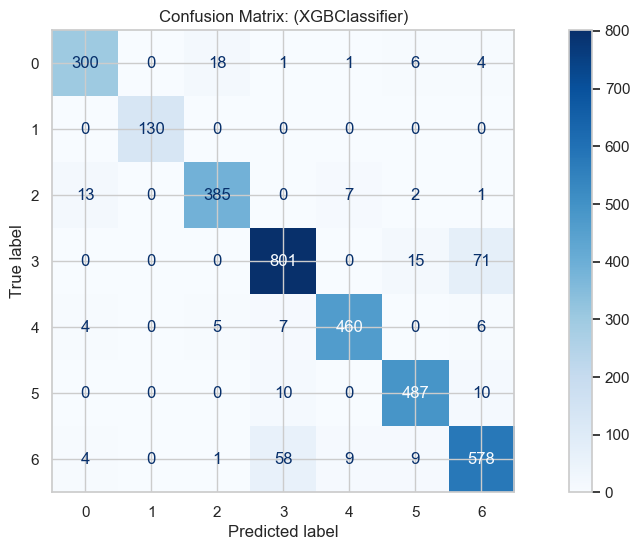

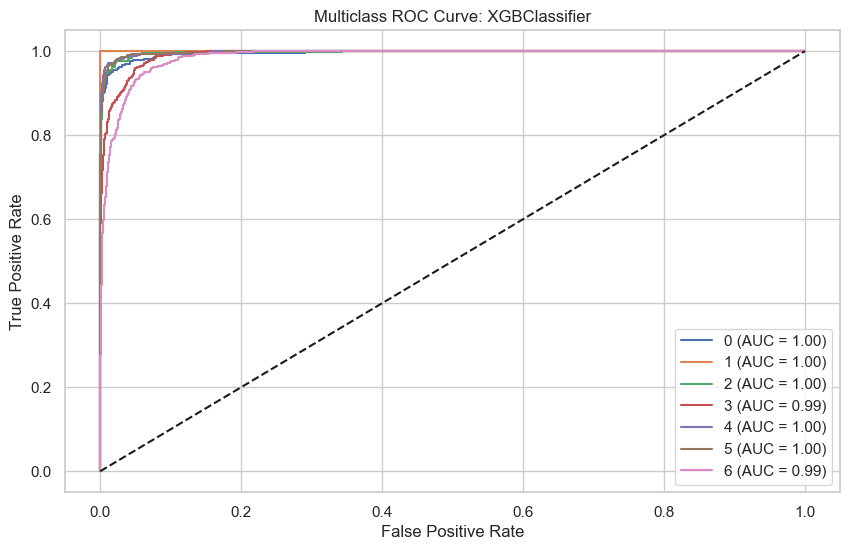

CV Accuracy: LGBMClassifier : 0.9556773808137198
(3403, 1) : (3403, 1)


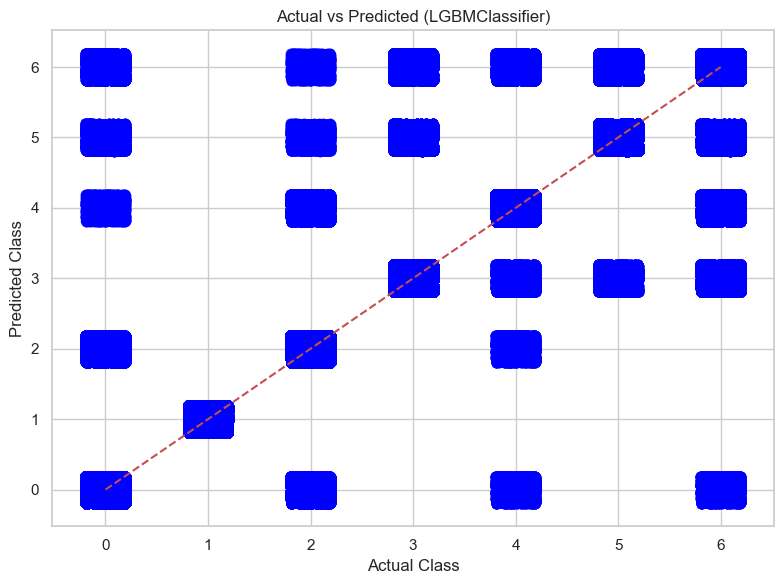

Classification Report: LGBMClassifier
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       330
           1       1.00      1.00      1.00       130
           2       0.95      0.94      0.94       408
           3       0.92      0.90      0.91       887
           4       0.96      0.95      0.96       482
           5       0.93      0.96      0.95       507
           6       0.85      0.87      0.86       659

    accuracy                           0.92      3403
   macro avg       0.93      0.93      0.93      3403
weighted avg       0.92      0.92      0.92      3403



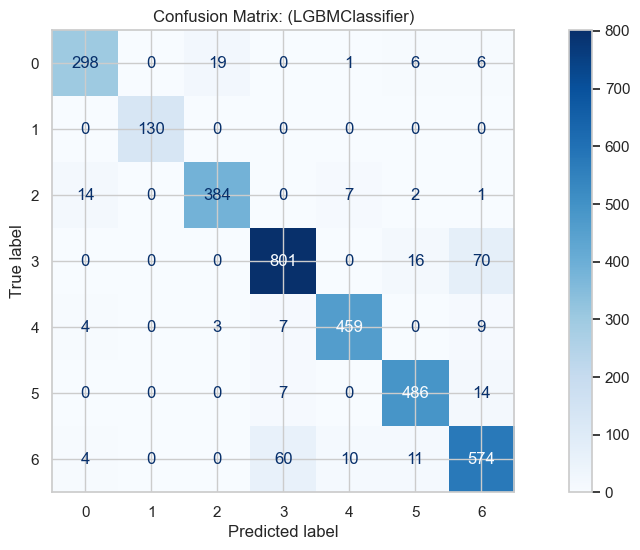

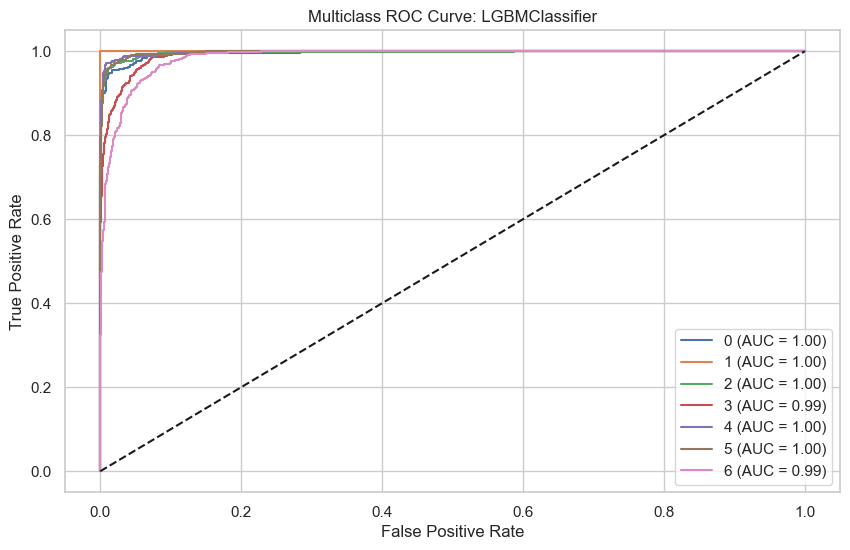

CV Accuracy: CatBoostClassifier : 0.9542803546451519
(3403, 1) : (3403, 1)


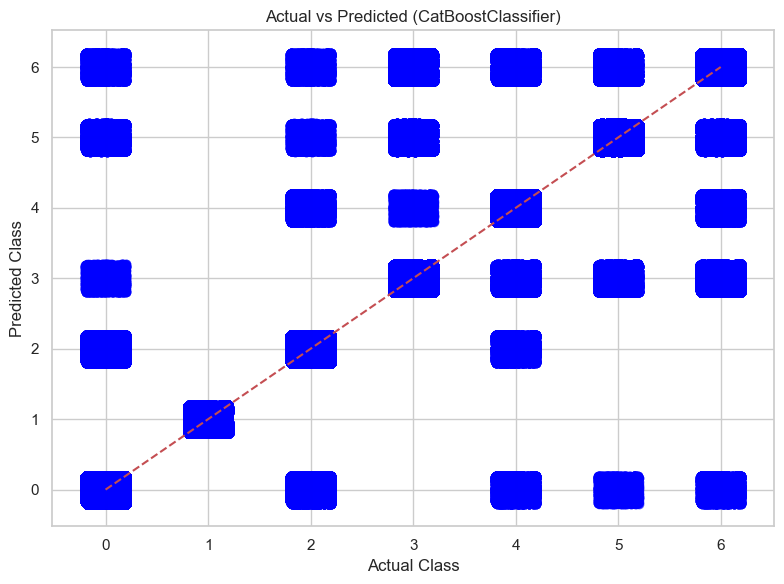

Classification Report: CatBoostClassifier
              precision    recall  f1-score   support

           0       0.93      0.92      0.92       330
           1       1.00      1.00      1.00       130
           2       0.95      0.94      0.94       408
           3       0.92      0.91      0.91       887
           4       0.97      0.95      0.96       482
           5       0.93      0.96      0.95       507
           6       0.87      0.88      0.87       659

    accuracy                           0.92      3403
   macro avg       0.94      0.94      0.94      3403
weighted avg       0.92      0.92      0.92      3403



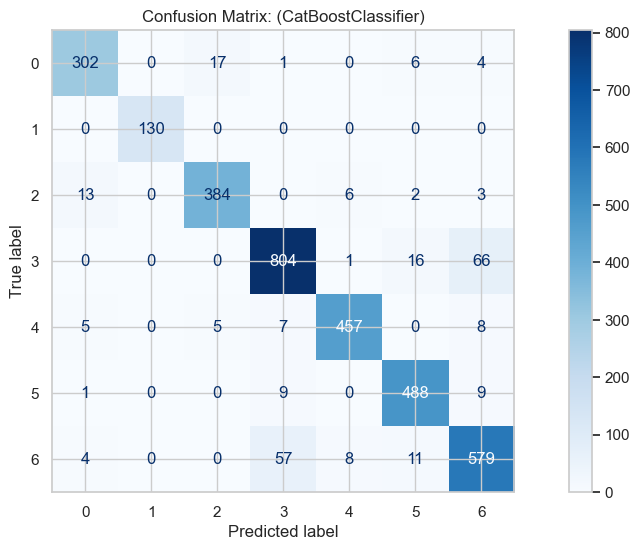

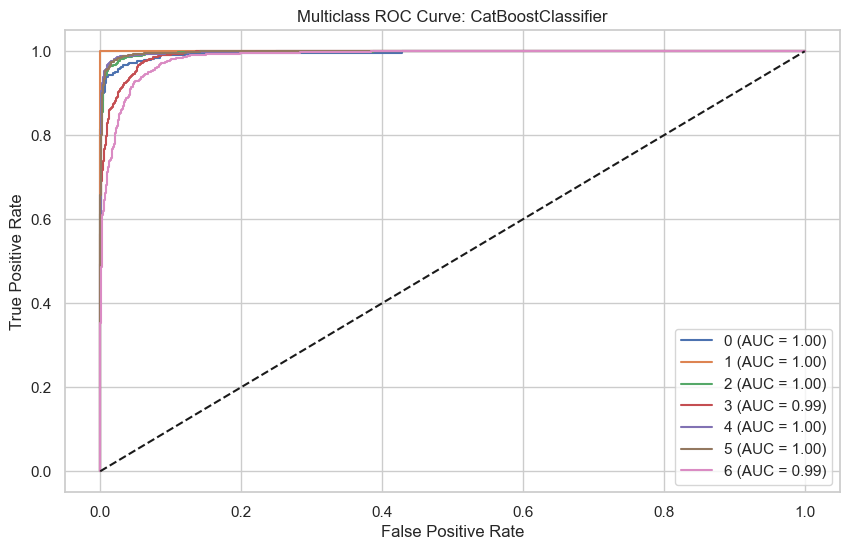

In [ ]:
x_train_resampled,y_train_resampled,x_test,y_test = smote(transformed_beans)
model_evaluation(x_train_resampled,y_train_resampled,x_test,y_test)

## PCA Model

### PCA with SMOTE

Original class distribution: Counter({3: 2659, 6: 1977, 5: 1520, 4: 1446, 2: 1222, 0: 992, 1: 392})
Resampled class distribution: Counter({5: 2659, 3: 2659, 4: 2659, 6: 2659, 2: 2659, 0: 2659, 1: 2659})
CV Accuracy: LogisticRegression : 0.7137492759980042


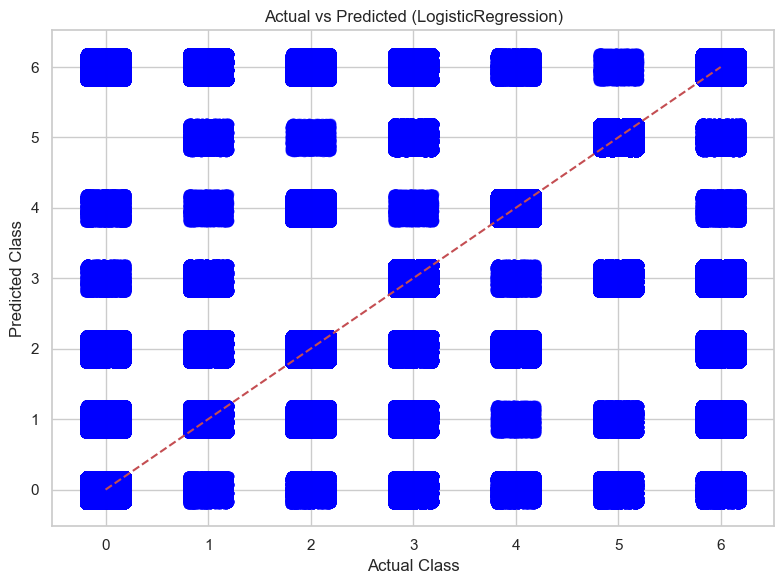

Classification Report: LogisticRegression
              precision    recall  f1-score   support

           0       0.82      0.77      0.80       328
           1       0.24      0.57      0.34       132
           2       0.60      0.68      0.64       408
           3       0.71      0.64      0.67       874
           4       0.90      0.91      0.90       475
           5       0.83      0.90      0.86       511
           6       0.55      0.40      0.46       675

    accuracy                           0.68      3403
   macro avg       0.66      0.70      0.67      3403
weighted avg       0.70      0.68      0.69      3403



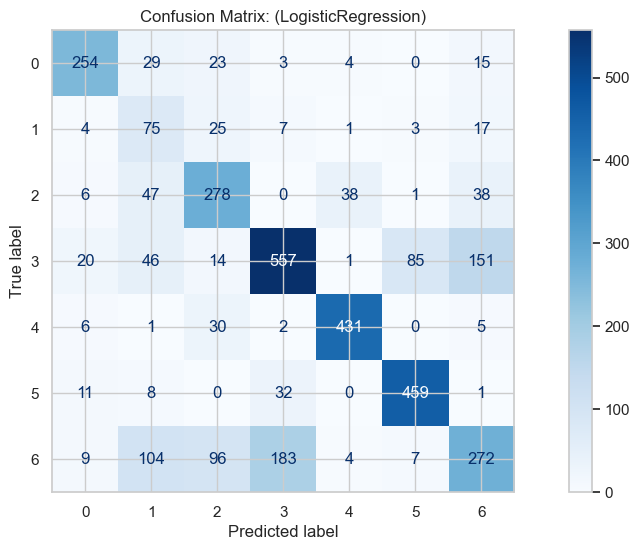

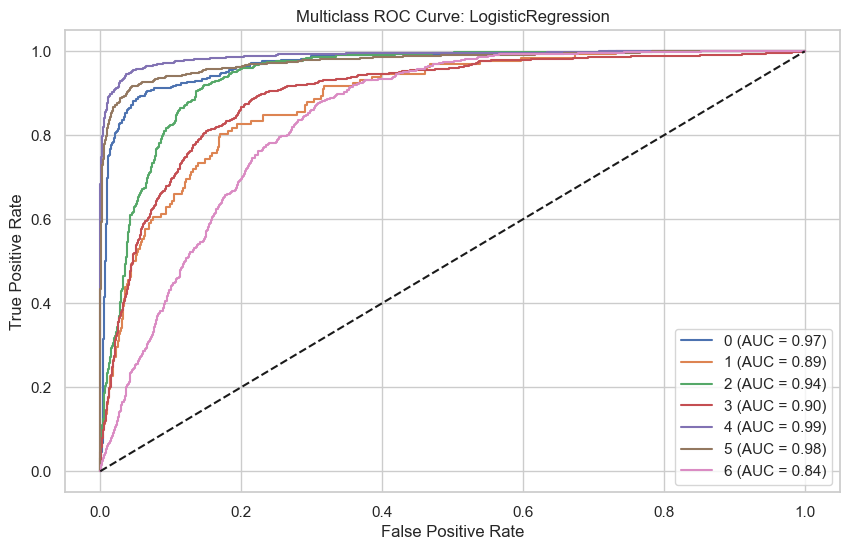

CV Accuracy: KNeighborsClassifier : 0.7503380600398094


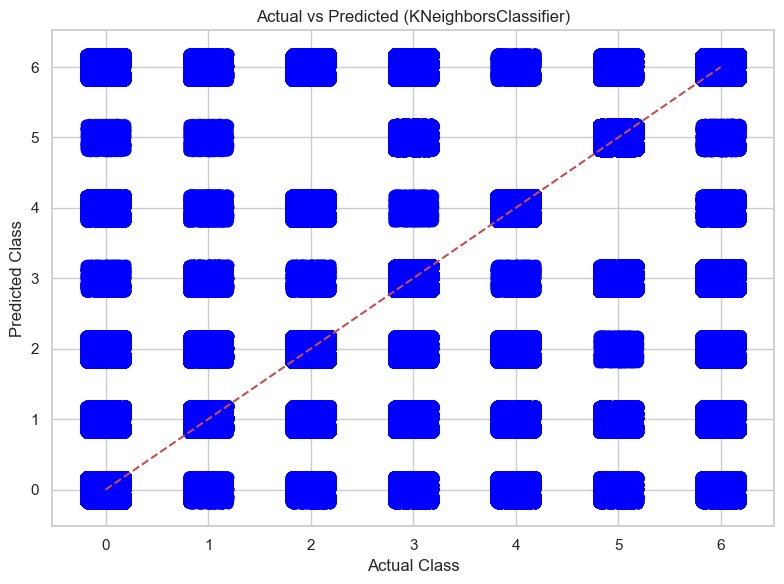

Classification Report: KNeighborsClassifier
              precision    recall  f1-score   support

           0       0.80      0.76      0.78       328
           1       0.29      0.81      0.43       132
           2       0.63      0.68      0.65       408
           3       0.75      0.66      0.70       874
           4       0.89      0.87      0.88       475
           5       0.90      0.84      0.87       511
           6       0.61      0.52      0.56       675

    accuracy                           0.71      3403
   macro avg       0.70      0.73      0.70      3403
weighted avg       0.74      0.71      0.71      3403



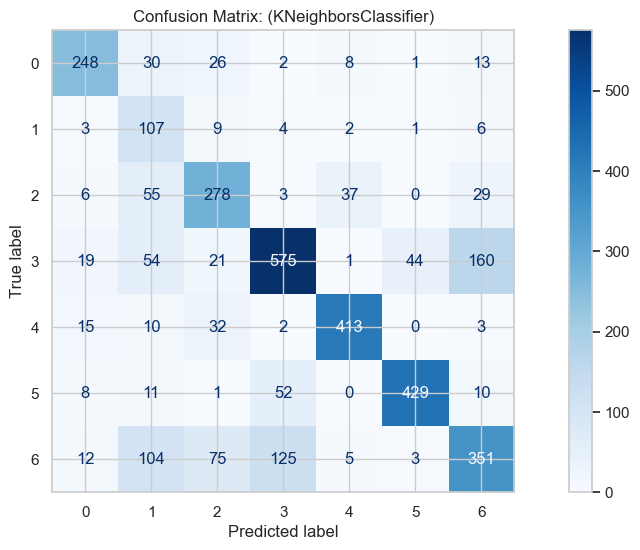

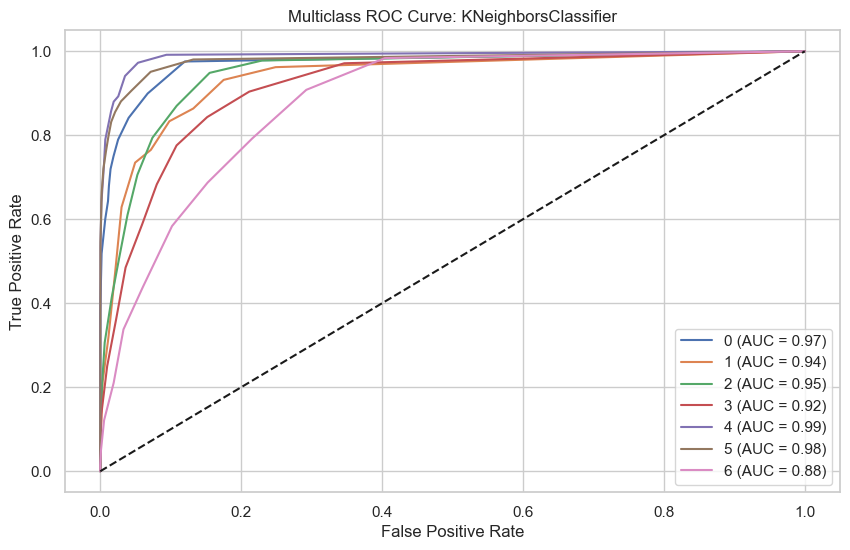

CV Accuracy: GaussianNB : 0.9155443246542581


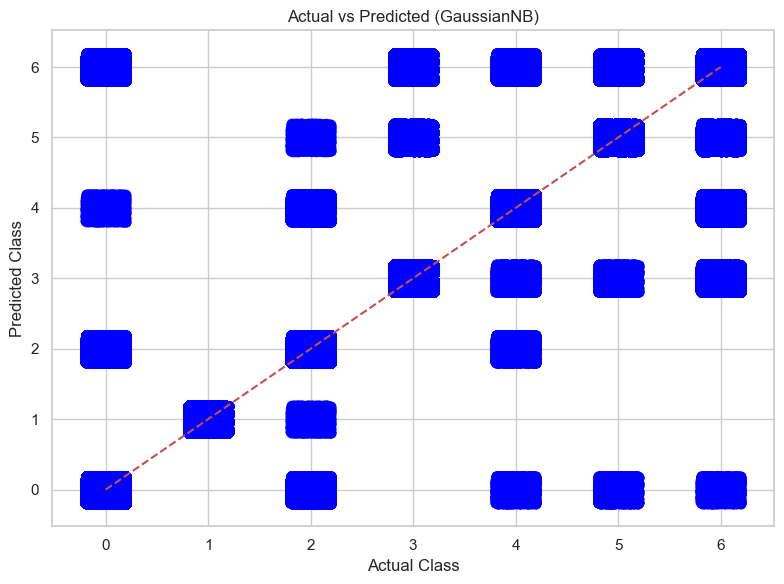

Classification Report: GaussianNB
              precision    recall  f1-score   support

           0       0.85      0.79      0.82       328
           1       0.99      1.00      1.00       132
           2       0.86      0.89      0.88       408
           3       0.92      0.88      0.90       874
           4       0.94      0.95      0.94       475
           5       0.93      0.94      0.94       511
           6       0.81      0.87      0.84       675

    accuracy                           0.89      3403
   macro avg       0.90      0.90      0.90      3403
weighted avg       0.89      0.89      0.89      3403



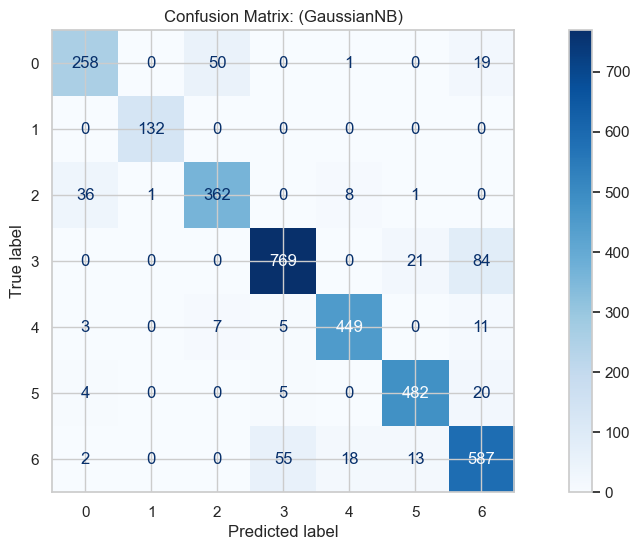

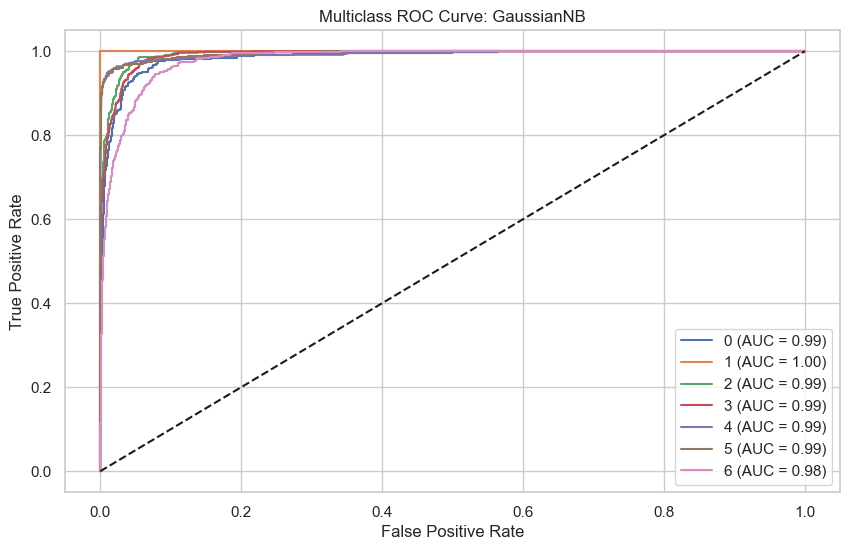

CV Accuracy: DecisionTreeClassifier : 0.9272032501104496


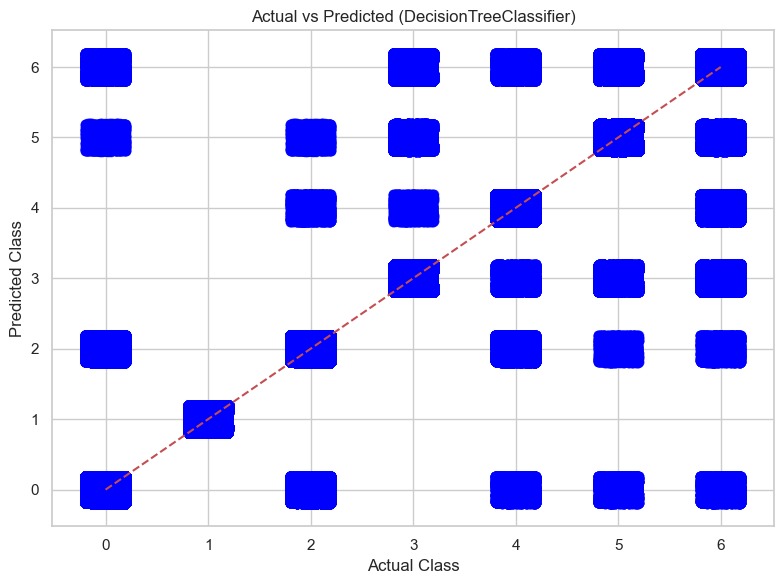

Classification Report: DecisionTreeClassifier
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       328
           1       1.00      1.00      1.00       132
           2       0.91      0.94      0.93       408
           3       0.93      0.92      0.92       874
           4       0.98      0.95      0.96       475
           5       0.96      0.95      0.95       511
           6       0.87      0.90      0.88       675

    accuracy                           0.93      3403
   macro avg       0.94      0.94      0.94      3403
weighted avg       0.93      0.93      0.93      3403



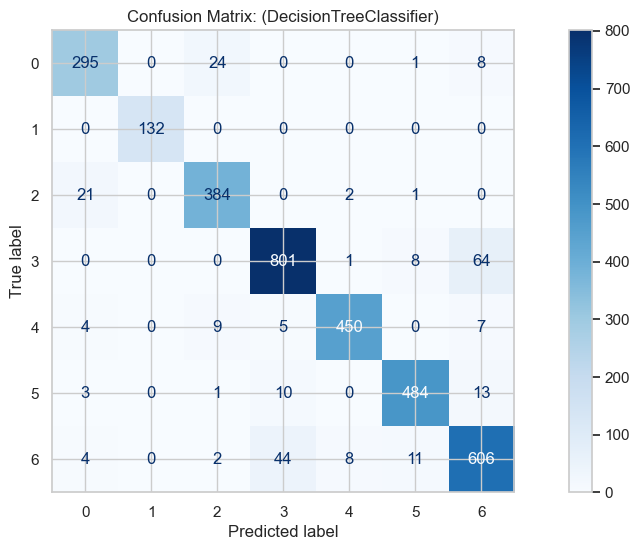

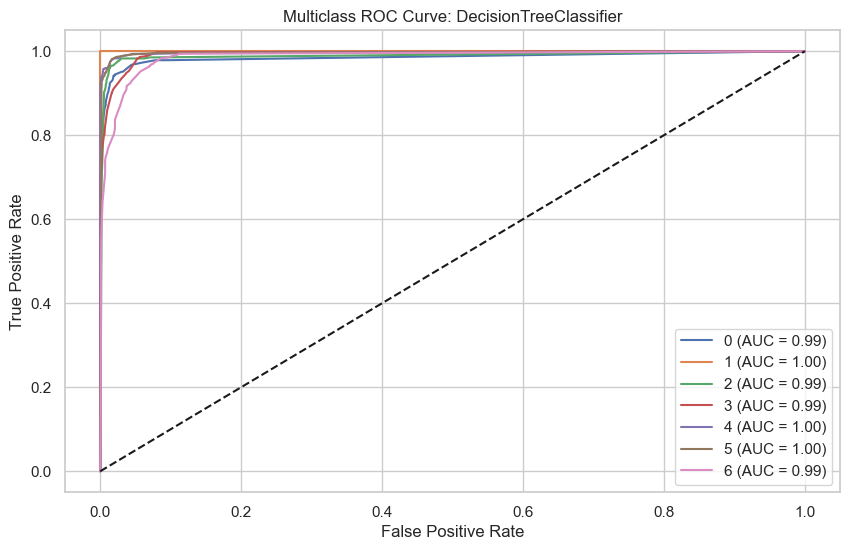

CV Accuracy: SVC : 0.6260146239382447


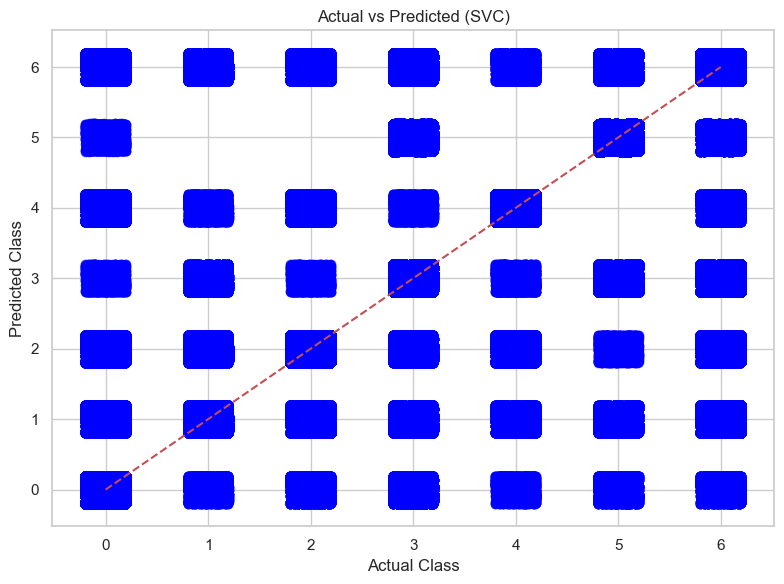

Classification Report: SVC
              precision    recall  f1-score   support

           0       0.83      0.58      0.68       328
           1       0.19      0.52      0.27       132
           2       0.50      0.50      0.50       408
           3       0.67      0.56      0.61       874
           4       0.79      0.86      0.82       475
           5       0.75      0.79      0.77       511
           6       0.53      0.48      0.50       675

    accuracy                           0.61      3403
   macro avg       0.61      0.61      0.59      3403
weighted avg       0.65      0.61      0.62      3403



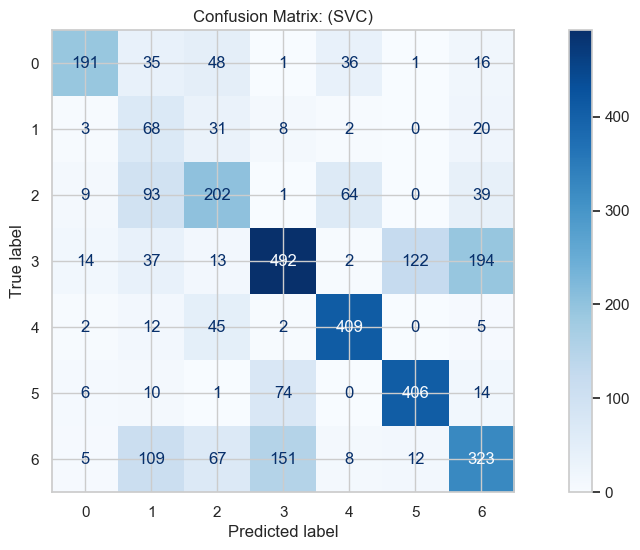

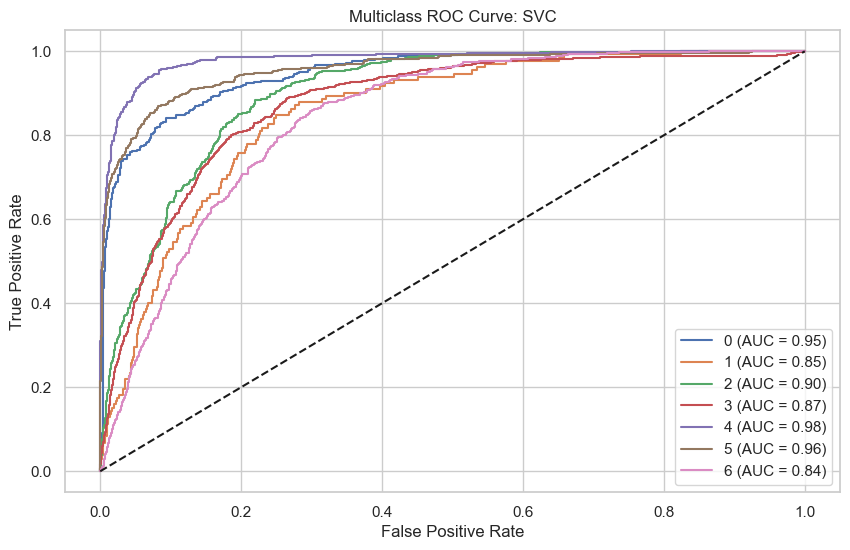

CV Accuracy: RandomForestClassifier : 0.9508421660494337


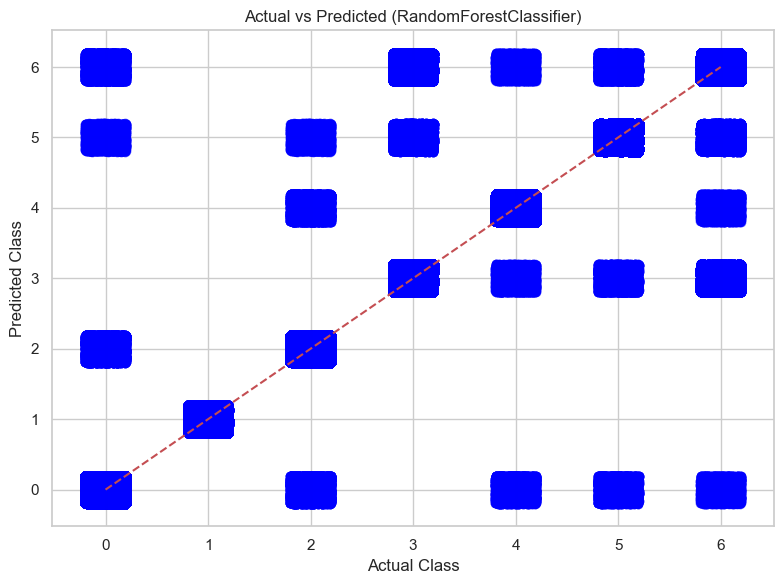

Classification Report: RandomForestClassifier
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       328
           1       1.00      1.00      1.00       132
           2       0.99      0.98      0.99       408
           3       0.98      0.98      0.98       874
           4       0.99      0.99      0.99       475
           5       0.98      0.99      0.98       511
           6       0.96      0.97      0.97       675

    accuracy                           0.98      3403
   macro avg       0.98      0.98      0.98      3403
weighted avg       0.98      0.98      0.98      3403



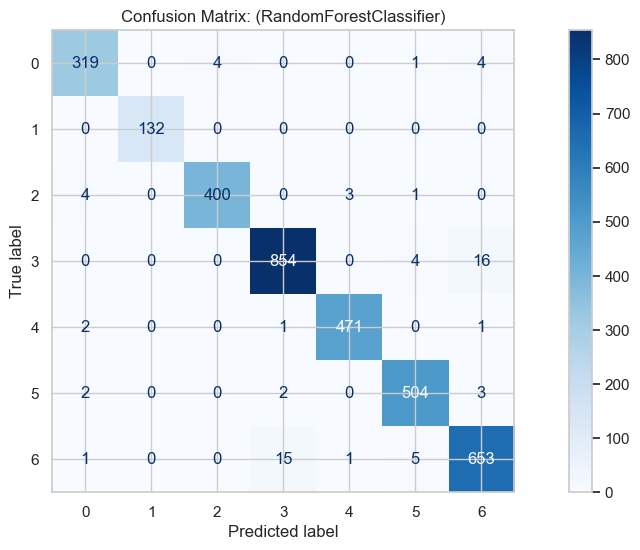

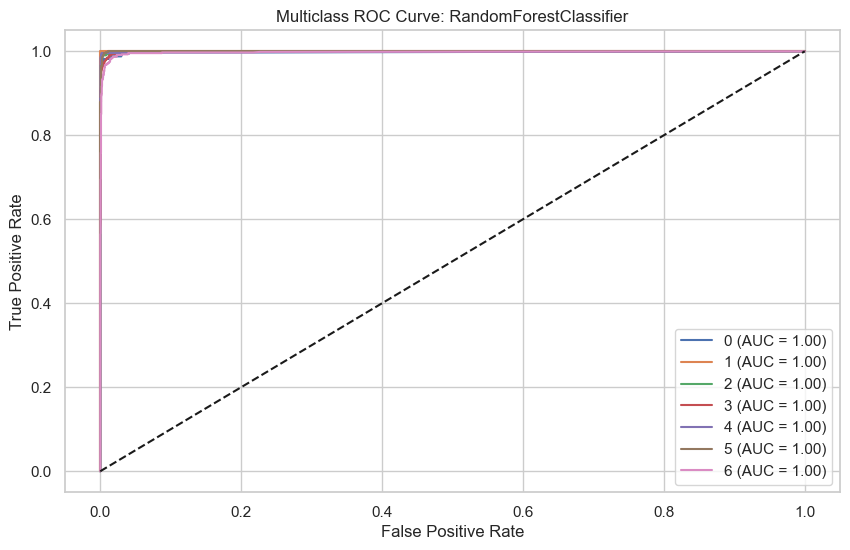

CV Accuracy: GradientBoostingClassifier : 0.9541729577081801


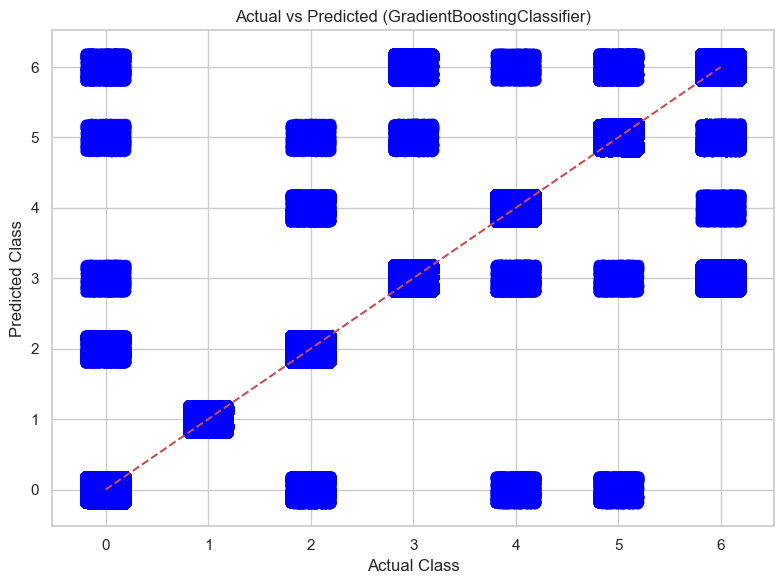

Classification Report: GradientBoostingClassifier
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       328
           1       1.00      1.00      1.00       132
           2       0.99      0.98      0.99       408
           3       0.98      0.98      0.98       874
           4       0.99      0.99      0.99       475
           5       0.98      0.99      0.99       511
           6       0.96      0.97      0.97       675

    accuracy                           0.98      3403
   macro avg       0.98      0.98      0.98      3403
weighted avg       0.98      0.98      0.98      3403



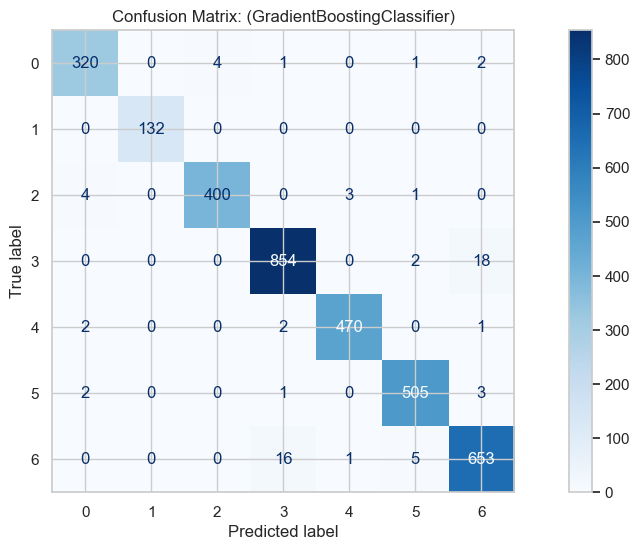

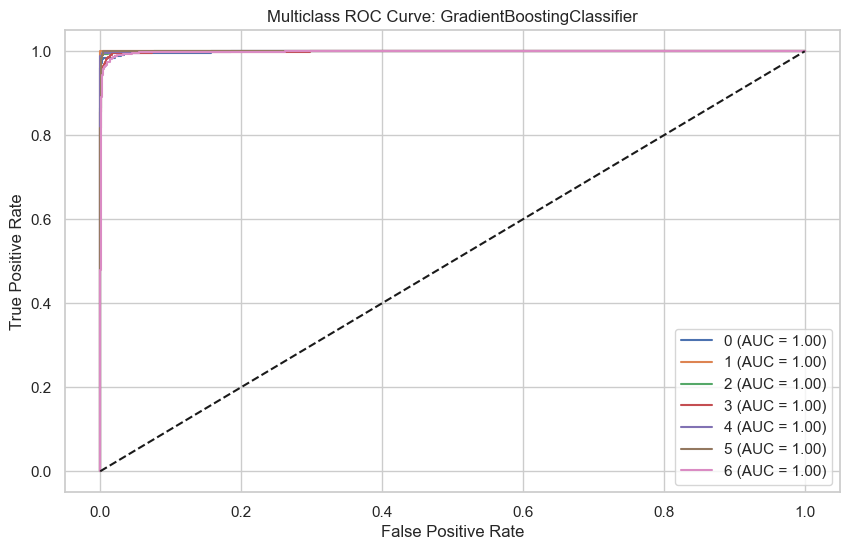

CV Accuracy: XGBClassifier : 0.9564295635002251


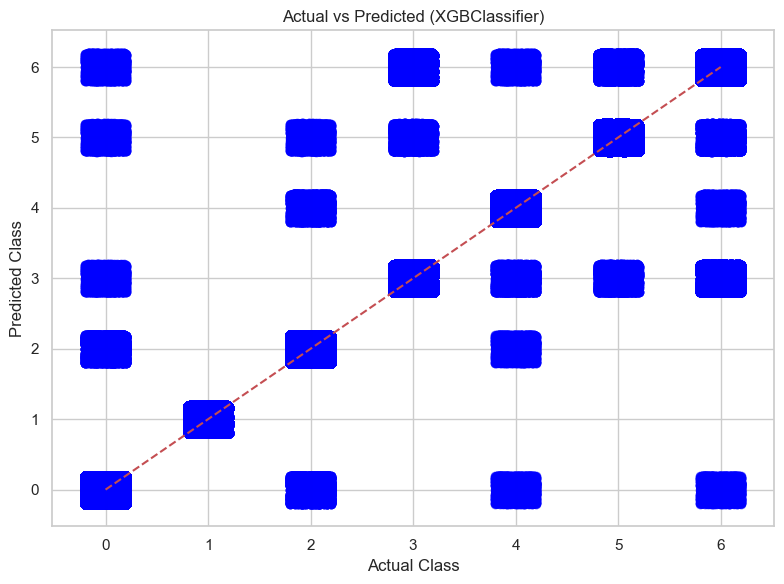

Classification Report: XGBClassifier
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       328
           1       1.00      1.00      1.00       132
           2       0.99      0.98      0.99       408
           3       0.98      0.97      0.98       874
           4       0.99      0.99      0.99       475
           5       0.99      0.99      0.99       511
           6       0.96      0.97      0.97       675

    accuracy                           0.98      3403
   macro avg       0.98      0.98      0.98      3403
weighted avg       0.98      0.98      0.98      3403



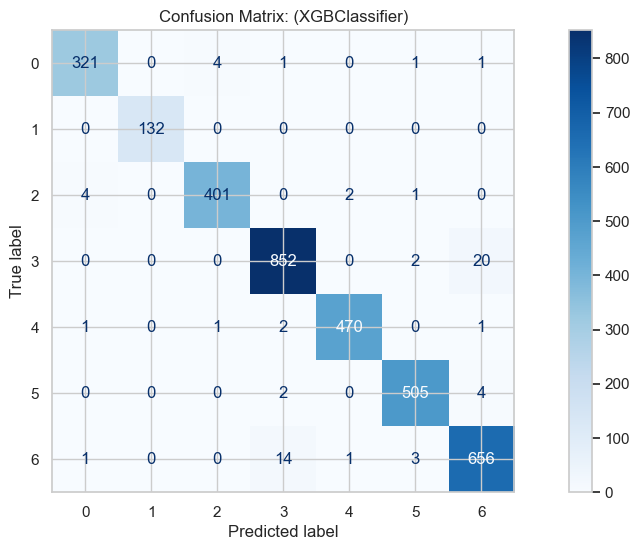

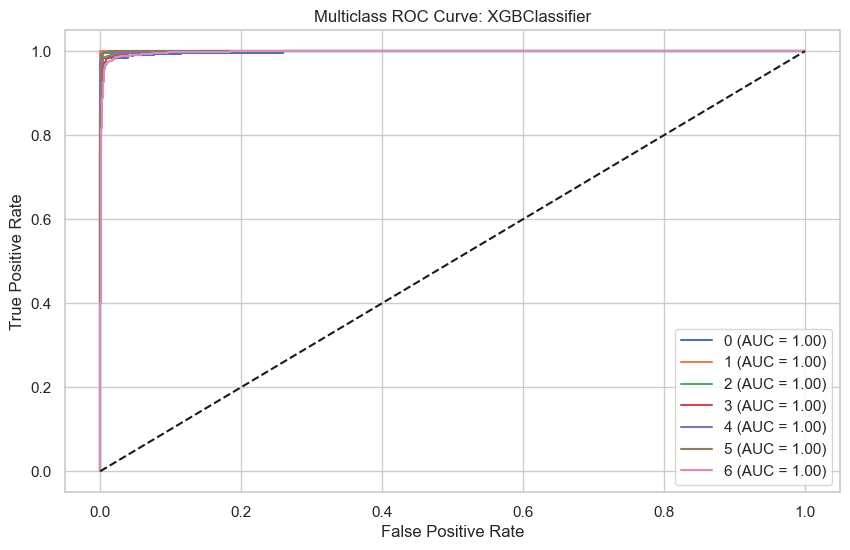

CV Accuracy: LGBMClassifier : 0.9556773808137198


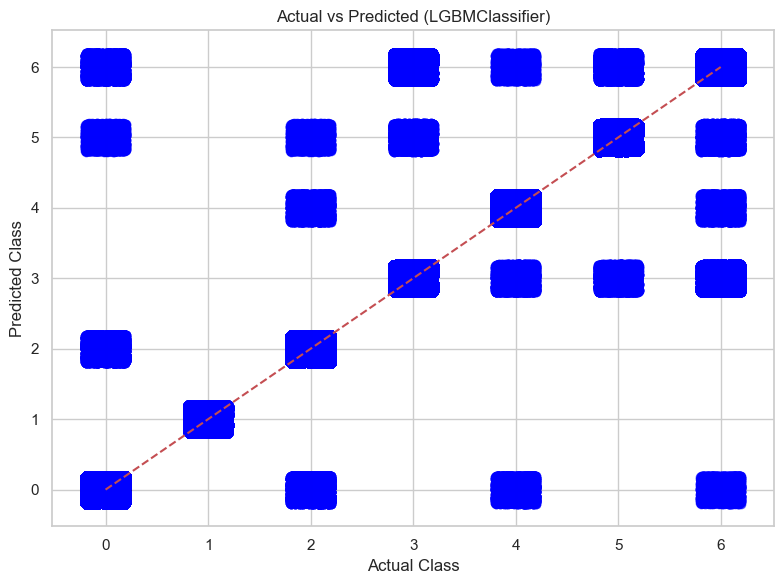

Classification Report: LGBMClassifier
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       328
           1       1.00      1.00      1.00       132
           2       0.99      0.98      0.99       408
           3       0.98      0.97      0.98       874
           4       0.99      0.99      0.99       475
           5       0.98      0.99      0.99       511
           6       0.96      0.97      0.96       675

    accuracy                           0.98      3403
   macro avg       0.98      0.98      0.98      3403
weighted avg       0.98      0.98      0.98      3403



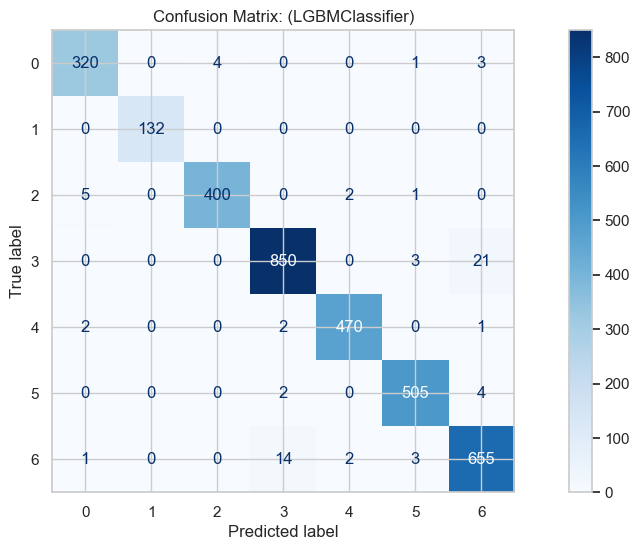

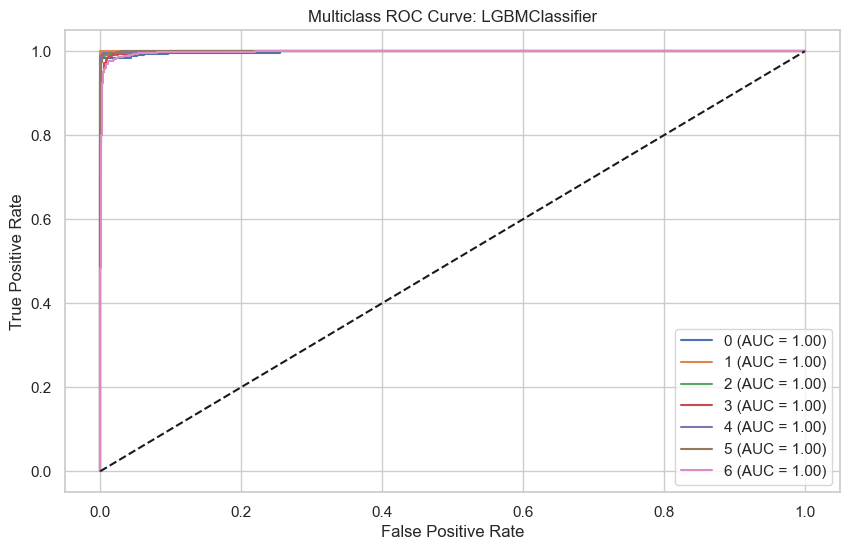

CV Accuracy: CatBoostClassifier : 0.9542803546451519


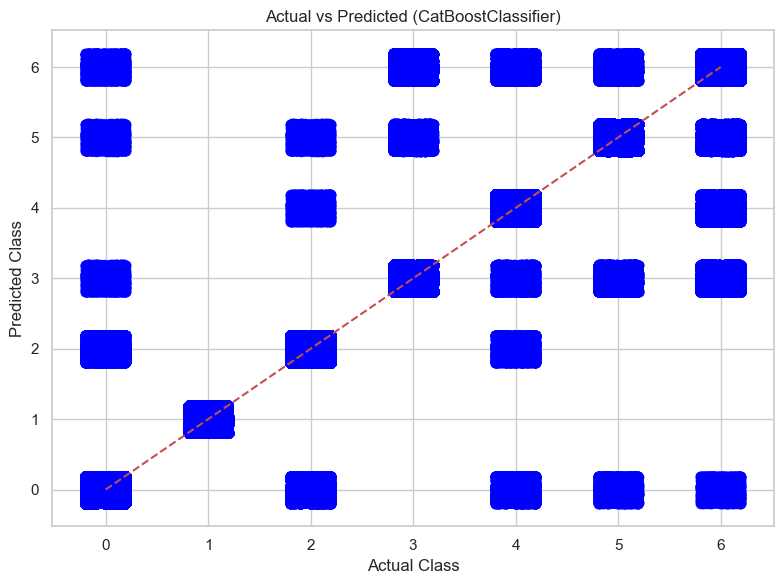

Classification Report: CatBoostClassifier
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       328
           1       1.00      1.00      1.00       132
           2       0.97      0.98      0.97       408
           3       0.96      0.97      0.97       874
           4       0.99      0.97      0.98       475
           5       0.98      0.98      0.98       511
           6       0.95      0.94      0.94       675

    accuracy                           0.97      3403
   macro avg       0.97      0.97      0.97      3403
weighted avg       0.97      0.97      0.97      3403



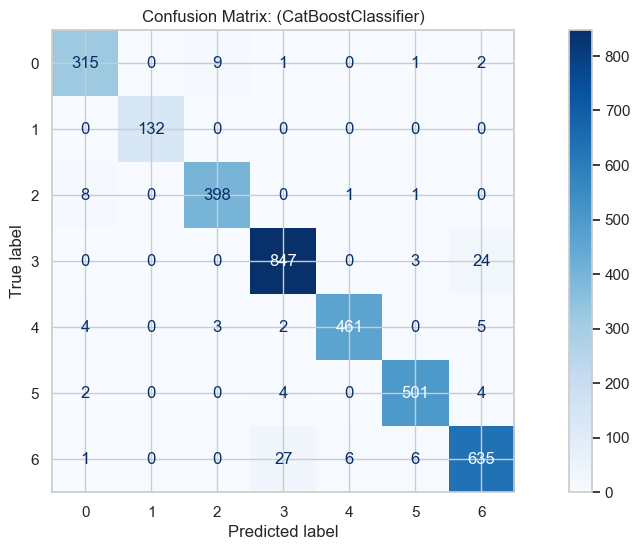

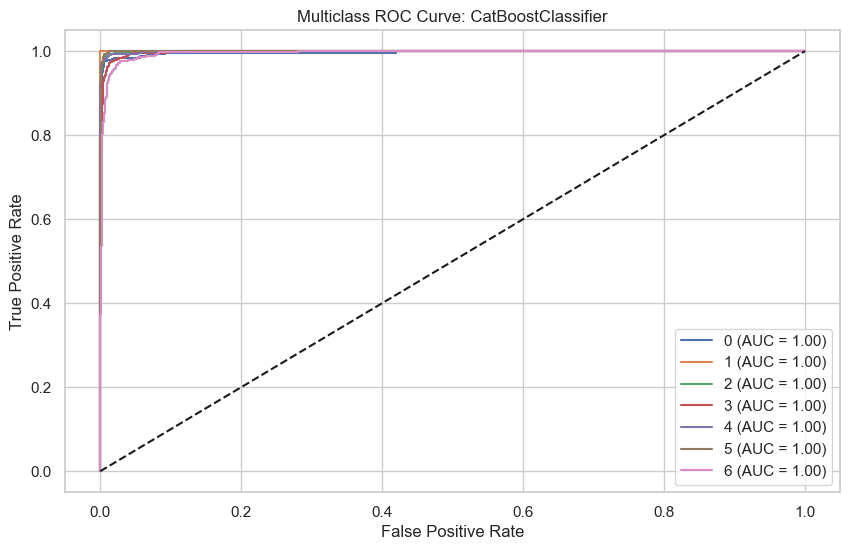

CV Accuracy: AdaBoostClassifier : 0.9400971465264576


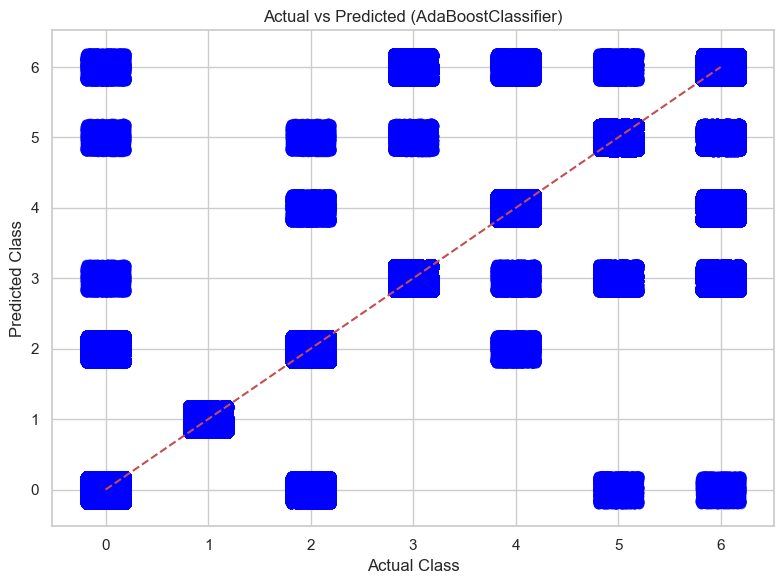

Classification Report: AdaBoostClassifier
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       328
           1       1.00      1.00      1.00       132
           2       0.95      0.96      0.95       408
           3       0.93      0.96      0.94       874
           4       0.96      0.97      0.97       475
           5       0.98      0.98      0.98       511
           6       0.93      0.88      0.90       675

    accuracy                           0.95      3403
   macro avg       0.96      0.95      0.96      3403
weighted avg       0.95      0.95      0.95      3403



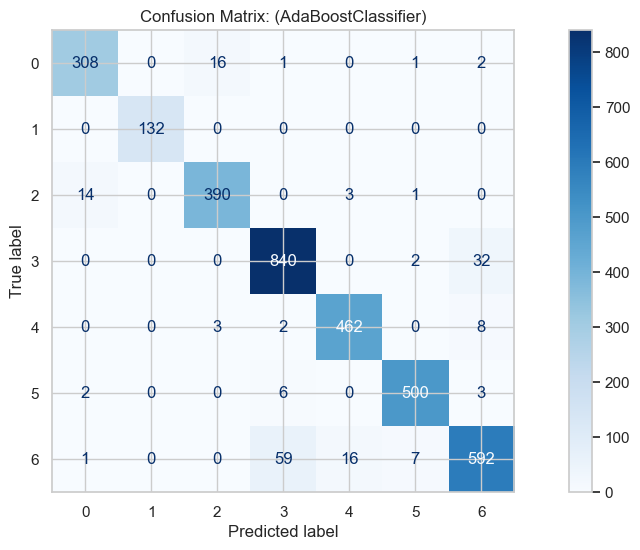

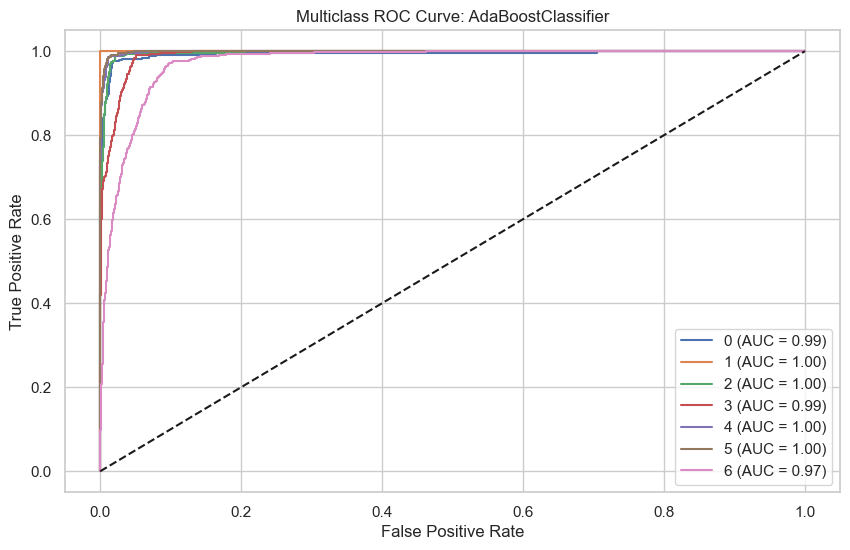

CV Accuracy: VotingClassifier : 0.9120519396469916


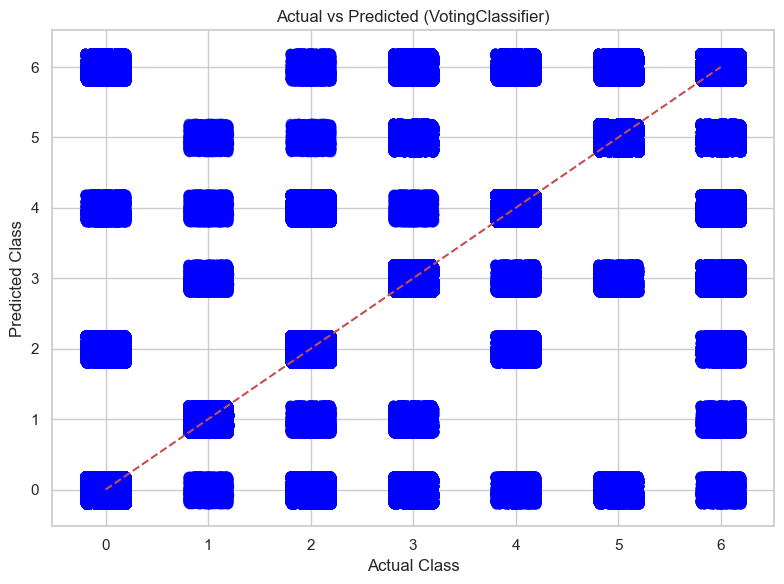

Classification Report: VotingClassifier
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       328
           1       0.92      0.96      0.94       132
           2       0.89      0.87      0.88       408
           3       0.92      0.85      0.88       874
           4       0.93      0.95      0.94       475
           5       0.91      0.94      0.92       511
           6       0.83      0.87      0.85       675

    accuracy                           0.89      3403
   macro avg       0.89      0.90      0.89      3403
weighted avg       0.89      0.89      0.89      3403



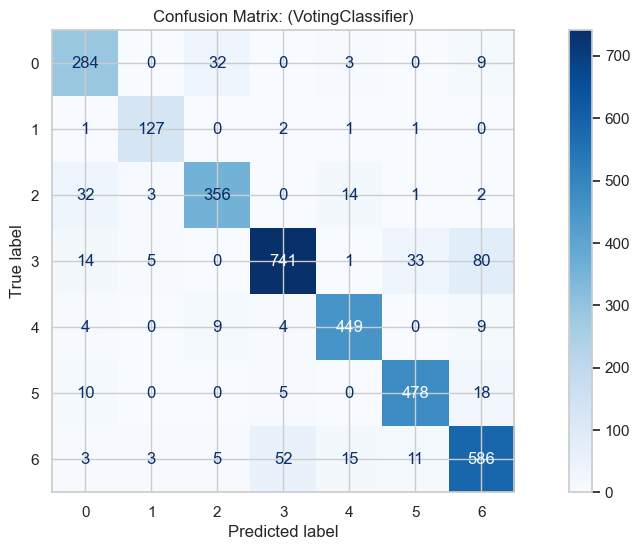

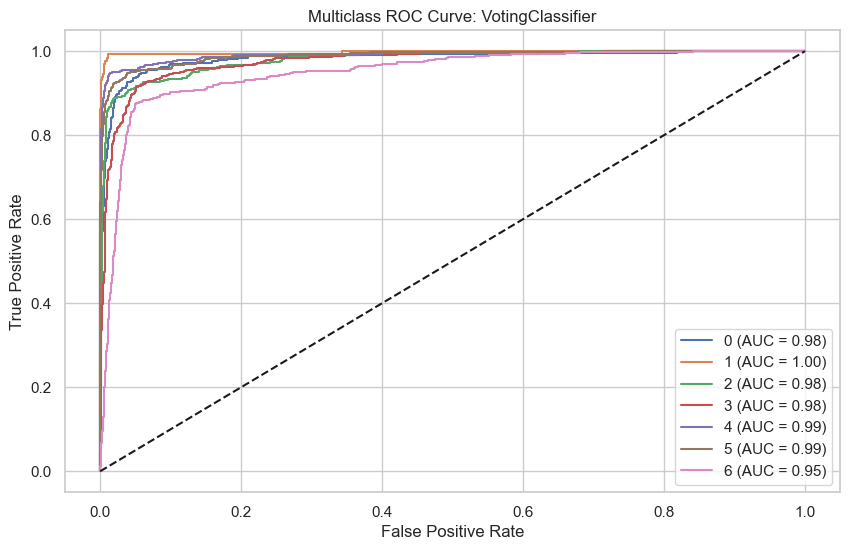


Model Comparison:



,Model,Train_Accuracy,Test_Accuracy,Precision,Test_Recall,Test_F1 Score,Overfitting,Overfitting Flag,Underfitting Flag
7,XGBoost,0.999946,0.980605,0.980652,0.980605,0.980621,0.0193,N,N
6,Gradient Boosting,1.000000,0.979724,0.979746,0.979724,0.979730,0.0203,N,N
5,Random Forest,1.000000,0.979430,0.979452,0.979430,0.979435,0.0206,N,N
8,LightGBM,0.999839,0.979136,0.979207,0.979136,0.979156,0.0207,N,N
9,CatBoost,0.987267,0.966500,0.966522,0.966500,0.966495,0.0208,N,N
10,AdaBoost,0.974158,0.947399,0.947396,0.947399,0.947152,0.0268,N,N
3,Decision Tree,0.953473,0.926242,0.926952,0.926242,0.926474,0.0272,N,N
2,Naive Bayes,0.916510,0.893036,0.894119,0.893036,0.893121,0.0235,N,N
11,VotingClassifier,0.913555,0.887746,0.889083,0.887746,0.887819,0.0258,N,N
1,KNN,0.799656,0.705554,0.737199,0.705554,0.714629,0.0941,Y,Y


,7
Model,XGBoost
Train_Accuracy,0.999946
Test_Accuracy,0.980605
Precision,0.980652
Test_Recall,0.980605
Test_F1 Score,0.980621
Overfitting,0.0193
Overfitting Flag,N
Underfitting Flag,N


In [266]:
x_train_resampled,y_train_resampled,x_test,y_test = smote(x_pca)
model_evaluation(x_train_resampled,y_train_resampled,x_test,y_test)

### PCA with Over Sampling

In [ ]:
x_train_resampled,y_train_resampled,x_test,y_test = random_over_sampling(x_pca)
model_evaluation(x_train_resampled,y_train_resampled,x_test,y_test)

### PCA with Under Sampling

In [ ]:
x_train_resampled,y_train_resampled,x_test,y_test = random_under_sampling(x_pca)
model_evaluation(x_train_resampled,y_train_resampled,x_test,y_test)

## Raw Model

In [249]:
x_train, y_train,x_validation, y_validation = split_scale(scale_handle=scale,df=transformed_beans,target_col=target_col,flag=True,scale=False)
model_evaluation(x_train,y_train,x_validation, y_validation )

# Performance Definitions

**Model**         – Name of the classifier being evaluated  
**Accuracy**      – (TP + TN) / (TP + TN + FP + FN): Overall correct predictions  
**Precision**     – TP / (TP + FP): How many predicted positives were actually correct?How many predicted positives were actually correct?  
**Recall**        – TP / (TP + FN): How many actual positives did we correctly identify?How many actual positives did we correctly identify?  
**F1 Score**      – 2 * (Precision * Recall) / (Precision + Recall): Harmonic mean of precision and recall.Balances precision and recall.  
**Support**       – Number of true instances of each class  
**Overfitting**   – Training Accuracy - Validation Accuracy: Higher values may indicate overfitting  


# Streamlit Deployment

## Best Model

In [280]:
import joblib
model = XGBClassifier(random_state=42, verbosity=0,colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, 
                                 n_estimators=200, subsample=0.8)
model.fit(x_train_resampled, y_train_resampled)
joblib.dump(model, 'model.pkl')

['model.pkl']

In [282]:

import streamlit as st
import joblib
import numpy as np
from PIL import Image

# Load the model
model = joblib.load('model.pkl')

# App title

image = Image.open('beans.png')
st.image(image, width=100)  
st.title("🫘 Dry Beans Prediction App")

# Input fields
area = st.slider('area', 4.0, 8.0, 5.0)
perimeter = st.slider('perimeter', 2.0, 4.5, 3.0)
ma_axis = st.slider('major_axis', 1.0, 7.0, 4.0)
mi_axis = st.slider('minor_axis', 0.1, 2.5, 1.0)
eccentricity = st.slider('eccentricity', 4.0, 8.0, 5.0)
convex = st.slider('convex', 4.0, 8.0, 5.0)
diameter = st.slider('diameter', 4.0, 8.0, 5.0)
extent = st.slider('extent', 4.0, 8.0, 5.0)
solidity = st.slider('solidity', 4.0, 8.0, 5.0)
roundness =  st.slider('roundness', 4.0, 8.0, 5.0)
compactness =  st.slider('compactness', 4.0, 8.0, 5.0)

# Predict button
if st.button('Predict'):
    input_data = np.array([[area, perimeter, ma_axis, mi_axis,eccentricity,convex,diameter,extent,solidity,roundness,compactness]])
    prediction = model.predict(input_data)
    species = ['DERMASON', 'SIRA', 'SEKER','HOROZ','CALI',"BARBUNYA","BOMBAY"]
    st.success(f'Predicted species: **{species[prediction[0]]}**')

In [283]:
#streamlit run app.py